In [1]:
from utils import *
%matplotlib inline

In [2]:
# Prepare object points
# Read in and make a list of calibration images
# glob allows us to read in files with consistent file names
# e.g. calibration-1.jpg, calibration-2.jpg...

nx = 9 # inside corners in any given row
ny = 6 # inside corners in any given column
images = glob.glob("camera_cal/calibration*.jpg")

# Initialise image and object point arrays
objpoints = []
imgpoints = []

# Generate object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x, y coordinates


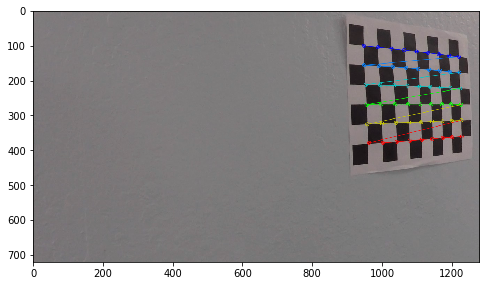

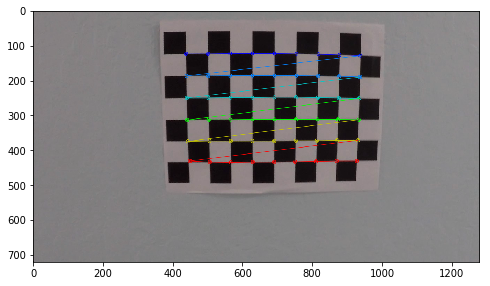

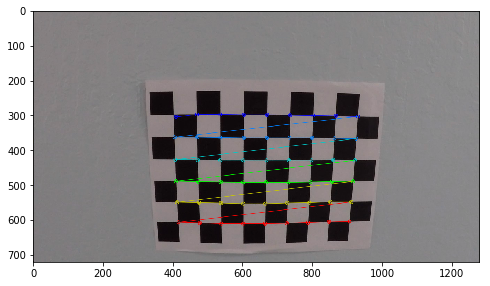

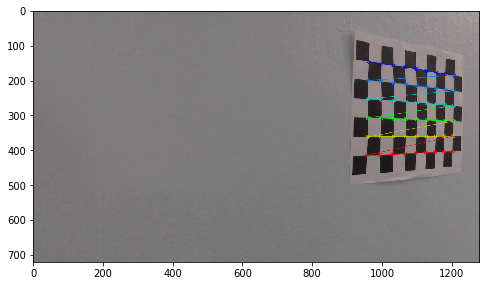

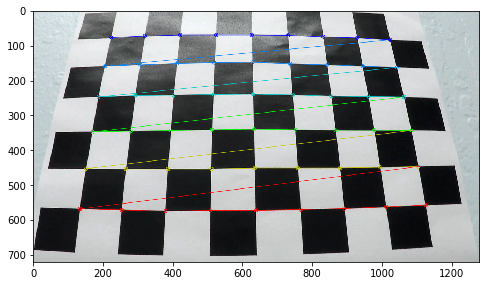

...

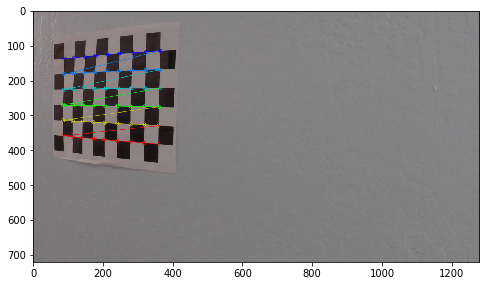

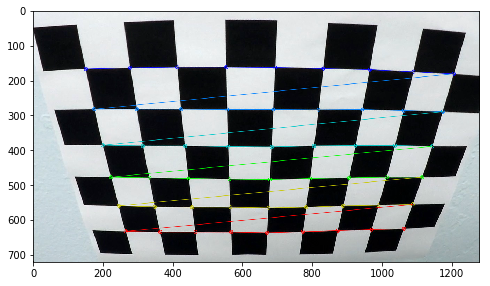

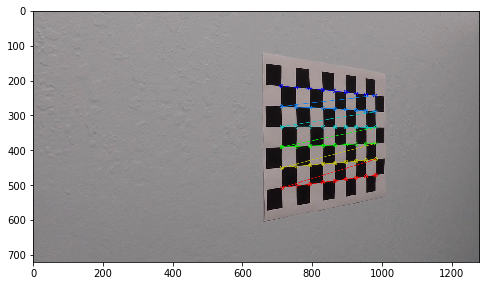

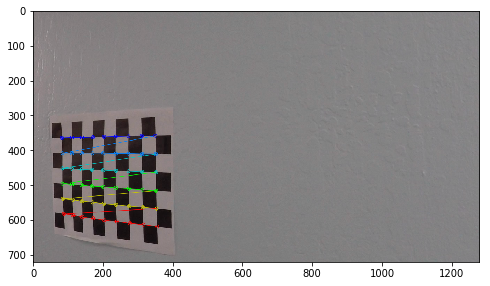

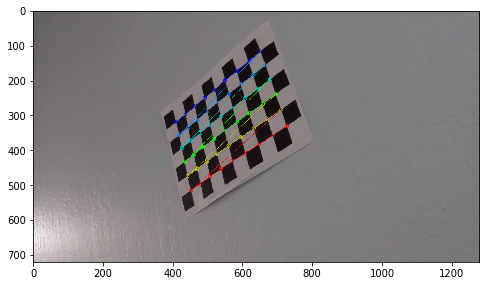

In [3]:
for fname in images:
    
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
        fig, ax = plt.subplots(figsize=(8, 5))
        
        plt.imshow(img)
        

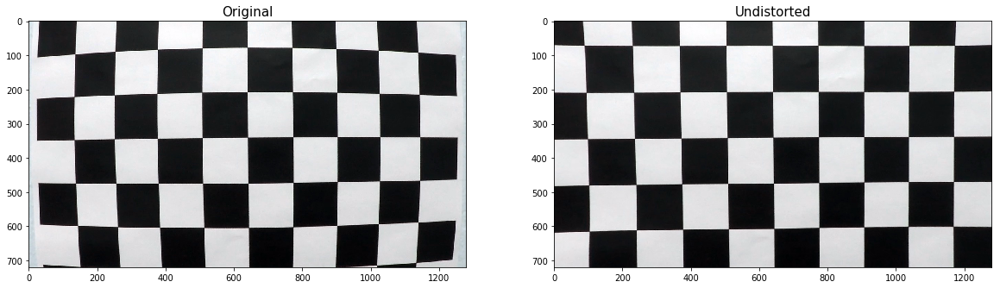

In [4]:
# try undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_calibration_result.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original', fontsize=15)
ax2.imshow(dst)
ax2.set_title('Undistorted', fontsize=15)

In [5]:
with open("camera_calibration_result.p", mode='rb') as f:
    camera_calib = pickle.load(f)
mtx = camera_calib["mtx"]
dist = camera_calib["dist"]


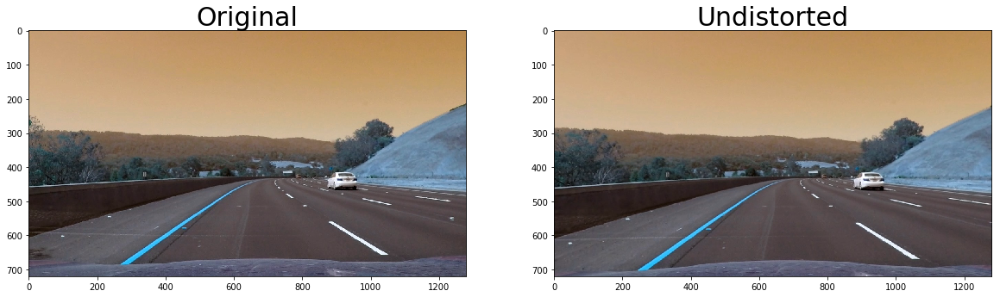

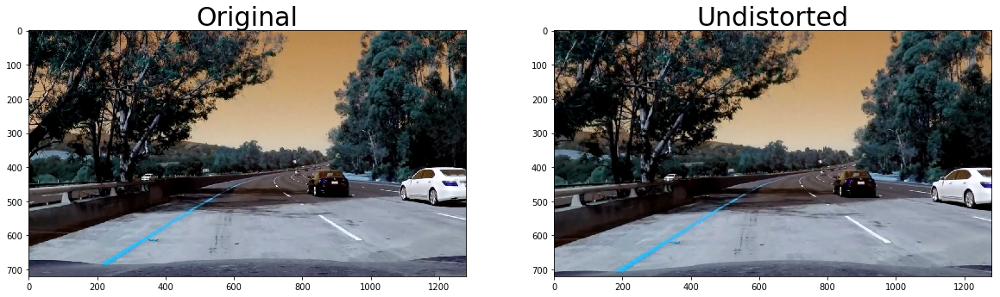

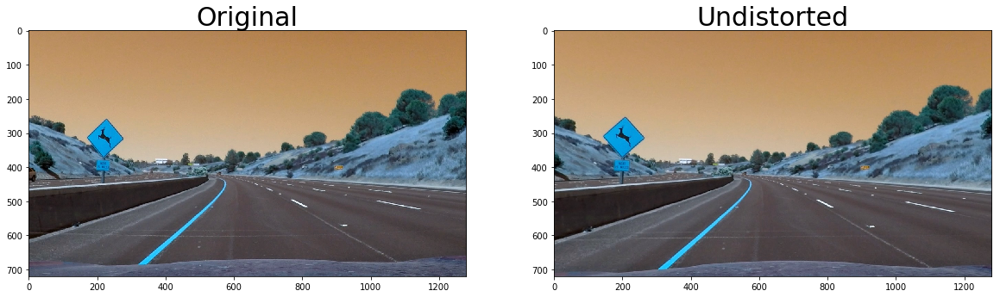

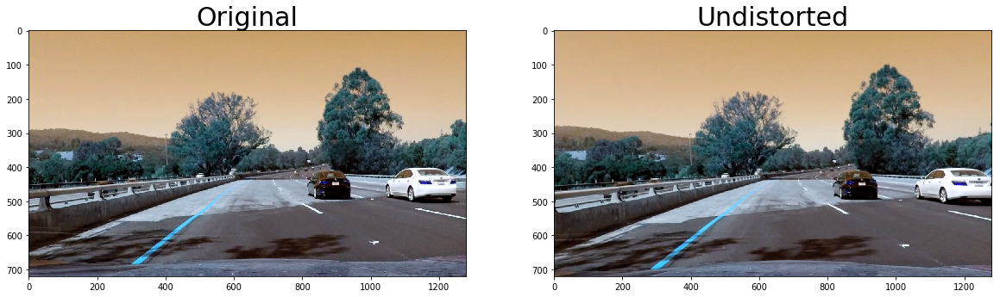

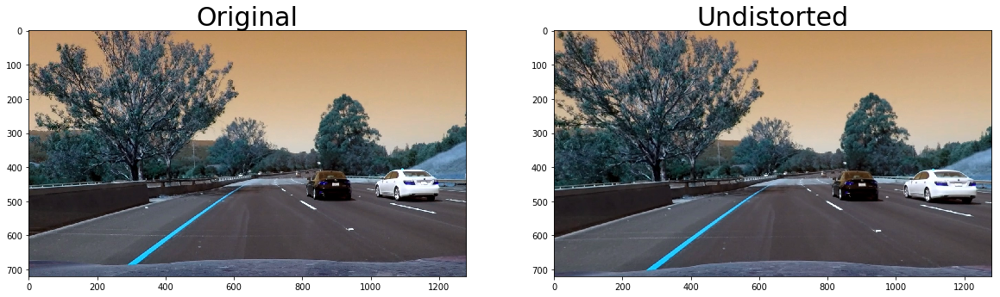

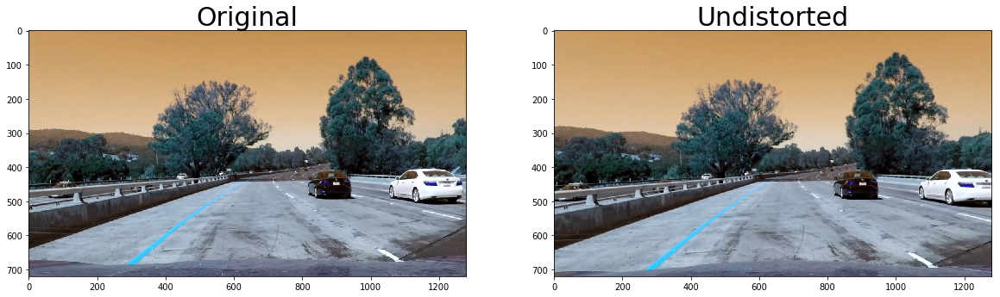

In [6]:
test_images = glob.glob("test_images/test*.jpg")
for fname in test_images:
    
    raw = cv2.imread(fname)


    #raw = cv2.imread("test_images/test1.jpg")

    image = cv2.undistort(raw, mtx, dist, None, mtx)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(raw)
    ax1.set_title('Original', fontsize=30)
    ax2.imshow(image)
    ax2.set_title('Undistorted', fontsize=30)

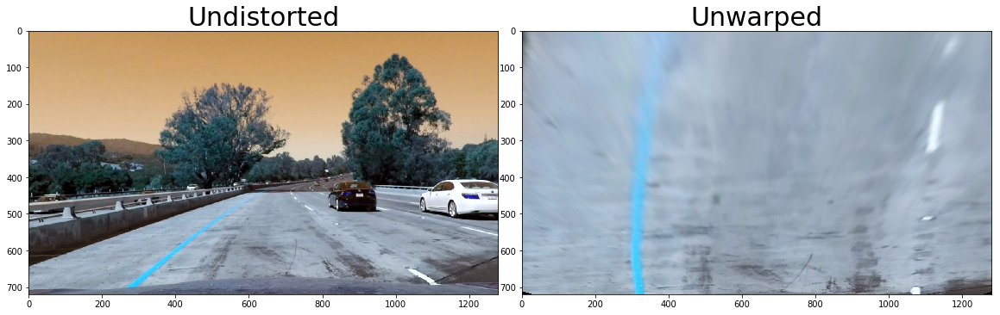

In [8]:
h,w = image.shape[:2]

# define source and destination points for transform
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])

dst = np.float32([(280,0),
                  (w-250,0),
                  (280,h),
                  (w-250,h)])


exampleImg_unwarp, M, Minv = unwarp(image, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(image)


ax1.set_title('Undistorted', fontsize=30)
ax2.imshow(exampleImg_unwarp)
ax2.set_title('Unwarped', fontsize=30)


In [9]:
# canvs parameters
imshape = raw.shape
height = raw.shape[0]
offset = 50
offset_height = height - offset
half_frame = raw.shape[1] // 2
steps = 6
pixels_per_step = offset_height / steps
window_radius = 200
medianfilt_kernel_size = 51
horizontal_offset = 40

blank_canvas = np.zeros((720, 1280))
colour_canvas = cv2.cvtColor(blank_canvas.astype(np.uint8), cv2.COLOR_GRAY2RGB)

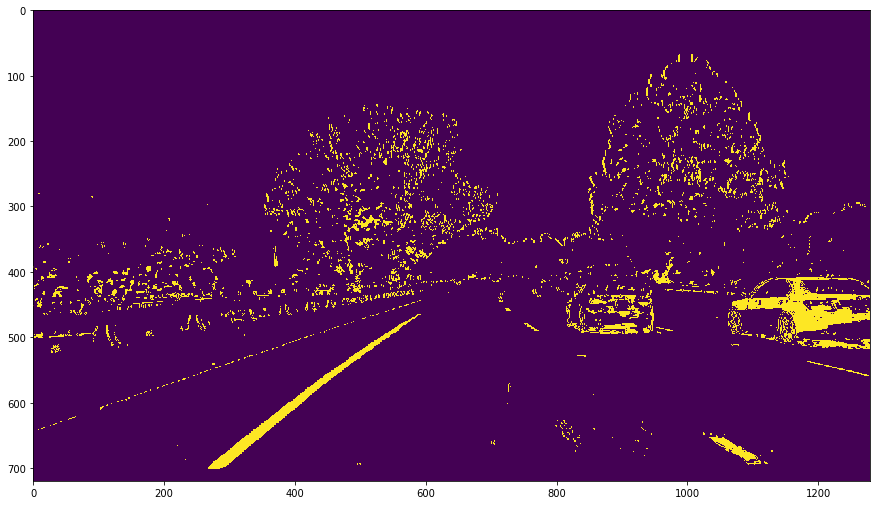

In [10]:
xgrad_thresh_temp = (40,100)
s_thresh_temp=(150,255)

combined_binary = app_thresh(image, xgrad_thresh=xgrad_thresh_temp, s_thresh=s_thresh_temp)

ax3 = plt.subplots(1, figsize=(15,10))
ax3 = plt.imshow(combined_binary)


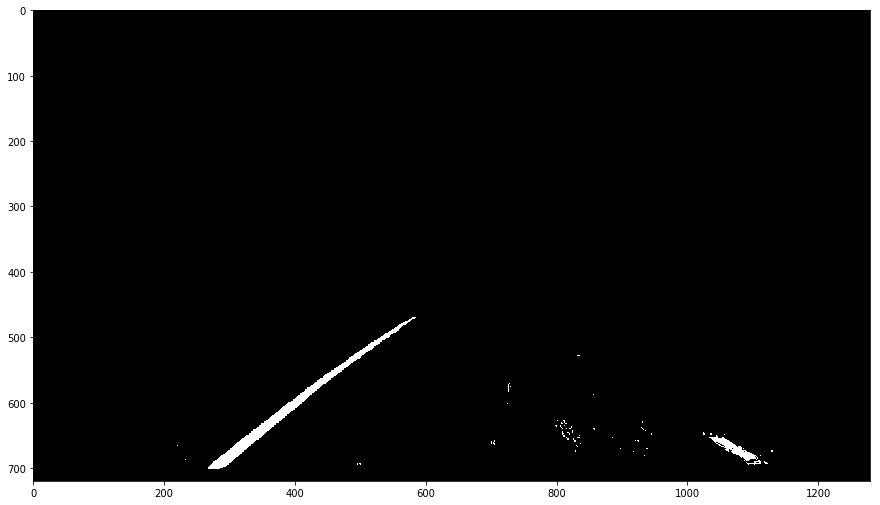

In [11]:
vertices = np.array([[(0, imshape[0]),(550, 470), (700, 470), (imshape[1],imshape[0])]], dtype=np.int32)
masked_image = roi(combined_binary, vertices)
ax4 = plt.subplots(1, figsize=(15,10))
plt.imshow(masked_image, cmap="gray")

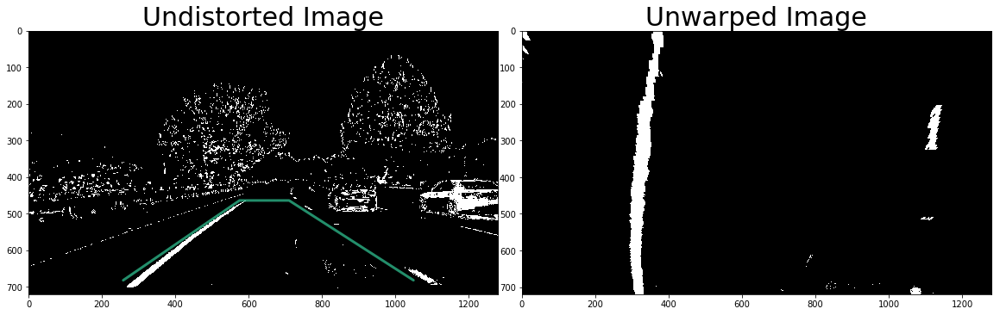

In [13]:
# h,w = combined_binary.shape[:2]

# # define source and destination points for transform


src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])

dst = np.float32([(280,0),
                  (w-250,0),
                  (280,h),
                  (w-250,h)])


exampleImg_unwarp, M, Minv = unwarp(combined_binary, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(combined_binary, cmap='gray')

x = (258, 575, 710, 1049)
y = (682, 464, 464, 682)



ax1.plot(x, y, color='#33cc99', alpha=0.7, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(exampleImg_unwarp, cmap='gray')
ax2.set_title('Unwarped Image', fontsize=30)


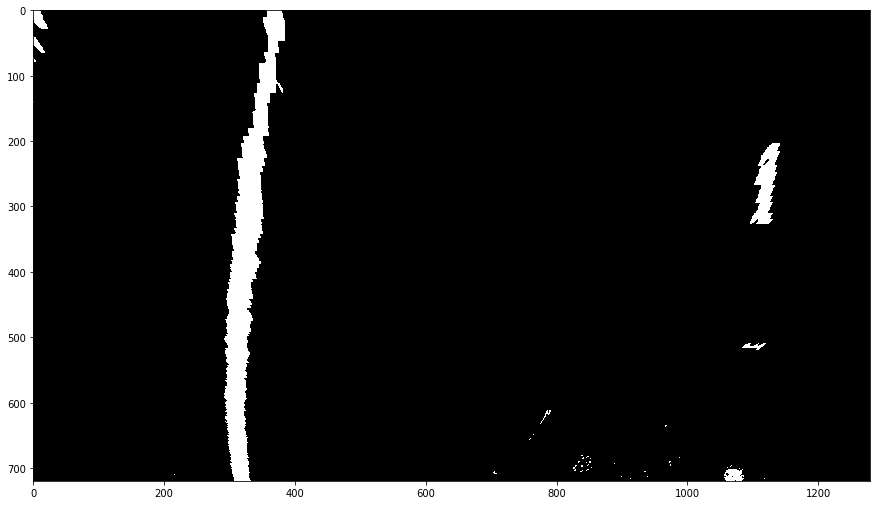

In [14]:
# src = np.float32(
#     [[120, 720],
#      [550, 470],
#      [700, 470],
#      [1160, 720]])

# dst = np.float32(
#     [[200,720],
#      [200,0],
#      [1080,0],
#      [1080,720]])



M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

# Warp onto birds-eye-view
# Previous region-of-interest mask's function is absorbed by the warp
warped = cv2.warpPerspective(combined_binary, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
ax5 = plt.subplots(1, figsize=(15,10))
plt.imshow(warped, cmap="gray")



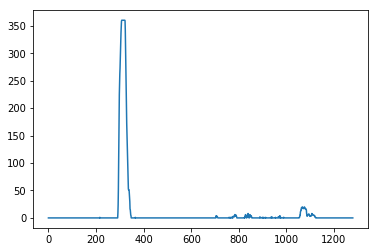

In [15]:
histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)


In [16]:

# # Assuming you have created a warped binary image called "binary_warped"
# # Take a histogram of the bottom half of the image
# histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
# # Create an output image to draw on and  visualize the result
# out_img = np.dstack((warped, warped, warped))*255
# # Find the peak of the left and right halves of the histogram
# # These will be the starting point for the left and right lines
# midpoint = np.int(histogram.shape[0]/2)
# leftx_base = np.argmax(histogram[:midpoint])
# rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# # Choose the number of sliding windows
# nwindows = 9
# # Set height of windows
# window_height = np.int(warped.shape[0]/nwindows)
# # Identify the x and y positions of all nonzero pixels in the image
# nonzero = warped.nonzero()
# nonzeroy = np.array(nonzero[0])
# nonzerox = np.array(nonzero[1])
# # Current positions to be updated for each window
# leftx_current = leftx_base
# rightx_current = rightx_base
# # Set the width of the windows +/- margin
# margin = 100
# # Set minimum number of pixels found to recenter window
# minpix = 50
# # Create empty lists to receive left and right lane pixel indices
# left_lane_inds = []
# right_lane_inds = []

# # Step through the windows one by one
# for window in range(nwindows):
#     # Identify window boundaries in x and y (and right and left)
#     win_y_low = warped.shape[0] - (window+1)*window_height
#     win_y_high = warped.shape[0] - window*window_height
#     win_xleft_low = leftx_current - margin
#     win_xleft_high = leftx_current + margin
#     win_xright_low = rightx_current - margin
#     win_xright_high = rightx_current + margin
#     # Draw the windows on the visualization image
#     cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
#     cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
#     # Identify the nonzero pixels in x and y within the window
#     good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
#     good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
#     # Append these indices to the lists
#     left_lane_inds.append(good_left_inds)
#     right_lane_inds.append(good_right_inds)
#     # If you found > minpix pixels, recenter next window on their mean position
#     if len(good_left_inds) > minpix:
#         leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
#     if len(good_right_inds) > minpix:        
#         rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# # Concatenate the arrays of indices
# left_lane_inds = np.concatenate(left_lane_inds)
# right_lane_inds = np.concatenate(right_lane_inds)

# # Extract left and right line pixel positions
# leftx = nonzerox[left_lane_inds]
# lefty = nonzeroy[left_lane_inds] 
# rightx = nonzerox[right_lane_inds]
# righty = nonzeroy[right_lane_inds] 

# # Fit a second order polynomial to each
# left_fit = np.polyfit(lefty, leftx, 2)
# right_fit = np.polyfit(righty, rightx, 2)

In [17]:
# # Generate x and y values for plotting
# ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
# left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
# right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
# out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# plt.subplots(1, figsize=(15,10))
# plt.imshow(out_img)
# plt.plot(left_fitx, ploty)
# plt.plot(right_fitx, ploty)
# plt.xlim(0, 1280)
# plt.ylim(720, 0)



Left coeffs: [  1.82594378e-04  -2.19682137e-01   3.77678090e+02]
righty[0]: , 693.0 , rightx[0]:  954
Right coeffs:  [ -2.81185360e-05  -8.63843649e-02   1.14595945e+03]


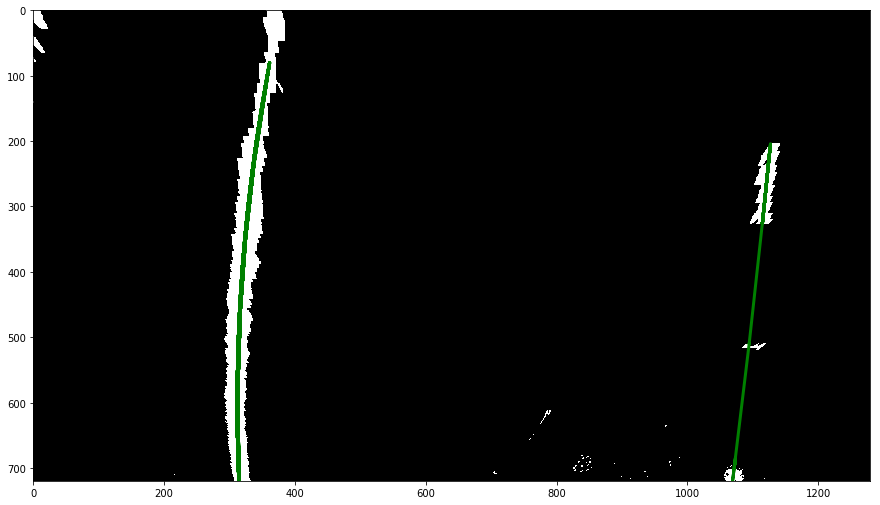

In [18]:
# Histogram and get pixels in window

leftx, lefty, rightx, righty = hist_pixels(warped, horizontal_offset=horizontal_offset)

# Fit a second order polynomial to each fake lane line
left_fit, left_coeffs = fit_second_order_poly(lefty, leftx, return_coeffs=True)
print("Left coeffs:", left_coeffs)
print("righty[0]: ,", righty[0], ", rightx[0]: ", rightx[0])
right_fit, right_coeffs = fit_second_order_poly(righty, rightx, return_coeffs=True)
print("Right coeffs: ", right_coeffs)

# Plot data
ax6 = plt.subplots(1, figsize=(15,10))
plt.plot(left_fit, lefty, color='green', linewidth=3)
plt.plot(right_fit, righty, color='green', linewidth=3)
plt.imshow(warped, cmap="gray")

Left coeffs:  [  1.82594378e-04  -2.19682137e-01   3.77678090e+02]
Right fit:  [ -2.81185360e-05  -8.63843649e-02   1.14595945e+03]


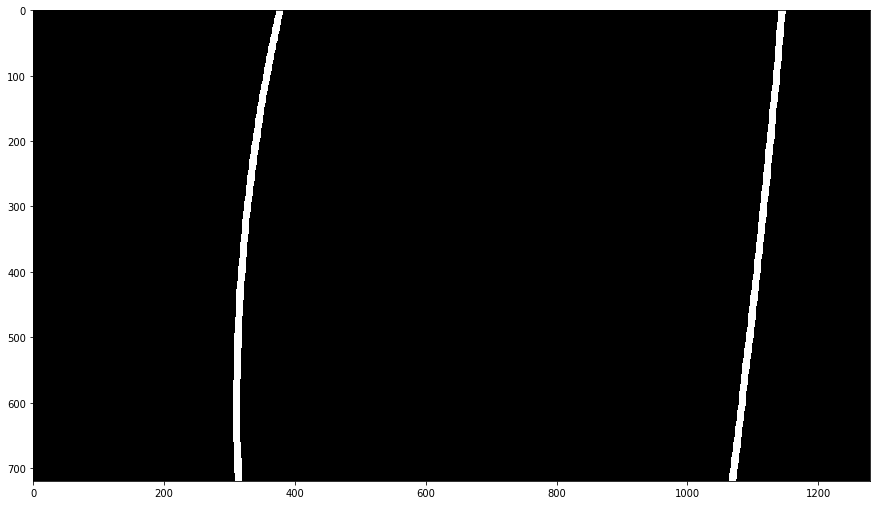

In [19]:
print("Left coeffs: ", left_coeffs)
print("Right fit: ", right_coeffs)
polyfit_left = draw_poly(blank_canvas, lane_poly, left_coeffs, 30)
polyfit_drawn = draw_poly(polyfit_left, lane_poly, right_coeffs, 30)
ax7 = plt.subplots(1, figsize=(15,10))
plt.imshow(polyfit_drawn, cmap="gray")



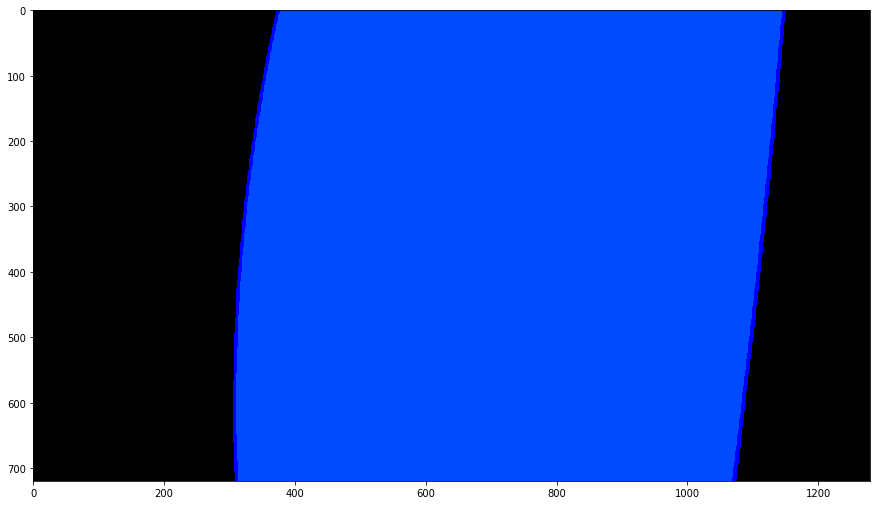

In [20]:
# trace = colour_canvas
# trace[polyfit_drawn > 1] = [0,0,255]
# area = highlight_lane_line_area(blank_canvas, left_coeffs, left_coeffs)
# trace[area == 1] = [0,255,0]
# ax8 = plt.subplots(1, figsize=(15, 10))
# plt.imshow(trace)

trace = colour_canvas
trace[polyfit_drawn > 1] = [0,0,255]
area = highlight_lane_line_area(blank_canvas, left_coeffs, right_coeffs)
trace[area == 1] = [0,75,255]
ax8 = plt.subplots(1, figsize=(15, 10))
plt.imshow(trace)



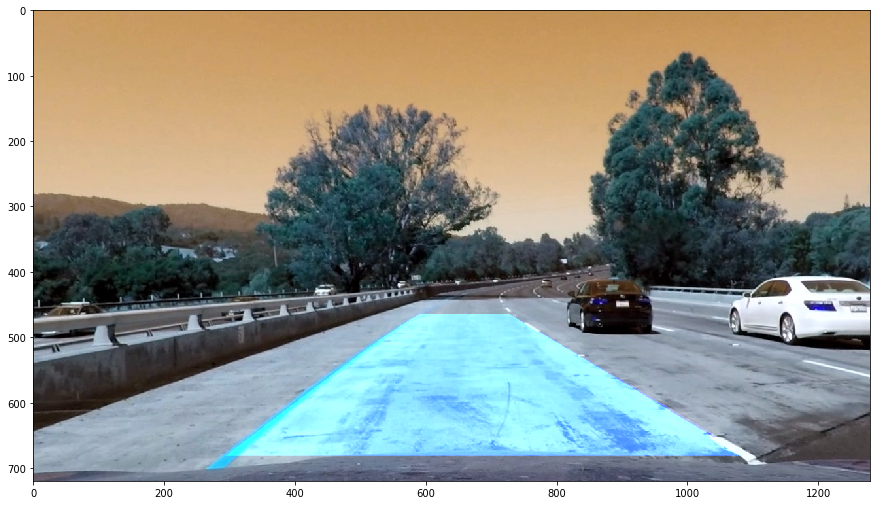

In [21]:
# Warp lane boundaries back onto original image
lane_lines = cv2.warpPerspective(trace, Minv, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)

# Convert to colour
combined_img = cv2.add(lane_lines, image)
plt.subplots(1, figsize=(15, 10))
plt.imshow(combined_img)

In [22]:
# Determine curvature of the lane
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = 500
left_curverad = np.absolute(((1 + (2 * left_coeffs[0] * y_eval + left_coeffs[1])**2) ** 1.5) \
                /(2 * left_coeffs[0]))
right_curverad = np.absolute(((1 + (2 * right_coeffs[0] * y_eval + right_coeffs[1]) ** 2) ** 1.5) \
                 /(2 * right_coeffs[0]))
print("Left lane curve radius: ", left_curverad, "pixels")
print("Right lane curve radius: ", right_curverad, "pixels")
curvature = (left_curverad + right_curverad) / 2
centre = center(719, left_coeffs, right_coeffs)
min_curvature = min(left_curverad, right_curverad)



Left lane curve radius:  2743.96170835 pixels
Right lane curve radius:  18132.7130856 pixels


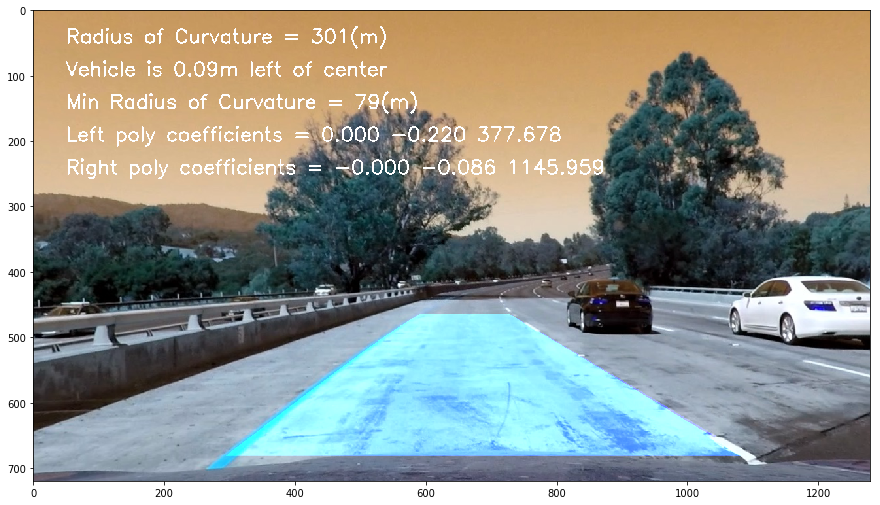

In [23]:
add_figures_to_image(combined_img, curvature=curvature, 
                     vehicle_position=centre, 
                     min_curvature=min_curvature,
                     left_coeffs=left_coeffs,
                     right_coeffs=right_coeffs)
plt.subplots(1, figsize=(15, 10))
plt.imshow(combined_img)



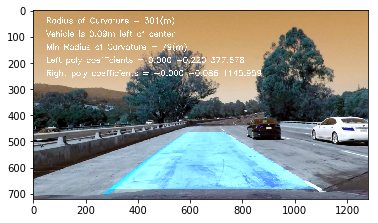

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from pipeline import *

[MoviePy] >>>> Building video project_output_colour.mp4
[MoviePy] Writing video project_output_colour.mp4


 46%|████▋     | 585/1261 [02:52<03:07,  3.60it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1040, 1041, 1041, ..., 1083, 1083, 1083])]


 47%|████▋     | 597/1261 [02:56<03:06,  3.57it/s]

Init no peaks for left or right
left_x:  [array([259, 259, 259, ..., 291, 291, 291]), array([254, 254, 254, ..., 287, 288, 288]), array([254, 254, 254, ..., 282, 282, 283])]
right_x:  []


 48%|████▊     | 600/1261 [02:57<03:27,  3.18it/s]

Init no peaks for left or right
left_x:  [array([249, 250, 250, ..., 331, 331, 332]), array([242, 242, 242, ..., 280, 281, 281]), array([237, 237, 237, ..., 270, 271, 271])]
right_x:  []


 48%|████▊     | 604/1261 [02:58<03:27,  3.17it/s]

Init no peaks for left or right
left_x:  [array([249, 249, 249, ..., 281, 281, 282]), array([247, 247, 248, ..., 278, 278, 278])]
right_x:  []
Init no peaks for left or right
left_x:  [array([249, 249, 249, ..., 281, 281, 282]), array([247, 247, 248, ..., 278, 278, 278])]
right_x:  []
Init no peaks for left or right
left_x:  [array([248, 248, 248, ..., 281, 281, 282]), array([247, 247, 247, ..., 278, 278, 278])]
right_x:  []


100%|█████████▉| 1260/1261 [06:21<00:00,  2.98it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output_colour.mp4 

CPU times: user 7min 14s, sys: 3.39 s, total: 7min 18s
Wall time: 6min 22s


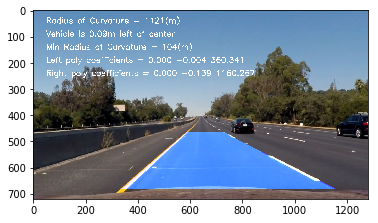

In [25]:
output = 'project_output_colour.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(image_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))


[MoviePy] >>>> Building video project_colour_challenge_video.mp4
[MoviePy] Writing video project_colour_challenge_video.mp4


  4%|▎         | 17/485 [00:04<02:25,  3.22it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 987, 1018, 1019, 1019, 1020, 1020, 1020, 1021, 1021, 1022, 1029,
       1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1030,
       1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030,
       1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 10

  4%|▎         | 18/485 [00:06<04:29,  1.73it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1019, 1020, 1021, 1021, 1022, 1023, 1023, 1024, 1027, 1028, 1028,
       1029, 1029, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030,
       1030, 1030, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034,
       1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1035, 1035,
       1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035,
       1036, 1036, 1036, 1036, 1036, 1036, 1036, 1036, 1036, 1036, 10

  4%|▍         | 19/485 [00:07<06:17,  1.23it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1017, 1018, 1018, 1019, 1019, 1020, 1020, 1021, 1021, 1022, 1022,
       1023, 1027, 1027, 1030, 1030, 1030, 1030, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1034, 1034, 1034,
       1034, 1034, 1034, 1034, 1035, 1035, 1035, 1036, 1036, 1036, 1036,
       1037, 1037, 1037, 1037, 1037, 1037, 1037, 1037, 1038, 1038, 1038,
       1038, 1038, 1038, 1038, 1038, 1038, 1038, 1038, 1038, 1038, 1038,
       1039, 1039, 1039, 1039, 1039, 1039, 1039, 1039, 1039, 1039, 1039,
       1039, 1039, 1039, 1039, 1039, 1039, 1039, 1039, 1040, 1040, 1040,
       1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1040, 1040, 1040, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 10

  4%|▍         | 21/485 [00:08<05:27,  1.41it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1004, 1004, 1004, 1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005,
       1005, 1005, 1006, 1006, 1006, 1006, 1006, 1006, 1006, 1006, 1006,
       1006, 1006, 1006, 1006, 1007, 1007, 1007, 1007, 1007, 1007, 1007,
       1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007,
       1007, 1007, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008,
       1008, 1008, 1008, 1008, 1008, 1008, 1008, 1009, 1009, 1009, 1009,
       1009, 1009, 1009, 1009, 1009, 1009, 1009, 1010, 1010, 1010, 1010,
       1010, 1010, 1011, 1011, 1011, 1011, 1011, 1012, 1012, 1012, 1018,
       1018, 1019, 1019, 1020, 1020, 1020, 1020, 1021, 1021, 1021, 1021,
       1042, 1043, 1044, 1044, 1044, 1044, 1045, 1045, 1045, 1045, 1045,
       1045, 1045, 1045, 1045, 1045, 1045, 1045, 1046, 1046, 1046, 1046,
       1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046,
       1046, 1046, 1046, 1046, 1047, 1047, 1047, 1047, 1047, 1047, 10

  5%|▍         | 24/485 [00:09<03:47,  2.03it/s]

Init no peaks for left or right
left_x:  [array([392, 393, 393, 394, 394, 394, 394, 395, 395, 395, 395, 395, 395,
       395, 396, 396, 396, 396, 396, 396, 396, 396, 396, 397, 397, 397,
       397, 397, 397, 397, 397, 397, 398, 398, 398, 398, 398, 399, 399,
       399, 399, 399, 399, 399, 399, 400, 400, 400, 400, 401, 401, 401,
       401, 401, 401, 401, 401, 402, 402, 402, 402, 402, 402, 402, 402,
       402, 402, 402, 403, 403, 403, 403, 403, 403, 403, 403, 403, 403,
       404, 404, 404, 404, 404, 404, 404, 404, 404, 405, 405, 405, 405,
       405, 405, 405, 405, 406, 406, 406, 407, 407, 407, 408, 408, 409,
       409, 409, 410, 410, 410, 410, 411, 414, 414, 414, 415, 415, 415,
       417, 417, 417, 418, 418, 418, 419, 419, 419, 419, 419, 419, 419,
       419, 419, 419, 420, 420, 420, 420, 420, 420, 420, 420, 420, 420,
       421, 421, 421, 421, 421, 421, 422, 422, 422, 422, 423, 423, 423,
       423, 423, 424, 424, 424, 424, 424, 425, 425, 425, 425, 425, 425,
       425, 426, 426, 

  5%|▌         | 25/485 [00:10<03:54,  1.96it/s]

Init no peaks for left or right
left_x:  [array([393, 394, 394, 395, 396, 396, 396, 396, 396, 397, 397, 397, 397,
       398, 398, 398, 399, 399, 399, 399, 399, 399, 400, 400, 400, 400,
       401, 401, 401, 402, 402, 402, 402, 403, 403, 404, 404, 404, 405,
       405, 405, 405, 405, 406, 406, 406, 406, 407, 407, 407, 407, 407,
       408, 408, 408, 408, 409, 410, 412, 412, 412, 413, 413, 413, 413,
       414, 414, 414, 414, 414, 414, 414, 414, 415, 415, 415, 415, 415,
       415, 415, 415, 415, 416, 416, 416, 416, 417, 417, 417, 418, 418,
       418, 418, 418, 418, 419, 419, 419, 419, 419, 419, 420, 420, 420,
       420, 420, 420, 421, 421, 421, 421, 422, 422, 422, 423, 423, 423,
       423, 423, 423, 423, 424, 424, 424, 424, 424, 425, 425, 425, 425,
       425, 425, 425, 425, 426, 426, 426, 426, 426, 426, 427, 427, 427,
       427, 427, 427, 428, 428, 428, 428, 428, 428, 429, 429, 429, 429,
       429, 429, 430, 430, 430, 430, 430, 430, 430, 430, 431, 431, 431,
       431, 431, 431, 

  5%|▌         | 26/485 [00:11<04:02,  1.89it/s]

Init no peaks for left or right
left_x:  [array([391, 396, 396, 396, 397, 397, 397, 397, 398, 398, 398, 398, 398,
       399, 399, 400, 401, 402, 402, 402, 403, 403, 403, 403, 404, 404,
       404, 404, 404, 405, 405, 405, 405, 405, 405, 405, 406, 406, 406,
       406, 407, 407, 407, 407, 408, 408, 408, 409, 409, 410, 410, 410,
       410, 410, 411, 411, 411, 412, 412, 412, 412, 412, 413, 413, 413,
       414, 414, 415, 415, 415, 415, 415, 415, 416, 416, 416, 416, 416,
       417, 417, 417, 417, 417, 418, 418, 418, 418, 418, 418, 418, 418,
       418, 419, 419, 419, 419, 419, 419, 419, 420, 420, 420, 420, 420,
       421, 421, 421, 421, 421, 421, 421, 422, 422, 422, 422, 422, 423,
       423, 423, 423, 423, 423, 424, 424, 424, 424, 424, 424, 424, 425,
       425, 425, 425, 426, 426, 426, 426, 426, 426, 426, 427, 427, 427,
       427, 427, 428, 428, 428, 428, 428, 428, 429, 429, 429, 429, 430,
       430, 430, 430, 431, 431, 431, 431, 431, 432, 432, 432, 432, 432,
       432, 433, 433, 

  7%|▋         | 32/485 [00:13<02:32,  2.97it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([ 983,  984,  984,  985,  985,  985,  986,  986,  986,  987,  987,
        987,  988,  988,  988,  988,  989,  989,  989,  990,  996,  996,
        996,  996,  997,  997,  997,  997,  997,  997,  997,  997,  997,
        997,  997,  997,  997,  997,  998,  998,  998,  998,  998,  998,
        998,  998,  998,  998,  998,  998,  998,  998,  998,  998,  998,
        998,  998,  998,  998,  999,  999,  999,  999,  999,  999,  999,
        999,  999,  999,  999,  999,  999,  999,  999,  999,  999,  999,
        999,  999,  999,  999,  999,  999,  999, 1000, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001,
       1001, 1001, 1001, 100

  7%|▋         | 33/485 [00:14<04:07,  1.83it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


  7%|▋         | 34/485 [00:15<05:48,  1.29it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 984,  985,  985,  985,  986,  986,  986,  986,  987,  987,  987,
        988,  988,  988,  988,  989,  989,  989,  990,  990, 1054, 1054,
       1056, 1057, 1057, 1058, 1059, 1059, 1060, 1060, 1061, 1061, 1061,
       1061, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1066, 1066, 10

  7%|▋         | 35/485 [00:16<05:49,  1.29it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 944,  953,  982,  982,  983,  983,  983,  984,  984,  984,  985,
        985,  985,  986,  986,  987,  991, 1054, 1055, 1056, 1056, 1056,
       1057, 1057, 1057, 1058, 1058, 1059, 1059, 1060, 1060, 1060, 1060,
       1060, 1060, 1060, 1060, 1060, 1061, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 10

  7%|▋         | 36/485 [00:17<05:15,  1.42it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([958, 959, 959, 959, 959, 960, 960, 960, 960, 961, 961, 961, 961,
       961, 961, 961, 961, 961, 962, 962, 962, 962, 962, 962, 962, 962,
       962, 962, 963, 963, 963, 963, 963, 963, 963, 963, 963, 964, 964,
       964, 964, 964, 964, 964, 964, 964, 964, 965, 965, 965, 965, 965,
       965, 965, 965, 965, 965, 965, 966, 966, 966, 966, 966, 966, 966,
       966, 966, 966, 966, 967, 967, 967, 967, 967, 967, 967, 967, 967,
       967, 967, 968, 968, 968, 968, 968, 968, 968, 968, 968, 968, 968,
       968, 969, 969, 969, 969, 969, 969, 970, 970, 972, 972, 972, 972,
       973, 973, 973, 973, 973, 974, 974, 974, 974, 974, 975, 975, 975,
       975, 975, 975, 976, 976, 976, 976, 976, 976, 976, 976, 976, 976,
       976, 977, 977, 977, 977, 977, 977, 977, 977, 977, 977, 977, 977,
       977, 977, 977, 977, 977, 977, 977, 978, 978, 978, 978, 978, 978,
       978, 978, 978, 978, 978, 978, 978, 978, 978, 978, 978, 978, 978,
       97

  9%|▉         | 43/485 [00:19<02:21,  3.13it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 981,  981,  981,  982,  982,  982,  982,  982,  982,  983,  983,
        983,  983,  983,  983,  983,  983,  983,  983,  983,  983,  983,
        983,  984,  984,  984,  984,  984,  984,  984,  984,  984,  984,
        984,  984,  984,  984,  984,  985,  985,  985,  985,  985,  985,
        985,  985,  985,  985,  985,  985,  985,  985,  985,  986,  986,
        986,  986,  986,  986,  986,  986,  986,  986,  986,  986,  986,
        986,  986,  986,  987,  987,  987,  987,  987,  987,  987,  987,
        987,  987,  987,  987,  987,  987,  987,  987,  988,  988,  988,
        988,  988,  988,  988,  988,  988,  988,  988,  988,  988,  988,
        988,  988,  989,  989,  989,  989,  989,  989,  989,  989,  989,
        989,  989,  989,  989,  989,  989,  989,  990,  990,  990,  990,
        990,  990,  990,  990,  990,  990,  990,  990,  990,  990,  990,
        990,  991,  991,  991,  991,  991,  991,  991,  991,  991,  9

  9%|▉         | 44/485 [00:20<03:33,  2.07it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([945, 945, 945, 946, 946, 946, 946, 947, 947, 947, 947, 947, 947,
       947, 947, 947, 948, 948, 948, 948, 948, 948, 948, 948, 948, 948,
       948, 948, 949, 949, 949, 949, 949, 949, 949, 949, 949, 949, 949,
       949, 949, 949, 949, 949, 949, 949, 949, 949, 949, 949, 949, 949,
       950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950,
       950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950, 950,
       950, 950, 950, 951, 951, 951, 951, 951, 951, 951, 951, 951, 951,
       951, 951, 951, 951, 951, 951, 951, 951, 951, 951, 951, 951, 951,
       951, 951, 951, 951, 952, 952, 952, 952, 952, 952, 952, 952, 952,
       952, 952, 952, 952, 952, 952, 952, 952, 952, 953, 953, 953, 953,
       953, 953, 953, 953, 953, 953, 953, 954, 954, 954, 954, 954, 954,
       954, 954, 955, 955, 955, 955, 955, 955, 955, 956, 956, 956, 956,
       956, 956, 956, 95

  9%|▉         | 45/485 [00:20<04:13,  1.74it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


  9%|▉         | 46/485 [00:21<05:14,  1.40it/s]

Init no peaks for left or right
left_x:  [array([245, 246, 246, 246, 247, 247, 247, 247, 248, 248, 248, 248, 248,
       249, 249, 249, 249, 249, 249, 250, 250, 250, 250, 250, 250, 251,
       251, 251, 251, 251, 251, 252, 252, 252, 252, 252, 252, 253, 253,
       253, 253, 253, 254, 254, 254, 254, 254, 255, 255, 255, 255, 255,
       256, 256, 256, 256, 256, 257, 257, 258, 258, 259, 259, 264, 264,
       265, 265, 266, 266, 267, 267, 273, 273, 274, 274, 274, 275, 275,
       275, 275, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277, 278,
       278, 278, 278, 278, 279, 279, 279, 279, 280, 287, 287, 288, 288,
       288, 289, 289, 289, 289, 290, 290, 290, 290, 291, 291, 291, 291,
       291, 292, 292, 292, 292, 293, 293, 293, 293, 294, 294, 294, 294,
       295, 295, 295])]
right_x:  []
Init no peaks for left or right
left_x:  [array([215, 215, 216, 216, 217, 218, 218, 245, 246, 246, 246, 247, 247,
       247, 247, 248, 248, 248, 248, 248, 249, 249, 249, 249, 249, 249,
       250, 250

 10%|▉         | 47/485 [00:22<05:55,  1.23it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([225, 225, 226, 226, 227, 227, 228, 228, 234, 234, 234, 235, 235,
       235, 235, 236, 236, 236, 236, 236, 237, 237, 237, 237, 237, 237,
       238, 238, 238, 238, 238, 238, 238, 239, 239, 239, 239, 239, 239,
       239, 240, 240, 240, 240, 240, 240, 240, 240, 241, 241, 241, 241,
       241, 241, 241, 242, 242, 242, 242, 242, 242, 242, 243, 243, 243,
       243, 243, 243, 243, 244, 244, 244, 244, 244, 244, 245, 245, 246,
       246, 247, 247, 248, 248, 249, 249, 250, 250, 251, 251, 252, 252,
       253, 253, 254, 254, 255, 262, 263, 263, 264, 264, 265, 265, 265,
       266, 273, 273, 274, 274, 274, 274, 275, 275, 275, 275, 275, 276,
       276, 276, 276, 276, 276, 277, 277, 277, 277, 277, 277, 278, 278,
       278, 278, 278, 278, 278, 278, 279, 279, 279, 279, 279, 279, 279,
       280, 280, 280, 280, 280, 280, 281, 281, 281, 281, 281, 281, 282,
       282, 282, 282, 282, 282, 283, 

 10%|▉         | 48/485 [00:23<06:25,  1.13it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 973,  973,  973,  974,  974,  974,  974,  974,  974,  974,  974,
        974,  975,  975,  975,  975,  975,  975,  975,  975,  975,  975,
        975,  975,  976,  976,  976,  976,  976,  976,  976,  976,  976,
        976,  976,  976,  977,  977,  977,  977,  977,  977,  977,  977,
        977,  977,  977,  977,  977,  978,  978,  978,  978,  978,  978,
        978,  978,  978,  978,  978,  978,  978,  978,  979,  979,  979,
        979,  979,  979,  979,  979,  979,  979,  979,  979,  979,  979,
        980,  980,  980,  980,  980,  980,  980,  980,  980,  980,  980,
        980,  980,  980,  981,  981,  981,  981,  981,  981,  981,  981,
        981,  981,  981,  981,  981,  981,  981,  981,  981,  981,  981,
        981,  982,  982,  982,  982,  982,  982,  982,  982,  982,  982,
        982,  982,  982,  982,  982,  982,  982,  982,  982,  982,  982,
        983,  983,  983,  983,  983,  983,  983,  983,  983,  983,  9

 10%|█         | 49/485 [00:24<05:38,  1.29it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 972,  972,  972,  972,  973,  973,  973,  973,  973,  973,  973,
        973,  973,  973,  973,  973,  974,  974,  974,  974,  974,  974,
        974,  974,  974,  974,  974,  974,  974,  974,  975,  975,  975,
        975,  975,  975,  975,  975,  975,  975,  975,  975,  975,  975,
        975,  975,  976,  976,  976,  976,  976,  976,  976,  976,  976,
        976,  976,  976,  976,  976,  976,  976,  976,  977,  977,  977,
        977,  977,  977,  977,  977,  977,  977,  977,  977,  977,  977,
        977,  977,  977,  977,  978,  978,  978,  978,  978,  978,  978,
        978,  978,  978,  978,  978,  978,  978,  978,  978,  978,  978,
        979,  979,  979,  979,  979,  979,  979,  979,  979,  979,  979,
        979,  979,  979,  979,  979,  979,  979,  979,  979,  979,  980,
        980,  980,  980,  980,  980,  980,  980,  980,  980,  980,  980,
        980,  980,  980,  980,  980,  980,  980,  980,  980,  980,  9

 10%|█         | 50/485 [00:25<06:12,  1.17it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 966,  966,  966,  966,  967,  967,  967,  967,  967,  967,  968,
        968,  968,  968,  968,  968,  968,  969,  969,  969,  969,  969,
        969,  969,  969,  969,  970,  970,  970,  970,  970,  970,  970,
        970,  970,  970,  970,  971,  971,  971,  971,  971,  971,  971,
        971,  971,  971,  971,  971,  971,  972,  972,  972,  972,  972,
        972,  972,  972,  972,  972,  972,  972,  972,  972,  972,  972,
        972,  972,  972,  972,  973,  973,  973,  973,  973,  973,  973,
        973,  973,  973,  973,  973,  973,  973,  973,  973,  973,  973,
        973,  973,  973,  973,  974,  974,  974,  974,  974,  974,  974,
        974,  974,  974,  974,  974,  974,  974,  974,  974,  974,  974,
        974,  974,  974,  974,  974,  975,  975,  975,  975,  975,  975,
        975,  975,  975,  975,  975,  975,  975,  975,  975,  975,  975,
        975,  975,  975,  975,  975,  975,  975,  976,  976,  976,  9

 11%|█         | 51/485 [00:26<05:29,  1.32it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([963, 963, 963, 963, 964, 964, 964, 964, 964, 964, 964, 964, 964,
       964, 965, 965, 965, 965, 965, 965, 965, 965, 965, 965, 966, 966,
       966, 966, 966, 966, 966, 966, 966, 966, 966, 967, 967, 967, 967,
       967, 967, 967, 967, 967, 967, 967, 967, 968, 968, 968, 968, 968,
       968, 968, 968, 968, 968, 968, 969, 969, 969, 969, 969, 969, 969,
       969, 969, 969, 969, 969, 969, 969, 969, 970, 970, 970, 970, 970,
       970, 970, 970, 970, 970, 970, 970, 970, 970, 970, 970, 970, 970,
       971, 971, 971, 971, 971, 971, 971, 971, 971, 971, 971, 971, 971,
       971, 971, 971, 971, 971, 971, 971, 971, 971, 971, 972, 972, 972,
       972, 972, 972, 972, 972, 972, 972, 972, 972, 972, 972, 972, 972,
       972, 972, 972, 972, 972, 972, 972, 972, 973, 973, 973, 973, 973,
       973, 973, 973, 973, 973, 973, 973, 973, 973, 973, 973, 973, 973,
       973, 973, 973, 973, 973, 973, 974, 974, 974, 974, 974, 974, 974,
       97

 11%|█         | 52/485 [00:26<04:59,  1.44it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1030, 1030, 1031, 1031, 1031, 1031, 1031, 1031, 1032, 1032, 1032,
       1032, 1032, 1032, 1033, 1033, 1033, 1033, 1033, 1033, 1033, 1034,
       1034, 1034, 1034, 1034, 1034, 1034, 1034, 1035, 1035, 1035, 1035,
       1035, 1035, 1035, 1035, 1036, 1036, 1036, 1036, 1036, 1036, 1036,
       1036, 1037, 1037, 1037, 1037, 1037, 1037, 1037, 1037, 1038, 1038,
       1038, 1038, 1038, 1038, 1038, 1038, 1039, 1039, 1039, 1039, 1039,
       1039, 1039, 1039, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1041, 1041, 1041, 1041, 1041, 1041, 1041, 1042, 1042, 1042, 1042,
       1042, 1042, 1043, 1043, 1043, 1043, 1043, 1043, 1044, 1044, 1044,
       1044, 1044, 1044, 1044, 1044, 1044, 1045, 1045, 1045, 1045, 1045,
       1045, 1045, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046,
       1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047,
       1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 10

 11%|█         | 53/485 [00:27<04:38,  1.55it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1037, 1038, 1038, 1038, 1038, 1038, 1039, 1039, 1039, 1039, 1039,
       1039, 1039, 1039, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1040, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041,
       1041, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042,
       1042, 1042, 1042, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043,
       1043, 1043, 1043, 1043, 1043, 1043, 1044, 1044, 1044, 1044, 1044,
       1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1045,
       1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045,
       1045, 1045, 1045, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046,
       1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1047, 1047, 1047,
       1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047,
       1047, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048,
       1048, 1048, 1048, 1048, 1048, 1048, 1049, 1049, 1049, 1049, 10

 12%|█▏        | 59/485 [00:29<02:19,  3.05it/s]

Init no peaks for left or right
left_x:  [array([511, 513, 513, 514, 514, 514, 515, 515, 515, 516, 516, 516, 516,
       517, 517, 517, 518, 518, 518, 518, 519, 519, 519, 520, 520, 520,
       521, 521, 522, 522, 523, 523, 524, 524, 525, 526, 526, 527, 527,
       527, 527, 528, 528, 528, 529, 529, 530, 530, 531, 531, 531, 531,
       531, 531, 532, 532, 532, 532, 532, 532, 532, 532, 532, 532, 533,
       533, 533, 533, 533, 533, 533, 534, 534, 534, 534, 534, 534, 534,
       535, 535, 535, 535, 535, 535, 535, 536, 536, 536, 536, 536, 536,
       536, 536, 537, 537, 537, 537, 537, 537, 538, 538, 538, 538, 538,
       539, 539, 539, 539, 540, 540, 540, 540, 540, 540, 540, 541, 541,
       541, 541, 541, 541, 541, 541, 541, 542, 542, 542, 542, 542, 542,
       542, 543, 543, 543, 543, 543, 543, 543, 543, 543, 544, 544, 544,
       544, 544, 544, 544, 545, 545, 545, 545, 545, 545, 546, 546, 546,
       546, 546, 546, 546, 546, 547, 547, 547, 547, 547, 548, 548, 548,
       548, 548, 549, 

 12%|█▏        | 60/485 [00:29<02:44,  2.58it/s]

Init no peaks for left or right
left_x:  [array([519, 520, 520, 520, 520, 521, 521, 521, 521, 522, 523, 523, 523,
       524, 524, 524, 524, 525, 525, 525, 525, 525, 525, 525, 525, 526,
       526, 526, 526, 526, 526, 526, 526, 527, 527, 527, 527, 527, 527,
       527, 528, 528, 528, 528, 528, 528, 528, 529, 529, 529, 529, 529,
       529, 529, 529, 530, 530, 530, 530, 530, 531, 531, 532, 532, 532,
       532, 533, 533, 533, 533, 533, 533, 533, 533, 533, 534, 534, 534,
       534, 534, 534, 534, 534, 535, 535, 535, 535, 535, 535, 535, 535,
       536, 536, 536, 536, 536, 536, 536, 537, 537, 537, 537, 537, 538,
       538, 538, 539, 539, 540, 540, 540, 540, 540, 540, 541, 541, 541,
       541, 541, 541, 542, 542, 542, 542, 542, 543, 543, 543, 543, 544,
       544, 544, 544, 544, 544, 545, 545, 545, 545, 545, 545, 545, 546,
       546, 546, 546, 546, 547, 547, 547, 547, 547, 547, 548, 548, 548,
       548, 548, 548, 548, 549, 549, 549, 549, 549, 550, 550, 550, 551,
       552, 552, 552, 

 15%|█▌        | 73/485 [00:34<01:53,  3.64it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1096, 1096, 1096, 1097, 1097, 1097, 1097, 1098, 1098, 1098, 1098,
       1098, 1098, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099, 1099,
       1099, 1099, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100, 1100,
       1100, 1100, 1100, 1101, 1101, 1101, 1101, 1101, 1101, 1101, 1101,
       1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102, 1102, 1102, 1102,
       1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103,
       1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109, 1109, 11

 15%|█▌        | 75/485 [00:34<02:14,  3.04it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1077, 1077, 1078, 1078, 1078, 1078, 1078, 1079, 1079, 1079, 1079,
       1079, 1079, 1080, 1080, 1080, 1080, 1080, 1080, 1080, 1080, 1081,
       1081, 1081, 1081, 1081, 1081, 1081, 1081, 1081, 1082, 1082, 1082,
       1082, 1082, 1082, 1082, 1082, 1082, 1082, 1083, 1083, 1083, 1083,
       1083, 1083, 1083, 1083, 1083, 1083, 1084, 1084, 1084, 1084, 1084,
       1084, 1084, 1084, 1084, 1084, 1085, 1085, 1085, 1085, 1085, 1085,
       1085, 1085, 1085, 1085, 1085, 1086, 1086, 1086, 1086, 1086, 1086,
       1086, 1086, 1086, 1086, 1086, 1087, 1087, 1087, 1087, 1087, 1087,
       1087, 1087, 1087, 1087, 1087, 1087, 1088, 1088, 1088, 1088, 1088,
       1088, 1088, 1088, 1088, 1088, 1088, 1088, 1089, 1089, 1089, 1089,
       1089, 1089, 1089, 1089, 1089, 1089, 1089, 1089, 1090, 1090, 1090,
       1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1090, 1091, 1091,
       1091, 1091, 1091, 1091, 1091, 1091, 1091, 1091, 1091, 1091, 10

 16%|█▌        | 76/485 [00:35<03:12,  2.12it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([262, 263, 263, 263, 264, 264, 264, 265, 265, 265, 266, 266, 267,
       267, 270, 271, 271, 272, 272, 272, 273, 273, 273, 273, 273, 274,
       274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 276, 276, 276,
       277, 278, 278, 278, 279, 279, 279, 280, 280, 280, 281, 281, 282,
       283, 286, 287, 287, 288, 290, 290, 291, 292, 292, 293, 294, 299,
       300, 300, 300, 300, 301, 301, 302, 303, 304, 305, 311, 312, 312,
       313, 330, 331, 331, 332, 332, 332, 333, 333, 333, 333, 334, 334,
       334, 334, 335, 335, 335, 336, 336, 336, 337, 337, 337, 337, 338,
       338, 338, 338, 338, 338, 338, 339, 339, 339, 339, 339, 339, 340,
       340, 340, 340, 340, 340, 340, 341, 341, 341, 341, 341, 341, 342,
       342, 343, 343, 344, 344, 344, 344, 344, 344, 345, 345, 345, 345,
       346, 346, 347, 347, 347, 347, 347, 347, 348, 348, 348, 348, 348,
       348, 348, 348, 348, 349, 349, 

 18%|█▊        | 86/485 [00:39<01:54,  3.48it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1125, 1125, 1125, 1126, 1126, 1126, 1126, 1126, 1127, 1127, 1127,
       1127, 1127, 1127, 1127, 1128, 1128, 1128, 1128, 1128, 1128, 1128,
       1128, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129, 1129,
       1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1130, 1131,
       1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1131, 1132, 1132,
       1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1132, 1133, 1133,
       1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1133, 1134, 1134,
       1134, 1134, 1134, 1134, 1134, 1134, 1134, 1134, 1134, 1134, 1135,
       1135, 1135, 1135, 1135, 1135, 1135, 1135, 1135, 1135, 1135, 1135,
       1136, 1136, 1136, 1136, 1136, 1136, 1136, 1136, 1136, 1136, 1136,
       1136, 1137, 1137, 1137, 1137, 1137, 1137, 1137, 1137, 1137, 1137,
       1137, 1137, 1137, 1138, 1138, 1138, 1138, 1138, 1138, 1138, 1138,
       1138, 1138, 1138, 1138, 1139, 1139, 1139, 1139, 1139, 1139, 11

 18%|█▊        | 87/485 [00:39<02:22,  2.78it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1011, 1012, 1012, 1012, 1013, 1013, 1013, 1013, 1013, 1013, 1014,
       1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014, 1015, 1015, 1015,
       1015, 1015, 1015, 1015, 1015, 1015, 1015, 1016, 1016, 1016, 1016,
       1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1017, 1017,
       1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017,
       1017, 1017, 1017, 1018, 1018, 1018, 1018, 1018, 1018, 1018, 1018,
       1018, 1018, 1018, 1018, 1018, 1018, 1018, 1018, 1018, 1019, 1019,
       1019, 1019, 1019, 1019, 1019, 1019, 1019, 1019, 1019, 1019, 1019,
       1019, 1019, 1019, 1020, 1020, 1020, 1020, 1020, 1020, 1020, 1020,
       1020, 1020, 1020, 1020, 1020, 1021, 1021, 1021, 1021, 1021, 1021,
       1021, 1021, 1021, 1021, 1021, 1022, 1022, 1022, 1022, 1022, 1022,
       1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1023, 1023, 1023,
       1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 10

 19%|█▊        | 90/485 [00:40<02:15,  2.91it/s]

Init no peaks for left or right
left_x:  [array([285, 285, 286, 293, 294, 301, 302, 302, 302, 303, 306, 311, 311,
       312, 315, 315, 316, 316, 316, 316, 316, 317, 317, 317, 317, 317,
       317, 317, 318, 318, 318, 318, 318, 318, 318, 318, 319, 319, 319,
       319, 319, 320, 322, 322, 323, 323, 323, 324, 324, 325, 325, 325,
       325, 325, 326, 326, 326, 326, 327, 327, 327, 327, 328, 328, 328,
       328, 328, 329, 329, 329, 329, 330, 330, 330, 331, 331, 332, 350,
       350, 351, 351, 352, 352, 352, 353, 354, 354, 356, 357, 357, 358,
       358, 360, 360, 361, 361, 361, 362, 362, 362, 362, 362, 363, 363,
       363, 363, 363, 363, 364, 364, 364, 364, 364, 364, 365, 365, 365,
       367, 367, 367, 367, 367, 368, 368, 368, 368, 368, 368, 368, 368,
       368, 368, 369, 369, 369, 369, 369, 369, 369, 369, 369, 369, 370,
       370, 370, 370, 370, 370, 370, 370, 371, 371, 371, 371, 371, 371,
       371, 372, 372, 372, 372, 372, 373, 373, 373, 374, 374, 374, 374,
       374, 375, 375, 

 21%|██        | 103/485 [00:45<01:48,  3.54it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([679, 680, 680, 680, 680, 680, 680, 680, 681, 681, 681, 681, 681,
       681, 681, 681, 681, 681, 681, 681, 681, 682, 682, 682, 682, 682,
       682, 682, 682, 682, 682, 683, 683, 683, 683, 683, 683, 683, 683,
       684, 684, 684, 684, 684, 684, 684, 684, 684, 684, 684, 685, 685,
       685, 685, 685, 685, 688, 689, 689, 689, 689, 689, 689, 690, 690,
       690, 690, 692, 692, 692, 692, 692, 693, 693, 693, 693, 693, 693,
       693, 693, 693, 693, 693, 694, 694, 694, 694, 694, 694, 694, 694,
       694, 694, 694, 695, 695, 695, 695, 695, 695, 695, 695, 696, 696,
       696, 696, 696, 696, 696, 696, 696, 697, 697, 697, 697, 697, 697,
       697, 697, 697, 697, 697, 698, 698, 698, 698, 698, 698, 698, 698,
       699, 699, 699, 699, 699, 699, 699, 699, 700, 700, 700, 700, 700,
       700, 700, 700, 700, 700, 701, 701, 701, 701, 701, 701, 701, 701,
       701, 701, 701, 701, 702, 702, 702, 702, 702, 702, 702, 702, 702,
       70

 23%|██▎       | 112/485 [00:48<01:49,  3.41it/s]

Init no peaks for left or right
left_x:  [array([245, 246, 246, 247, 247, 250, 253, 254, 260, 262, 263, 266, 266,
       267, 267, 267, 268, 268, 268, 269, 269, 269, 269, 270, 270, 270,
       271, 271, 271, 271, 271, 272, 272, 272, 272, 273, 273, 273, 273,
       274, 274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 276, 276,
       276, 277, 277, 278, 278, 278, 278, 279, 279, 279, 279, 279, 280,
       280, 280, 280, 281, 281, 281, 282, 283, 283, 284, 285, 285, 285,
       286, 286, 286, 287, 287, 288, 289, 289, 289, 290, 290, 290, 290,
       291, 291, 291, 291, 292, 292, 292, 293, 293, 294, 294, 294, 295,
       295, 295, 295, 296, 296, 296, 297, 306, 307, 307, 307, 307, 308,
       308, 308, 308, 308, 308, 309, 309, 309, 309, 309, 309, 309, 309,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 311, 311, 311,
       311, 311, 311, 311, 311, 311, 311, 311, 311, 312, 312, 312, 312,
       312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 313, 313, 313,
       313, 313, 313, 

 25%|██▍       | 119/485 [00:50<01:49,  3.34it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([248, 249, 249, 249, 249, 250, 250, 250, 250, 250, 251, 251, 251,
       251, 251, 251, 252, 252, 252, 253, 253, 254, 254, 254, 255, 255,
       256, 257, 257, 258, 258, 259, 259, 259, 260, 260, 260, 261, 261,
       261, 262, 262, 262, 263, 263, 263, 263, 263, 264, 264, 264, 264,
       264, 265, 265, 265, 265, 265, 265, 266, 266, 266, 267, 267, 268,
       268, 268, 268, 268, 269, 269, 269, 269, 269, 269, 270, 270, 270,
       270, 270, 271, 271, 271, 271, 272, 272, 272, 272, 273, 273, 273,
       273, 274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 275, 275,
       276, 276, 276, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277,
       277, 277, 277, 277, 277, 278, 278, 278, 278, 278, 278, 278, 278,
       279, 279, 279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 280,
       280, 281, 281, 281, 281, 281, 281, 281, 281, 281, 282, 282, 282,
       282, 282, 282, 282, 283, 283, 

 25%|██▍       | 121/485 [00:51<02:26,  2.49it/s]

Init no peaks for left or right
left_x:  [array([249, 250, 250, 251, 252, 253, 254, 254, 254, 255, 255, 255, 256,
       257, 258, 260, 261, 261, 262, 262, 262, 262, 263, 263, 263, 263,
       263, 263, 264, 264, 264, 265, 265, 265, 265, 265, 266, 266, 267,
       268, 269, 269, 270, 270, 270, 271, 271, 273, 273, 274, 274, 274,
       275, 283, 284, 285, 286, 287, 288, 289, 289, 290, 290, 291, 291,
       292, 295, 295, 296, 296, 297, 298, 298, 298, 299, 299, 299, 300,
       300, 300, 300, 301, 301, 301, 301, 302, 302, 302, 303, 304, 304,
       304, 305, 305, 306, 306, 306, 306, 307, 308, 308, 309, 309, 309,
       310, 310, 311, 311, 312, 312, 312, 312, 313, 315, 316, 317, 318,
       318, 319, 319, 319, 319, 320, 320, 320, 320, 321, 321, 322, 322,
       323, 324, 324, 325, 325, 326, 329, 330, 330, 330, 331, 331, 331,
       331, 332, 332, 333, 333, 333, 334, 337, 338, 340, 340, 341, 341,
       342, 342, 343, 343, 343, 344, 344, 344, 344, 344, 344, 344, 345,
       345, 345, 345, 

 25%|██▌       | 123/485 [00:52<02:22,  2.54it/s]

Init no peaks for left or right
left_x:  [array([249, 250, 254, 260, 262, 267, 268, 269, 270, 271, 271, 271, 272,
       272, 272, 272, 273, 273, 273, 274, 274, 274, 275, 280, 281, 282,
       282, 283, 283, 283, 283, 284, 284, 284, 284, 285, 285, 285, 285,
       286, 286, 286, 287, 287, 287, 288, 288, 289, 289, 289, 290, 292,
       293, 293, 294, 294, 295, 297, 297, 298, 298, 299, 302, 303, 303,
       304, 304, 305, 305, 305, 306, 306, 307, 307, 307, 308, 308, 309,
       309, 309, 309, 310, 310, 310, 311, 311, 312, 313, 313, 314, 315,
       319, 319, 320, 320, 320, 321, 321, 322, 322, 323, 323, 324, 324,
       325, 325, 325, 325, 325, 325, 326, 326, 326, 326, 326, 327, 327,
       327, 327, 327, 328, 328, 328, 329, 329, 330, 332, 332, 332, 333,
       333, 333, 333, 333, 333, 334, 334, 334, 334, 334, 334, 334, 335,
       335, 335, 335, 335, 335, 336, 336, 340, 341, 354, 354, 355, 355,
       355, 355, 355, 355, 355, 355, 356, 356, 356, 356, 356, 356, 356,
       356, 356, 356, 

 26%|██▌       | 124/485 [00:53<03:59,  1.51it/s]

Init no peaks for left or right
left_x:  [array([260, 260, 261, 262, 263, 264, 264, 265, 265, 267, 271, 272, 273,
       274, 274, 274, 275, 275, 275, 276, 276, 277, 277, 277, 277, 277,
       278, 278, 278, 278, 278, 279, 279, 279, 280, 281, 281, 282, 282,
       283, 283, 284, 285, 285, 286, 288, 289, 289, 290, 291, 291, 292,
       292, 293, 294, 294, 295, 295, 295, 295, 296, 296, 296, 296, 297,
       297, 297, 297, 298, 298, 298, 299, 299, 299, 299, 300, 300, 301,
       301, 302, 302, 303, 303, 304, 304, 306, 307, 308, 309, 312, 312,
       312, 313, 313, 314, 314, 314, 314, 315, 315, 315, 316, 316, 316,
       316, 316, 316, 317, 317, 317, 317, 317, 317, 318, 318, 318, 318,
       319, 319, 319, 321, 322, 322, 323, 324, 326, 330, 331, 331, 332,
       332, 333, 334, 334, 335, 335, 336, 337, 338, 339, 340, 341, 342,
       345, 346, 346, 346, 347, 347, 347, 347, 347, 348, 348, 348, 348,
       348, 348, 348, 349, 349, 349, 349, 349, 349, 350, 350, 350, 350,
       350, 351, 351, 

 26%|██▌       | 125/485 [00:56<06:58,  1.16s/it]

Init no peaks for left or right
left_x:  [array([266, 267, 267, 268, 268, 268, 269, 270, 271, 272, 273, 275, 276,
       277, 279, 280, 281, 282, 282, 283, 283, 283, 283, 284, 284, 285,
       286, 286, 287, 287, 287, 288, 288, 288, 289, 289, 289, 289, 290,
       290, 290, 290, 291, 292, 295, 296, 296, 296, 297, 297, 298, 299,
       300, 301, 302, 303, 303, 304, 304, 304, 304, 305, 305, 305, 306,
       306, 306, 307, 307, 307, 309, 309, 310, 310, 310, 311, 311, 311,
       311, 312, 312, 312, 313, 313, 313, 314, 314, 316, 316, 317, 317,
       318, 319, 320, 321, 321, 322, 323, 323, 323, 324, 324, 325, 326,
       327, 328, 328, 329, 329, 329, 330, 330, 331, 332, 332, 333, 333,
       334, 336, 337, 338, 338, 339, 339, 339, 339, 339, 340, 340, 340,
       341, 341, 341, 342, 342, 343, 343, 343, 343, 344, 344, 344, 345,
       345, 345, 345, 346, 351, 353, 362, 362, 362, 362, 363, 363, 363,
       363, 364, 364, 364, 364, 364, 365, 365, 365, 365, 365, 365, 365,
       366, 366, 366, 

 26%|██▌       | 126/485 [00:57<06:48,  1.14s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([274, 275, 275, ..., 430, 430, 430])]
right_x:  []
Init no peaks for left or right
left_x:  [array([273, 274, 274, ..., 430, 430, 431])]
right_x:  []
Init no peaks for left or right
left_x:  [array([273, 274, 274, ..., 432, 432, 448])]
right_x:  []


 26%|██▌       | 127/485 [01:00<09:54,  1.66s/it]

Init no peaks for left or right
left_x:  [array([285, 285, 285, 286, 286, 286, 287, 287, 287, 287, 288, 288, 288,
       289, 289, 289, 289, 290, 290, 290, 290, 291, 291, 291, 291, 292,
       292, 293, 293, 294, 294, 294, 295, 295, 295, 295, 295, 296, 296,
       296, 296, 297, 297, 297, 297, 297, 298, 298, 298, 299, 299, 300,
       300, 300, 301, 301, 301, 302, 302, 302, 302, 303, 303, 304, 304,
       304, 305, 305, 306, 306, 306, 307, 307, 308, 308, 308, 308, 309,
       309, 310, 310, 311, 311, 311, 313, 314, 314, 315, 315, 316, 317,
       317, 317, 318, 318, 318, 318, 318, 318, 318, 319, 319, 319, 319,
       319, 319, 319, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320,
       320, 321, 321, 321, 321, 321, 321, 321, 321, 321, 321, 322, 322,
       322, 322, 322, 322, 322, 322, 322, 322, 323, 323, 323, 323, 323,
       323, 323, 323, 323, 324, 324, 324, 324, 324, 324, 324, 325, 325,
       325, 325, 325, 325, 325, 325, 326, 326, 326, 327, 349, 349, 349,
       350, 350, 350, 

 26%|██▋       | 128/485 [01:01<10:07,  1.70s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([1070, 1070, 1070, 1070, 1071, 1071, 1071, 1071, 1071, 1072, 1072,
       1072, 1072, 1072, 1072, 1072, 1073, 1073, 1073, 1073, 1073, 1073,
       1073, 1073, 1073, 1073, 1073, 1073, 1073, 1074, 1074, 1074, 1074,
       1074, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1075,
       1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075,
       1075, 1075, 1075, 1076, 1076, 1076, 1076, 1076, 1076, 1076, 1076,
       1076, 1076, 1076, 1076, 1076, 1076, 1076, 1076, 1077, 1077, 1077,
       1077, 1077, 1077, 1077, 1077, 1077, 1077, 1077, 1077, 1077, 1077,
       1077, 1077, 1078, 1078, 1078, 1078, 1078, 1078, 1078, 1078, 1078,
       1078, 1078, 1078, 1078, 1078, 1078, 1079, 1079, 1079, 1079, 1079,
       1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079,
       1080, 1080, 1080, 108

 27%|██▋       | 129/485 [01:03<09:54,  1.67s/it]

Init no peaks for left or right
left_x:  []
right_x:  [array([1066, 1066, 1067, 1067, 1067, 1067, 1067, 1068, 1068, 1068, 1068,
       1068, 1068, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 1070,
       1070, 1070, 1070, 1070, 1071, 1071, 1071, 1071, 1071, 1071, 1071,
       1071, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1073, 1073, 1073,
       1073, 1073, 1073, 1073, 1073, 1074, 1074, 1074, 1074, 1074, 1074,
       1074, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1076, 1076,
       1076, 1076, 1076, 1076, 1076, 1076, 1077, 1077, 1077, 1077, 1077,
       1077, 1077, 1077, 1077, 1077, 1078, 1078, 1078, 1078, 1078, 1078,
       1078, 1078, 1078, 1078, 1078, 1078, 1078, 1078, 1078, 1079, 1079,
       1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079, 1079,
       1079, 1079, 1080, 1080, 1080, 1080, 1080, 1080, 1080, 1080, 1080,
       1080, 1080, 1080, 1080, 1080, 1080, 1081, 1081, 1081, 1081, 1081,
       1081, 1081, 1081, 1081, 1081, 1081, 1081, 1081, 1081, 1082, 10

 27%|██▋       | 130/485 [01:05<10:09,  1.72s/it]

Init no peaks for left or right
left_x:  []
right_x:  [array([1063, 1063, 1063, 1064, 1064, 1064, 1064, 1064, 1064, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1066, 1066, 1066, 1066, 1066,
       1066, 1066, 1066, 1066, 1067, 1067, 1067, 1067, 1067, 1067, 1067,
       1067, 1067, 1067, 1067, 1068, 1068, 1068, 1068, 1068, 1068, 1068,
       1068, 1068, 1068, 1068, 1069, 1069, 1069, 1069, 1069, 1069, 1069,
       1069, 1069, 1069, 1069, 1069, 1070, 1070, 1070, 1070, 1070, 1070,
       1070, 1070, 1070, 1070, 1070, 1070, 1070, 1071, 1071, 1071, 1071,
       1071, 1071, 1071, 1071, 1071, 1071, 1071, 1071, 1071, 1072, 1072,
       1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072,
       1072, 1073, 1073, 1073, 1073, 1073, 1073, 1073, 1073, 1073, 1073,
       1073, 1073, 1073, 1073, 1074, 1074, 1074, 1074, 1074, 1074, 1074,
       1074, 1074, 1074, 1074, 1074, 1074, 1074, 1075, 1075, 1075, 1075,
       1075, 1075, 1075, 1075, 1075, 1076, 1076, 1076, 1076, 1076, 10

 27%|██▋       | 131/485 [01:08<13:01,  2.21s/it]

Init no peaks for left or right
left_x:  []
right_x:  [array([1057, 1057, 1057, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059,
       1059, 1059, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060,
       1060, 1060, 1060, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1066, 1066, 1066, 1066, 1066,
       1066, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1067, 1067,
       1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067,
       1067, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068,
       1068, 1068, 1068, 1068, 1069, 1069, 1069, 1069, 1069, 1069, 10

 37%|███▋      | 179/485 [01:22<01:24,  3.60it/s]

Init no peaks for left or right
left_x:  [array([234, 235, 235, 236, 236, 237, 237, 238, 238, 238, 239, 239, 239,
       240, 240, 240, 240, 240, 241, 241, 241, 241, 241, 242, 242, 242,
       242, 242, 242, 242, 243, 243, 243, 243, 243, 243, 243, 243, 243,
       243, 244, 244, 244, 244, 244, 244, 244, 244, 244, 244, 244, 245,
       245, 245, 245, 245, 245, 245, 245, 245, 245, 246, 246, 246, 246,
       246, 246, 246, 246, 247, 247, 247, 247, 247, 247, 247, 247, 247,
       248, 248, 248, 248, 248, 249, 249, 249, 249, 249, 250, 250, 250,
       250, 250, 251, 251, 251, 251, 251, 251, 251, 252, 252, 252, 252,
       252, 252, 252, 253, 253, 253, 253, 253, 253, 253, 253, 253, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 256, 257,
       257, 257, 257, 257, 257, 257, 257, 257, 257, 258, 258, 258, 258,
       258, 258, 258, 

 39%|███▊      | 187/485 [01:25<01:29,  3.32it/s]

Init no peaks for left or right
left_x:  [array([275, 276, 276, 276, 276, 277, 277, 277, 277, 277, 278, 278, 278,
       278, 278, 278, 279, 279, 279, 279, 279, 279, 279, 279, 280, 280,
       280, 280, 280, 280, 280, 280, 281, 281, 281, 281, 281, 281, 282,
       282, 282, 282, 282, 282, 282, 282, 282, 283, 283, 283, 283, 283,
       283, 283, 283, 283, 283, 284, 284, 284, 284, 284, 284, 284, 284,
       284, 284, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285, 285,
       285, 285, 286, 286, 286, 286, 286, 286, 286, 286, 286, 286, 286,
       287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287,
       288, 288, 288, 288, 288, 288, 288, 288, 288, 288, 288, 289, 289,
       289, 289, 289, 289, 289, 289, 290, 290, 290, 290, 290, 290, 290,
       290, 290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 291, 291,
       291, 292, 292, 292, 292, 292, 292, 292, 292, 293, 293, 293, 293,
       293, 293, 293, 293, 294, 294, 294, 294, 294, 294, 294, 294, 295,
       295, 295, 295, 

 39%|███▉      | 190/485 [01:27<01:59,  2.47it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1018, 1018, 1018, 1019, 1019, 1019, 1019, 1020, 1020, 1020, 1020,
       1020, 1020, 1020, 1020, 1020, 1021, 1021, 1021, 1021, 1021, 1021,
       1021, 1021, 1021, 1021, 1021, 1021, 1022, 1022, 1022, 1022, 1022,
       1022, 1022, 1022, 1022, 1022, 1022, 1023, 1023, 1023, 1023, 1023,
       1023, 1023, 1023, 1023, 1023, 1023, 1023, 1024, 1024, 1024, 1024,
       1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1025, 1025, 1025,
       1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1026, 1026,
       1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1027,
       1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1028,
       1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028,
       1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029,
       1029, 1029, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1030, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1032, 10

 40%|███▉      | 192/485 [01:28<01:54,  2.56it/s]

Init no peaks for left or right
left_x:  []
right_x:  []


 40%|████      | 194/485 [01:28<01:55,  2.51it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1048, 1048, 1049, 1049, 1049, 1049, 1049, 1050, 1050, 1050, 1050,
       1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051, 1051, 1052, 1052,
       1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053, 1053, 1053, 1053,
       1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1056, 1056, 1056, 1056, 1056,
       1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057,
       1058, 1058, 1058, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059,
       1059, 1059, 1059, 1059, 1060, 1060, 1060, 1060, 1060, 1060, 1060,
       1060, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1064, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 10

 41%|████      | 199/485 [01:30<01:31,  3.11it/s]

Init no peaks for left or right
left_x:  [array([611, 612, 612, 613, 613, 614, 614, 615, 616, 616, 617, 619, 620,
       621, 622, 624, 625, 625, 626, 629, 630, 631, 631, 632, 632, 633,
       633, 636, 637, 637, 638, 638, 639, 642, 642, 643, 643, 644, 644,
       644, 645, 645, 645, 645, 646, 647, 648, 649, 650, 651, 651, 651,
       651, 651, 652, 653, 653, 653, 653, 653, 653, 653, 653, 653, 654,
       654, 654, 654, 654, 654, 655, 655, 655, 655, 655, 655, 655, 655,
       655, 655, 655, 655, 655, 655, 656, 656, 656, 656, 656, 656, 656,
       656, 656, 656, 656, 656, 657, 657, 657, 657, 657, 657, 657, 657,
       657, 657, 657, 658, 658, 658, 658, 658, 658, 658, 658, 659, 659,
       659, 659, 659, 659, 659, 659, 659, 659, 659, 659, 659, 659, 659,
       660, 660, 660, 660, 660, 660, 660, 660, 660, 660, 660, 660, 660,
       660, 661, 661, 661, 661, 661, 661, 661, 661, 661, 661, 661, 661,
       661, 661, 661, 661, 661, 662, 662, 662, 662, 662, 662, 662, 662,
       662, 662, 662, 

 41%|████      | 200/485 [01:31<02:25,  1.96it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([228, 229, 229, 230, 236, 238, 239, 242, 244, 245, 246, 247, 247,
       248, 248, 249, 250, 250, 250, 254, 257, 258, 259, 259, 260, 261,
       265, 266, 267, 267, 268, 268, 269, 269, 270, 271, 272, 272, 273,
       273, 274, 274, 275, 277, 278, 278, 278, 278, 279, 280, 282, 284,
       285, 285, 285, 286, 286, 286, 287, 287, 288, 288, 288, 288, 289,
       289, 289, 289, 289, 289, 290, 290, 290, 290, 290, 290, 290, 291,
       291, 291, 291, 292, 292, 292, 292, 292, 293, 293, 293, 293, 293,
       293, 293, 294, 294, 294, 294, 294, 295, 295, 295, 296, 296, 296,
       297, 297, 297, 297, 298, 298, 299, 299, 300, 300, 302, 302, 302,
       303, 303, 303, 303, 303, 304, 304, 304, 304, 304, 304, 305, 305,
       305, 305, 305, 305, 305, 306, 306, 306, 306, 306, 306, 306, 307,
       307, 307, 307, 308, 308, 308, 308, 308, 309, 309, 309, 309, 311,
       311, 311, 312, 312, 312, 312, 

 41%|████▏     | 201/485 [01:33<04:00,  1.18it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([256, 257, 258, 261, 266, 267, 268, 270, 271, 271, 276, 277, 278,
       279, 279, 280, 280, 280, 281, 281, 281, 282, 283, 287, 288, 288,
       289, 289, 289, 290, 290, 291, 291, 292, 292, 292, 293, 293, 294,
       294, 295, 295, 295, 295, 295, 296, 296, 296, 296, 296, 296, 297,
       297, 297, 297, 298, 298, 298, 299, 299, 301, 302, 302, 302, 302,
       302, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304, 305, 305,
       305, 306, 307, 308, 308, 309, 309, 309, 310, 310, 310, 310, 311,
       311, 311, 311, 311, 311, 311, 312, 312, 312, 312, 312, 312, 312,
       313, 313, 313, 314, 317, 318, 318, 319, 319, 320, 320, 321])]
right_x:  []
Init no peaks for left or right
left_x:  [array([235, 235, 237, 248, 253, 255, 256, 257, 257, 258, 260, 261, 266,
       267, 268, 270, 271, 271, 273, 274, 275, 276, 276, 277, 277, 278,
       278, 278, 279, 279, 279, 279, 279, 280, 280, 280, 

 42%|████▏     | 202/485 [01:34<04:40,  1.01it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1018, 1018, 1018, 1019, 1019, 1019, 1019, 1019, 1020, 1020, 1020,
       1020, 1020, 1020, 1020, 1021, 1021, 1021, 1021, 1021, 1021, 1021,
       1021, 1021, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022,
       1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023,
       1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024,
       1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025,
       1025, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026,
       1026, 1026, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027,
       1027, 1027, 1027, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028,
       1029, 1029, 1029, 1029, 1029, 1029, 1029, 1030, 1030, 1030, 1030,
       1030, 1030, 1030, 1030, 1030, 1030, 1030, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 10

 42%|████▏     | 204/485 [01:35<03:26,  1.36it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1002, 1002, 1003, 1003, 1003, 1004, 1004, 1004, 1004, 1004, 1004,
       1004, 1004, 1004, 1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005,
       1005, 1005, 1005, 1005, 1006, 1006, 1006, 1006, 1006, 1006, 1006,
       1006, 1006, 1006, 1006, 1006, 1006, 1006, 1007, 1007, 1007, 1007,
       1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007, 1007,
       1007, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008,
       1008, 1008, 1008, 1008, 1009, 1009, 1009, 1009, 1009, 1009, 1009,
       1009, 1009, 1009, 1009, 1009, 1009, 1009, 1009, 1009, 1009, 1010,
       1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010,
       1010, 1010, 1010, 1010, 1010, 1011, 1011, 1011, 1011, 1011, 1011,
       1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011,
       1011, 1011, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012,
       1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 10

 42%|████▏     | 205/485 [01:36<03:08,  1.48it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057, 1057, 1058, 1058,
       1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059, 1059, 1059, 1059,
       1060, 1060, 1060, 1060, 1060, 1060, 1060, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1064, 1064,
       1064, 1064, 1064, 1064, 1064, 1064, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1067,
       1067, 1067, 1067, 1067, 1067, 1067, 1068, 1068, 1068, 1068, 1068,
       1068, 1068, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 1070,
       1070, 1070, 1070, 1070, 1070, 1070, 1071, 1071, 1071, 1071, 1071,
       1071, 1071, 1072, 1072, 1072, 1072, 1072, 1072, 1073, 1073, 1073,
       1073, 1073, 1073, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1075,
       1075,

 43%|████▎     | 209/485 [01:37<01:56,  2.37it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1050, 1050, 1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051, 1051,
       1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053,
       1053, 1053, 1053, 1053, 1053, 1053, 1053, 1054, 1054, 1054, 1054,
       1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056,
       1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1057, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058,
       1058, 1058, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059, 1059,
       1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1060,
       1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060,
       1060, 1060, 1060, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1061, 1061, 1062, 1062, 1062, 10

 43%|████▎     | 210/485 [01:38<02:10,  2.11it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 987,  987,  988,  988,  988,  988,  988,  988,  989,  989,  989,
        989,  989,  989,  989,  989,  990,  990,  990,  990,  990,  990,
        990,  990,  991,  991,  991,  991,  991,  991,  991,  991,  991,
        992,  992,  992,  992,  992,  992,  992,  992,  993,  993,  993,
        993,  993,  993,  993,  993,  994,  994,  994,  994,  994,  994,
        994,  994,  995,  995,  995,  995,  995,  995,  995,  995,  996,
        996,  996,  996,  996,  996,  996,  996,  996,  997,  997,  997,
        997,  997,  997,  997,  998,  998,  998,  998,  998,  998,  998,
        998,  999,  999,  999,  999,  999,  999,  999,  999, 1000, 1000,
       1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001, 1001, 1001,
       1001, 1001, 1001, 1001, 1002, 1002, 1002, 1002, 1002, 1002, 1002,
       1002, 1002, 1002, 1002, 1002, 1002, 1002, 1003, 1003, 1003, 1003,
       1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 1003, 10

 44%|████▎     | 211/485 [01:38<02:13,  2.05it/s]

Init no peaks for left or right
left_x:  [array([185, 187, 188, 189, 189, 189, 190, 191, 191, 192, 192, 192, 193,
       193, 194, 194, 195, 196, 197, 198, 237, 241, 248, 249, 250, 255,
       256, 257, 262, 264, 264, 265, 265, 265, 266, 267, 267, 268, 268,
       269, 269, 270, 270, 271, 272, 272, 273, 273, 274, 275, 276, 277,
       277, 277, 278, 278, 278, 278, 278, 279, 279, 279, 279, 280, 280,
       281, 282, 283, 283, 283, 283, 284, 284, 284, 285, 285, 286, 286,
       286, 286, 287, 287, 287, 288, 288, 288, 288, 289, 289, 289, 289,
       289, 290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 292, 292,
       292, 292, 292, 293, 293, 293, 294, 294, 295, 296, 307, 308, 308,
       308, 309, 309, 309, 310, 310, 311, 311, 312, 313, 314, 317, 317,
       318, 318, 318, 318, 319, 319, 320, 321, 321, 321, 321, 322, 322,
       322, 322, 322, 323, 323, 323, 323, 324, 324, 324, 325, 325])]
right_x:  []
Init no peaks for left or right
left_x:  [array([185, 187, 188, 189, 189, 189, 190, 

 44%|████▎     | 212/485 [01:39<02:57,  1.54it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([151, 151, 152, 152, 153, 154, 155, 156, 235, 236, 236, 236, 237,
       237, 239, 240, 241, 243, 243, 247, 247, 248, 248, 250, 251, 252,
       254, 254, 255, 256, 256, 256, 256, 257, 257, 257, 257, 258, 258,
       259, 259, 260, 261, 261, 261, 261, 262, 263, 263, 263, 264, 264,
       264, 265, 265, 265, 265, 265, 266, 266, 266, 266, 266, 267, 267,
       267, 267, 268, 268, 268, 268, 269, 269, 270, 270, 271, 271, 271,
       272, 273, 274, 274, 275, 275, 275, 276, 276, 277, 277, 277, 278,
       279, 280, 280, 280, 280, 281, 281, 281, 281, 282, 282, 282, 282,
       282, 283, 283, 283, 283, 284, 284, 284, 285, 285, 285, 286, 286,
       286, 286, 286, 286, 287, 287, 287, 287, 287, 287, 287, 288, 288,
       288, 288, 288, 288, 288, 289, 289, 289, 289, 289, 289, 289, 290,
       290, 290, 290, 290, 291, 291, 291, 292, 292, 292, 293, 293, 293,
       293, 294, 294, 294, 294, 294, 

 44%|████▍     | 213/485 [01:40<03:27,  1.31it/s]

Init no peaks for left or right
left_x:  [array([236, 237, 240, 240, 241, 242, 243, 243, 243, 244, 245, 245, 246,
       246, 246, 252, 252, 252, 253, 253, 253, 253, 254, 254, 254, 254,
       255, 255, 255, 256, 256, 257, 257, 257, 258, 259, 259, 259, 260,
       260, 261, 261, 262, 262, 263, 263, 263, 264, 265, 266, 266, 267,
       269, 269, 270, 270, 270, 270, 271, 271, 271, 271, 271, 271, 272,
       272, 272, 272, 273, 273, 273, 273, 273, 273, 273, 274, 274, 274,
       274, 274, 274, 275, 275, 275, 275, 275, 276, 277, 277, 277, 278,
       279, 279, 280, 281, 281, 282, 282, 283, 283, 283, 284, 284, 284,
       285, 285, 286, 286, 286, 286, 286, 286, 287, 287, 287, 287, 287,
       288, 288, 288, 288, 288, 289, 289, 289, 290, 291, 292, 292, 293,
       299, 300, 301, 301, 301, 302, 302, 302, 302, 303, 303, 303, 304,
       304, 304, 305, 305, 305, 306, 306, 306, 306, 306, 306, 307, 307,
       307, 307, 307, 307, 307, 307, 308, 308, 308, 308, 308, 308, 308,
       308, 308, 308, 

 45%|████▍     | 216/485 [01:42<02:18,  1.94it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1013, 1013, 1013, 1013, 1013, 1014, 1014, 1014, 1014, 1014, 1014,
       1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1016, 1016, 1016,
       1016, 1016, 1016, 1016, 1016, 1016, 1017, 1017, 1017, 1017, 1017,
       1017, 1017, 1017, 1017, 1017, 1018, 1018, 1018, 1018, 1018, 1018,
       1018, 1018, 1018, 1018, 1019, 1019, 1019, 1019, 1019, 1019, 1019,
       1019, 1019, 1019, 1019, 1020, 1020, 1020, 1020, 1020, 1020, 1020,
       1020, 1020, 1020, 1020, 1020, 1020, 1020, 1021, 1021, 1021, 1021,
       1021, 1021, 1021, 1021, 1021, 1021, 1021, 1021, 1021, 1021, 1021,
       1021, 1021, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022,
       1022, 1022, 1022, 1022, 1022, 1022, 1022, 1022, 1023, 1023, 1023,
       1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1023,
       1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024,
       1024, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 10

 45%|████▍     | 217/485 [01:42<02:39,  1.68it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([682, 682, 682, 683, 683, 683, 684, 684, 684, 685, 685, 685, 685,
       685, 685, 685, 685, 686, 686, 686, 686, 686, 686, 686, 686, 686,
       686, 687, 687, 687, 687, 688, 688, 689, 689, 689, 689, 689, 689,
       689, 690, 690, 690, 690, 690, 690, 690, 690, 690, 690, 690, 691,
       691, 691, 691, 691, 691, 691, 691, 691, 691, 691, 692, 692, 692,
       692, 692, 692, 692, 692, 692, 692, 693, 693, 693, 693, 693, 693,
       693, 693, 693, 694, 694, 694, 694, 694, 694, 694, 694, 694, 694,
       694, 695, 695, 695, 695, 695, 695, 695, 695, 695, 695, 695, 695,
       695, 695, 695, 695, 695, 696, 696, 696, 696, 696, 696, 696, 696,
       696, 696, 696, 696, 696, 696, 696, 696, 696, 696, 696, 696, 696,
       696, 697, 697, 697, 697, 697, 697, 697, 697, 697, 697, 697, 697,
       697, 697, 697, 697, 698, 698, 698, 698, 698, 698, 698, 698, 698,
       698, 698, 698, 698, 698, 698, 699, 699, 699, 699, 699, 699, 699,
       69

 45%|████▍     | 218/485 [01:43<02:33,  1.73it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1060, 1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062, 1063,
       1063, 1063, 1063, 1063, 1063, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1065, 1065, 1065, 1065, 1065, 1065, 1065, 1066, 1066, 1066,
       1066, 1066, 1066, 1066, 1066, 1067, 1067, 1067, 1067, 1067, 1067,
       1067, 1067, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1069,
       1069, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 1070, 1070,
       1070, 1070, 1070, 1071, 1071, 1071, 1071, 1071, 1071, 1071, 1071,
       1072, 1072, 1072, 1072, 1072, 1072, 1072, 1073, 1073, 1073, 1073,
       1073, 1073, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1074, 1074,
       1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1075, 1076, 1076,
       1076, 1076, 1076, 1076, 1076, 1077, 1077, 1077, 1077, 1077, 1077,
       1078, 1078, 1078, 1078, 1078, 1078, 1078, 1079, 1079, 1079, 1079,
       1079, 1079, 1079, 1080, 1080, 1080, 1080, 1080, 1080, 1080, 10

 45%|████▌     | 220/485 [01:44<02:19,  1.89it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([1057, 1057, 1058, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059,
       1059, 1059, 1060, 1060, 1060, 1060, 1060, 1060, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062, 1062, 1062,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1067, 1067, 1067,
       1067, 1067, 1067, 1067, 1067, 1068, 1068, 1068, 1068, 1068, 1068,
       1068, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 1070, 1070,
       1070, 1070, 1071, 1071, 1071, 1071, 1071, 1071, 1071, 1071, 1071,
       1072, 1072, 1072, 1072, 1072, 1072, 1072, 1072, 1073, 1073, 1073,
       1073, 1073, 1074, 1074, 1074, 1074, 1074, 1074, 1075, 1075, 1075,
       1075, 1075, 1075, 1075, 1076, 1076, 1076, 1076, 1076, 1076, 1076,
       1077,

 46%|████▌     | 221/485 [01:45<02:39,  1.66it/s]

Init no peaks for left or right
left_x:  []
right_x:  []


 46%|████▌     | 222/485 [01:45<02:33,  1.72it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1054, 1054, 1055, 1055, 1055, 1055, 1056, 1056, 1056, 1056, 1056,
       1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1058, 1058,
       1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058,
       1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 1059,
       1059, 1059, 1059, 1059, 1060, 1060, 1060, 1060, 1060, 1060, 1060,
       1060, 1060, 1060, 1060, 1060, 1060, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1064,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1066, 1066, 1066, 1066, 1066, 1066, 1066,
       1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1068, 1068, 1068,
       1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1069, 1069, 1069,
       1069, 1069, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 10

 46%|████▌     | 223/485 [01:46<02:48,  1.55it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1047, 1047, 1047, 1048, 1048, 1048, 1048, 1049, 1049, 1049, 1049,
       1049, 1049, 1049, 1050, 1050, 1050, 1050, 1050, 1050, 1050, 1050,
       1050, 1050, 1050, 1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051,
       1051, 1051, 1051, 1051, 1051, 1051, 1051, 1051, 1052, 1052, 1052,
       1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052,
       1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053,
       1053, 1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054,
       1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055,
       1055, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1058, 1058,
       1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 10

 46%|████▌     | 224/485 [01:47<02:59,  1.45it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 982,  983,  983,  984,  984,  985,  985,  985,  991,  991,  991,
        992,  992,  992,  993,  993,  993,  994,  994,  994,  994,  995,
        995,  995,  996,  996,  996,  996,  996,  996,  997,  997,  997,
        997,  997,  997,  997,  998,  998,  998,  998,  998,  998,  998,
        998,  999,  999,  999,  999,  999,  999,  999, 1000, 1000, 1000,
       1000, 1000, 1000, 1000, 1001, 1001, 1001, 1001, 1001, 1001, 1001,
       1001, 1001, 1001, 1002, 1002, 1002, 1002, 1002, 1002, 1002, 1002,
       1002, 1002, 1003, 1003, 1003, 1003, 1003, 1004, 1004, 1004, 1004,
       1004, 1005, 1005, 1005, 1005, 1005, 1005, 1006, 1006, 1006, 1006,
       1006, 1006, 1006, 1006, 1006, 1006, 1006, 1007, 1007, 1007, 1007,
       1007, 1007, 1007, 1007, 1007, 1007, 1008, 1008, 1008, 1008, 1008,
       1008, 1008, 1009, 1009, 1009, 1009, 1009, 1009, 1009, 1010, 1010,
       1010, 1010, 1010, 1010, 1010, 1011, 1011, 1011, 1011, 1011, 10

 46%|████▋     | 225/485 [01:47<02:46,  1.56it/s]

Init no peaks for left or right
left_x:  [array([238, 240, 241, 245, 259, 260, 260, 265, 266, 266, 266, 267, 267,
       268, 268, 270, 270, 270, 271, 272, 272, 272, 273, 273, 273, 273,
       273, 274, 274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 275,
       276, 276, 276, 276, 276, 277, 277, 277, 277, 277, 277, 278, 278,
       278, 278, 279, 279, 279, 279, 280, 280, 280, 280, 281, 281, 281,
       281, 282, 282, 282, 282, 283, 283, 284, 284, 284, 284, 285, 285,
       285, 285, 285, 286, 286, 286, 286, 286, 287, 287, 287, 287, 288,
       288, 289, 289, 289, 290, 290, 291, 291, 291, 291, 292, 292, 292,
       293, 293, 293, 294, 295, 296, 296, 296, 297, 297, 297, 298, 298,
       299, 300, 301, 301, 302, 302, 302, 302, 303, 303, 303, 303, 304,
       304, 304, 305, 305, 305, 306, 306, 306, 307, 307, 307, 308, 308,
       308, 308, 308, 309, 309, 309, 309, 309, 309, 310, 310, 310, 310,
       310, 310, 310, 311, 311, 311, 311, 311, 311, 311, 312, 312, 312,
       312, 312, 313, 

 47%|████▋     | 226/485 [01:48<02:55,  1.47it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([238, 239, 241, 242, 242, 243, 244, 244, 245, 247, 254, 255, 255,
       256, 256, 256, 257, 257, 259, 260, 261, 261, 262, 262, 263, 263,
       263, 264, 264, 265, 265, 265, 265, 266, 266, 266, 266, 266, 267,
       267, 267, 267, 267, 267, 268, 268, 268, 269, 269, 270, 270, 271,
       271, 271, 272, 272, 272, 273, 273, 273, 273, 273, 274, 274, 274,
       275, 275, 276, 277, 277, 278, 278, 278, 279, 279, 279, 280, 280,
       280, 280, 280, 281, 281, 281, 281, 281, 281, 281, 282, 282, 282,
       282, 282, 282, 283, 283, 283, 283, 284, 284, 285, 286, 287, 287,
       288, 288, 289, 289, 290, 290, 291, 291, 291, 292, 292, 292, 293,
       293, 293, 294, 294, 294, 295, 295, 295, 296, 296, 296, 299, 299,
       300, 303, 304, 304, 304, 305, 305, 305, 306, 307, 307, 307, 308,
       308, 308, 308, 308, 309, 309, 309, 309, 309, 

 47%|████▋     | 227/485 [01:50<04:22,  1.02s/it]

Init no peaks for left or right
left_x:  []
right_x:  [array([1007, 1007, 1007, 1007, 1008, 1008, 1008, 1008, 1008, 1009, 1009,
       1009, 1009, 1009, 1010, 1010, 1010, 1010, 1010, 1010, 1011, 1011,
       1011, 1011, 1011, 1011, 1012, 1012, 1012, 1012, 1012, 1012, 1013,
       1013, 1013, 1013, 1013, 1013, 1013, 1014, 1014, 1014, 1014, 1014,
       1014, 1015, 1015, 1015, 1015, 1015, 1015, 1016, 1016, 1016, 1016,
       1016, 1017, 1017, 1017, 1017, 1018, 1018, 1018, 1018, 1019, 1019,
       1019, 1020, 1020, 1020, 1021, 1021, 1021, 1021, 1022, 1022, 1022,
       1022, 1022, 1023, 1023, 1023, 1023, 1023, 1023, 1023, 1024, 1024,
       1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1025, 1025, 1025,
       1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1025, 1026, 1026,
       1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1026, 1027,
       1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027,
       1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 10

 47%|████▋     | 229/485 [01:51<03:02,  1.41it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([ 998,  998,  998,  999,  999,  999,  999, 1000, 1000, 1000, 1000,
       1000, 1000, 1001, 1001, 1001, 1001, 1001, 1001, 1002, 1002, 1002,
       1002, 1002, 1002, 1003, 1003, 1003, 1003, 1003, 1003, 1004, 1004,
       1004, 1004, 1004, 1004, 1004, 1004, 1005, 1005, 1005, 1005, 1005,
       1005, 1005, 1005, 1005, 1005, 1006, 1006, 1006, 1006, 1006, 1006,
       1006, 1006, 1006, 1006, 1007, 1007, 1007, 1007, 1007, 1007, 1007,
       1007, 1007, 1007, 1008, 1008, 1008, 1008, 1008, 1008, 1008, 1008,
       1009, 1009, 1009, 1009, 1009, 1010, 1010, 1010, 1010, 1010, 1010,
       1011, 1011, 1011, 1011, 1011, 1012, 1012, 1012, 1012, 1013, 1013,
       1013, 1013, 1013, 1013, 1013, 1014, 1014, 1014, 1014, 1014, 1014,
       1014, 1014, 1014, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015,
       1015, 1015, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016,
       1016, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 10

 47%|████▋     | 230/485 [01:52<03:07,  1.36it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


 48%|████▊     | 231/485 [01:53<03:11,  1.32it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([ 999,  999,  999, 1000, 1000, 1000, 1000, 1001, 1001, 1001, 1002,
       1002, 1002, 1002, 1002, 1002, 1002, 1003, 1003, 1003, 1003, 1003,
       1003, 1003, 1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004, 1004,
       1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005, 1005,
       1005, 1005, 1005, 1006, 1006, 1006, 1006, 1006, 1006, 1006, 1006,
       1006, 1006, 1006, 1006, 1006, 1007, 1007, 1007, 1007, 1007, 1007,
       1007, 1007, 1007, 1007, 1007, 1008, 1008, 1008, 1008, 1008, 1008,
       1008, 1008, 1008, 1009, 1009, 1009, 1009, 1009, 1009, 1009, 1009,
       1009, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010, 1010,
       1010, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011, 1011,
       1011, 1011, 1011, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012,
       1012, 1012, 1012, 1012, 1012, 1013, 1013, 1013, 1013, 1013, 1013,
       1013,

 48%|████▊     | 232/485 [01:54<03:33,  1.19it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([240, 240, 241, 242, 243, 243, 244, 245, 245, 246, 246, 247, 247,
       248, 248, 249, 249, 250, 251, 251, 252, 252, 253, 254, 255, 256,
       256, 256, 257, 257, 257, 258, 258, 259, 259, 260, 262, 262, 263,
       263, 264, 264, 265, 265, 265, 266, 266, 266, 266, 267, 269, 270,
       271, 274, 275, 276, 278, 281, 282, 282, 283, 283, 283, 284, 284,
       285, 286, 286, 287, 287, 288, 288, 288, 288, 289, 289, 289, 289,
       290, 290, 290, 290, 291, 291, 293, 293, 294, 294, 295, 295, 295,
       295, 296, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297, 297,
       297, 298, 298, 298, 298, 299, 299, 299, 300, 304, 305, 306, 306,
       307, 307, 307, 308, 308, 308, 308, 309, 309, 309, 309, 310, 310,
       310, 310, 310, 311, 311, 311, 311, 312, 312, 312, 312, 313, 313,
       313, 313, 314, 314, 314, 317, 318, 318, 318, 

 48%|████▊     | 233/485 [01:55<04:10,  1.01it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([1044, 1044, 1044, 1044, 1045, 1045, 1045, 1045, 1045, 1046, 1046,
       1046, 1046, 1046, 1046, 1047, 1047, 1047, 1047, 1047, 1047, 1047,
       1048, 1048, 1048, 1048, 1048, 1048, 1048, 1049, 1049, 1049, 1049,
       1049, 1049, 1049, 1049, 1050, 1050, 1050, 1050, 1050, 1050, 1050,
       1050, 1051, 1051, 1051, 1051, 1051, 1051, 1051, 1051, 1052, 1052,
       1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053, 1053, 1053,
       1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054,
       1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055, 1055, 1055, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055,
       1055, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1058,
       1058,

 48%|████▊     | 235/485 [01:56<03:02,  1.37it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


 49%|████▊     | 236/485 [01:57<03:05,  1.34it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1025, 1025, 1025, 1026, 1026, 1026, 1026, 1026, 1027, 1027, 1027,
       1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1027, 1028, 1028,
       1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028, 1028,
       1028, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029, 1029,
       1029, 1029, 1029, 1029, 1030, 1030, 1030, 1030, 1030, 1030, 1030,
       1030, 1030, 1030, 1030, 1030, 1030, 1030, 1031, 1031, 1031, 1031,
       1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031, 1031,
       1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032, 1032,
       1032, 1032, 1032, 1032, 1033, 1033, 1033, 1033, 1033, 1033, 1033,
       1033, 1033, 1033, 1033, 1033, 1033, 1033, 1034, 1034, 1034, 1034,
       1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034, 1034,
       1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035, 1035,
       1035, 1035, 1035, 1036, 1036, 1036, 1036, 1036, 1036, 1036, 10

 49%|████▉     | 237/485 [01:57<02:48,  1.47it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([238, 240, 241, 242, 243, 244, 245, 246, 249, 250, 252, 256, 257,
       258, 258, 259, 260, 261, 261, 262, 262, 262, 263, 263, 264, 266,
       266, 266, 267, 267, 268, 268, 268, 268, 269, 269, 270, 270, 271,
       271, 271, 272, 273, 274, 275, 276, 276, 277, 278, 279, 280, 280,
       280, 281, 281, 282, 283, 284, 285, 285, 285, 286, 286, 286, 287,
       287, 287, 287, 288, 288, 288, 288, 288, 289, 289, 289, 289, 289,
       290, 290, 290, 290, 291, 291, 291, 292, 292, 293, 294, 294, 295,
       295, 301, 302, 302, 302, 303, 303, 304, 306, 307, 307, 308, 308,
       309, 310, 310, 311, 311, 311, 312, 312, 312, 313, 313, 314, 314,
       315, 315, 316, 316, 316, 317, 317, 318, 318, 319, 321, 322, 322,
       323, 324, 324, 325, 325, 325, 325, 326, 326, 326])]
right_x:  []


 49%|████▉     | 238/485 [01:58<03:16,  1.26it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([240, 241, 241, 242, 243, 243, 243, 244, 244, 245, 245, 246, 247,
       248, 252, 253, 255, 256, 257, 257, 258, 258, 258, 258, 259, 259,
       260, 261, 261, 261, 262, 262, 262, 263, 263, 264, 264, 264, 265,
       265, 265, 265, 266, 266, 266, 266, 267, 267, 267, 268, 268, 270,
       271, 271, 272, 272, 272, 273, 273, 273, 273, 274, 274, 274, 274,
       274, 275, 275, 275, 275, 275, 276, 276, 276, 278, 280, 281, 281,
       282, 282, 282, 283, 283, 283, 284, 285, 285, 286, 287, 288, 288,
       289, 289, 289, 290, 291, 291, 292, 292, 293, 293, 293, 293, 294,
       294, 294, 294, 295, 295, 295, 296, 296, 297, 297, 297, 297, 298,
       298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299, 299, 299,
       299, 300, 300, 300, 300, 300, 300, 300, 300, 300, 301, 301, 301,
       301, 301, 301, 302, 302, 302, 302, 303, 303, 303, 304, 304, 304,
       304, 305, 305, 305, 306, 308, 

 49%|████▉     | 239/485 [02:00<03:55,  1.04it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([243, 244, 246, 247, 247, 248, 249, 251, 251, 252, 252, 253, 253,
       253, 253, 253, 254, 254, 255, 255, 258, 258, 260, 261, 262, 263,
       263, 264, 264, 265, 266, 266, 266, 267, 267, 267, 268, 268, 269,
       271, 272, 272, 272, 272, 272, 273, 273, 273, 273, 273, 274, 274,
       274, 274, 275, 275, 275, 276, 276, 276, 276, 277, 277, 278, 279,
       280, 280, 281, 281, 281, 282, 282, 282, 283, 283, 283, 283, 283,
       284, 284, 284, 284, 284, 285, 285, 285, 285, 286, 286, 287, 287,
       288, 288, 288, 289, 289, 289, 290, 290, 290, 290, 291, 291, 291,
       291, 291, 291, 292, 292, 292, 292, 292, 293, 293, 293, 293, 294,
       294, 294, 294, 294, 295, 295, 295, 295, 295, 295, 295, 295, 296,
       296, 296, 296, 296, 296, 297, 297, 297, 297, 298, 298, 298, 

 49%|████▉     | 240/485 [02:02<05:00,  1.23s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([240, 240, 241, 241, 241, 242, 242, 243, 243, 243, 244, 244, 244,
       244, 245, 246, 251, 251, 252, 252, 253, 253, 253, 254, 254, 254,
       255, 255, 255, 255, 256, 257, 257, 258, 258, 258, 259, 259, 259,
       259, 260, 260, 260, 260, 261, 261, 261, 261, 261, 262, 262, 262,
       262, 263, 263, 263, 263, 264, 264, 264, 265, 265, 266, 266, 267,
       267, 267, 268, 269, 270, 271, 271, 271, 272, 272, 272, 273, 273,
       273, 274, 274, 275, 275, 275, 276, 276, 276, 276, 277, 277, 277,
       277, 278, 278, 278, 278, 279, 279, 279, 279, 279, 280, 280, 280,
       280, 280, 281, 281, 281, 281, 281, 282, 282, 282, 282, 283, 283,
       283, 283, 283, 283, 284, 284, 284, 285, 285, 286, 287, 288, 288,
       288, 288, 289, 289, 289, 289, 290, 290, 290, 291, 291, 291, 

 50%|█████     | 244/485 [02:04<02:26,  1.65it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  [array([1009, 1009, 1009, 1010, 1010, 1010, 1010, 1010, 1011, 1011, 1011,
       1011, 1011, 1011, 1011, 1011, 1011, 1011, 1012, 1012, 1012, 1012,
       1012, 1012, 1012, 1012, 1012, 1012, 1012, 1012, 1013, 1013, 1013,
       1013, 1013, 1013, 1013, 1013, 1013, 1013, 1013, 1013, 1013, 1013,
       1013, 1013, 1013, 1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014,
       1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014, 1014,
       1014, 1014, 1014, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015,
       1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015, 1015,
       1015, 1015, 1015, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016,
       1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016,
       1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1016, 1017, 1017,
       1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017, 1017,
       1017,

 51%|█████     | 245/485 [02:04<02:40,  1.50it/s]

Init no peaks for left or right
left_x:  [array([236, 238, 239, 240, 244, 247, 248, 249, 249, 254, 258, 259, 259,
       259, 260, 263, 263, 263, 263, 263, 264, 264, 264, 264, 265, 265,
       265, 265, 266, 266, 268, 269, 269, 271, 272, 272, 272, 273, 273,
       273, 273, 274, 275, 276, 276, 277, 277, 277, 278, 278, 278, 281,
       281, 282, 282, 282, 283, 283, 283, 283, 284, 284, 284, 284, 285,
       285, 286, 286, 287, 291, 292, 293, 294, 294, 295, 295, 296, 297,
       298, 304, 305, 307, 308, 308, 309, 311, 312, 312, 312, 312, 313,
       313, 313, 313, 313, 314, 314, 314, 314, 315, 315, 315, 315, 316,
       317, 318, 328, 328, 328, 328, 329, 329, 329, 329, 329, 330, 330,
       330, 330, 330, 331, 331, 331, 331, 331, 332, 332, 332, 332])]
right_x:  []


 51%|█████     | 247/485 [02:05<02:08,  1.85it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([296, 309, 310, 310, 310, 311, 311, 311, 312, 312, 313, 313, 313,
       314, 314, 314, 315, 315, 316, 320, 321, 321, 322, 322, 323, 323,
       328, 329, 329, 330, 330, 331, 331, 331, 332, 332, 332, 332, 333,
       333, 333, 333, 334, 334, 334, 334, 335, 337, 338, 339, 339, 341,
       341, 341, 341, 342, 342, 342, 342, 342, 343, 343, 343, 343, 344,
       344, 345, 346, 347, 347, 347, 348, 348, 348, 348, 349, 349, 349,
       350, 350, 350, 351, 351, 352, 355, 356, 356, 357, 357, 357, 358,
       358, 358, 359, 359, 360, 360, 360, 360, 360, 361, 361, 361, 362,
       362, 362, 362, 363, 363, 363, 364, 364, 364, 364, 365, 365, 365,
       366, 366, 366, 366, 366, 366, 367, 367, 367, 367, 367, 367, 367,
       367, 368, 368, 368, 368, 368, 368, 368, 369, 369, 369, 369, 369,
       369, 370, 370, 370, 371, 371, 373, 374, 374, 374, 375, 375, 376,
       376, 395, 395, 395, 396, 396, 

 51%|█████▏    | 249/485 [02:07<02:12,  1.77it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1057, 1057, 1058, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059,
       1059, 1059, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060,
       1060, 1060, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1062, 1062, 1062, 1062, 1062, 1062,
       1062, 1062, 1062, 1062, 1062, 1062, 1062, 1062, 1063, 1063, 1063,
       1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063, 1063,
       1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064, 1064,
       1064, 1064, 1064, 1064, 1065, 1065, 1065, 1065, 1065, 1065, 1065,
       1065, 1065, 1065, 1065, 1065, 1065, 1065, 1066, 1066, 1066, 1066,
       1066, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1066, 1067, 1067,
       1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1067, 1068,
       1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1068, 1069,
       1069, 1069, 1069, 1069, 1069, 1069, 1069, 1069, 1070, 1070, 10

 52%|█████▏    | 250/485 [02:07<02:27,  1.59it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1043, 1043, 1043, 1043, 1043, 1044, 1044, 1044, 1044, 1044, 1044,
       1044, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1046,
       1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1047, 1047,
       1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1047, 1048, 1048,
       1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1049,
       1049, 1049, 1049, 1049, 1049, 1049, 1049, 1049, 1049, 1049, 1049,
       1049, 1050, 1050, 1050, 1050, 1050, 1050, 1050, 1050, 1050, 1050,
       1050, 1050, 1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051, 1051,
       1051, 1051, 1051, 1051, 1051, 1051, 1052, 1052, 1052, 1052, 1052,
       1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053,
       1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053, 1053,
       1053, 1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054,
       1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 10

 52%|█████▏    | 251/485 [02:08<02:37,  1.48it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1040, 1040, 1040, 1041, 1041, 1041, 1041, 1041, 1042, 1042, 1042,
       1042, 1042, 1042, 1043, 1043, 1043, 1043, 1043, 1043, 1044, 1044,
       1044, 1044, 1044, 1044, 1044, 1045, 1045, 1045, 1045, 1045, 1045,
       1045, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1047, 1047, 1047,
       1047, 1047, 1047, 1047, 1047, 1048, 1048, 1048, 1048, 1048, 1048,
       1048, 1049, 1049, 1049, 1049, 1049, 1049, 1049, 1050, 1050, 1050,
       1050, 1050, 1050, 1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051,
       1051, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053,
       1053, 1053, 1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054,
       1054, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1055, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1057, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1057, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058,
       1058, 1058, 1058, 1059, 1059, 1059, 1059, 1059, 1059, 1059, 10

 52%|█████▏    | 252/485 [02:09<02:26,  1.59it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([710, 710, 710, 711, 711, 711, 711, 712, 712, 712, 712, 712, 713,
       713, 713, 713, 713, 713, 714, 714, 714, 714, 714, 714, 714, 714,
       714, 714, 714, 715, 715, 715, 715, 715, 715, 715, 715, 715, 715,
       715, 715, 715, 716, 716, 716, 716, 716, 716, 716, 716, 716, 716,
       716, 716, 716, 717, 717, 717, 717, 717, 717, 717, 717, 717, 717,
       717, 717, 717, 718, 718, 718, 718, 718, 718, 718, 718, 718, 718,
       718, 718, 718, 719, 719, 719, 719, 719, 719, 719, 719, 719, 719,
       719, 720, 720, 720, 720, 720, 720, 720, 720, 720, 720, 721, 721,
       721, 721, 721, 721, 721, 721, 721, 722, 722, 722, 722, 722, 722,
       722, 722, 722, 722, 723, 723, 723, 723, 723, 723, 723, 723, 723,
       723, 723, 723, 723, 724, 724, 724, 724, 724, 724, 724, 724, 724,
       724, 724, 724, 724, 725, 725, 725, 725, 725, 725, 725, 725, 725,
       725, 725, 725, 725, 725, 726, 726, 726, 726, 726, 726, 726, 726,
       72

 52%|█████▏    | 254/485 [02:09<01:55,  2.01it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([710, 710, 710, 711, 711, 711, 711, 711, 711, 711, 712, 712, 712,
       712, 712, 712, 712, 712, 713, 713, 713, 713, 713, 714, 714, 714,
       714, 714, 714, 715, 715, 715, 715, 715, 715, 715, 715, 715, 715,
       716, 716, 716, 716, 716, 716, 716, 716, 716, 716, 716, 716, 716,
       717, 717, 717, 717, 717, 717, 717, 717, 717, 717, 717, 717, 717,
       718, 718, 718, 718, 718, 718, 718, 718, 718, 718, 718, 718, 718,
       718, 718, 719, 719, 719, 719, 719, 719, 719, 719, 719, 719, 719,
       719, 719, 719, 719, 720, 720, 720, 720, 720, 720, 720, 720, 720,
       720, 720, 720, 720, 720, 720, 721, 721, 721, 721, 721, 721, 721,
       721, 721, 721, 721, 721, 721, 722, 722, 722, 722, 722, 722, 722,
       722, 722, 722, 722, 722, 722, 723, 723, 723, 723, 723, 723, 723,
       723, 723, 723, 723, 723, 723, 724, 724, 724, 724, 724, 724, 724,
       724, 724, 724, 724, 724, 724, 724, 724, 724, 725, 725, 725, 725,
       72

 54%|█████▎    | 260/485 [02:11<01:11,  3.16it/s]

Init no peaks for left or right
left_x:  [array([250, 251, 251, 252, 254, 255, 255, 255, 255, 256, 266, 267, 268,
       270, 273, 273, 274, 274, 275, 275, 275, 275, 276, 276, 276, 277,
       277, 277, 278, 278, 278, 278, 279, 279, 279, 280, 280, 280, 280,
       281, 281, 281, 282, 282, 282, 284, 285, 285, 285, 286, 286, 286,
       287, 287, 287, 288, 288, 289, 289, 290, 291, 291, 291, 291, 292,
       292, 292, 292, 293, 293, 293, 293, 293, 293, 294, 294, 294, 294,
       295, 295, 295, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297,
       298, 298, 298, 298, 299, 299, 300, 300, 300, 300, 301, 301, 301,
       301, 301, 301, 302, 302, 302, 302, 302, 303, 303, 303, 303, 304,
       304, 304, 305, 305, 305, 306, 306, 307, 307, 307, 308, 308, 308,
       308, 309, 309, 309, 310, 313, 314, 314, 314, 315, 315, 315, 315,
       316, 316, 317, 317, 317, 317, 317, 318, 318, 318, 318, 318, 318,
       318, 318, 318, 319, 319, 319, 319, 319, 319, 319, 319, 319, 319,
       319, 319, 320, 

 54%|█████▍    | 264/485 [02:13<01:20,  2.74it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1046, 1046, 1046, 1047, 1047, 1047, 1047, 1047, 1048, 1048, 1048,
       1048, 1048, 1048, 1049, 1049, 1049, 1049, 1049, 1049, 1050, 1050,
       1050, 1050, 1050, 1050, 1050, 1051, 1051, 1051, 1051, 1051, 1051,
       1051, 1052, 1052, 1052, 1052, 1052, 1052, 1052, 1053, 1053, 1053,
       1053, 1053, 1053, 1054, 1054, 1054, 1054, 1054, 1054, 1054, 1055,
       1055, 1055, 1055, 1055, 1055, 1055, 1055, 1056, 1056, 1056, 1056,
       1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1056, 1057,
       1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057, 1057,
       1057, 1057, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058, 1058,
       1058, 1058, 1058, 1058, 1058, 1059, 1059, 1059, 1059, 1059, 1059,
       1059, 1059, 1059, 1059, 1059, 1059, 1059, 1060, 1060, 1060, 1060,
       1060, 1060, 1060, 1060, 1060, 1060, 1060, 1060, 1061, 1061, 1061,
       1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1061, 1062, 10

 55%|█████▌    | 267/485 [02:15<01:23,  2.61it/s]

Init no peaks for left or right
left_x:  [array([251, 252, 253, 253, 253, 253, 253, 254, 254, 254, 254, 254, 254,
       255, 255, 255, 255, 256, 256, 256, 256, 258, 259, 259, 259, 260,
       260, 260, 261, 261, 262, 262, 262, 262, 262, 263, 263, 263, 264,
       264, 264, 264, 265, 265, 265, 265, 265, 266, 266, 266, 267, 267,
       267, 268, 268, 268, 269, 269, 269, 269, 269, 270, 270, 270, 270,
       270, 271, 271, 271, 272, 272, 272, 272, 273, 273, 273, 273, 273,
       273, 274, 274, 274, 274, 274, 274, 274, 274, 275, 275, 275, 275,
       275, 276, 276, 276, 276, 276, 277, 277, 277, 277, 278, 278, 278,
       278, 279, 279, 279, 279, 280, 280, 281, 281, 281, 282, 282, 283,
       283, 283, 284, 284, 284, 284, 284, 285, 285, 285, 285, 285, 286,
       286, 286, 286, 286, 286, 286, 286, 287, 287, 287, 287, 288, 288,
       288, 289, 291, 291, 292, 292, 292, 292, 293, 293, 293, 293, 293,
       294, 294, 294, 294, 294, 294, 294, 295, 295, 295, 295, 295, 295,
       295, 295, 296, 

 55%|█████▌    | 268/485 [02:16<02:06,  1.71it/s]

Init no peaks for left or right
left_x:  [array([286, 287, 287, 287, 287, 288, 288, 288, 288, 288, 289, 289, 289,
       289, 289, 289, 290, 290, 290, 290, 291, 291, 291, 291, 292, 292,
       292, 292, 293, 293, 293, 293, 293, 294, 294, 294, 294, 294, 295,
       295, 295, 295, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297,
       298, 298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299, 300,
       300, 300, 300, 300, 301, 301, 301, 301, 301, 302, 302, 302, 302,
       302, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304, 304, 304,
       305, 305, 305, 305, 305, 305, 305, 305, 305, 306, 306, 306, 306,
       306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307, 307, 307,
       308, 308, 308, 308, 308, 308, 308, 308, 309, 309, 309, 309, 309,
       309, 309, 310, 310, 310, 310, 311, 312, 312, 313, 313, 313, 314,
       314, 315, 315, 316, 316, 317, 319, 319, 320, 320, 320, 320, 321,
       321, 321, 321, 321, 321, 322, 322, 322, 322, 323, 323, 323, 323,
       324, 324, 328, 

 55%|█████▌    | 269/485 [02:17<02:54,  1.24it/s]

Init no peaks for left or right
left_x:  [array([283, 283, 284, 284, 284, 284, 284, 285, 285, 285, 285, 285, 285,
       285, 285, 286, 286, 286, 286, 286, 286, 286, 286, 286, 286, 287,
       287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 287, 288, 288,
       288, 288, 288, 288, 288, 288, 288, 289, 289, 289, 289, 289, 290,
       290, 293, 293, 293, 294, 294, 294, 294, 294, 295, 295, 295, 295,
       295, 296, 296, 296, 296, 297, 297, 297, 297, 298, 298, 298, 298,
       299, 300, 300, 300, 301, 301, 302, 302, 302, 302, 302, 302, 303,
       303, 303, 303, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304,
       304, 304, 304, 304, 305, 305, 305, 305, 305, 305, 305, 305, 306,
       306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307, 307, 307,
       308, 308, 308, 308, 308, 308, 308, 309, 309, 309, 309, 309, 309,
       310, 310, 310, 310, 310, 310, 311, 311, 311, 311, 311, 311, 312,
       312, 312, 312, 313, 313, 313, 314, 314, 314, 314, 315, 315, 315,
       316, 316, 316, 

 56%|█████▌    | 270/485 [02:18<03:28,  1.03it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1034, 1034, 1034, 1034, 1035, 1035, 1035, 1035, 1035, 1035, 1036,
       1036, 1036, 1036, 1036, 1036, 1036, 1036, 1037, 1037, 1037, 1037,
       1037, 1037, 1037, 1037, 1037, 1038, 1038, 1038, 1038, 1038, 1038,
       1038, 1038, 1038, 1038, 1039, 1039, 1039, 1039, 1039, 1039, 1039,
       1039, 1039, 1039, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1040, 1040, 1040, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041,
       1041, 1041, 1041, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042,
       1042, 1042, 1042, 1042, 1042, 1042, 1042, 1043, 1043, 1043, 1043,
       1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043,
       1043, 1043, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044,
       1044, 1044, 1044, 1044, 1044, 1045, 1045, 1045, 1045, 1045, 1045,
       1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1046,
       1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 10

 60%|█████▉    | 290/485 [02:24<00:54,  3.60it/s]

Init no peaks for left or right
left_x:  [array([244, 244, 245, 246, 246, 249, 250, 250, 256, 257, 258, 259, 259,
       260, 260, 260, 261, 261, 261, 261, 262, 262, 262, 262, 262, 262,
       263, 263, 263, 263, 264, 264, 264, 264, 264, 265, 268, 268, 268,
       269, 269, 270, 271, 271, 271, 272, 273, 273, 274, 274, 274, 275,
       275, 275, 275, 276, 276, 276, 277, 277, 277, 277, 277, 278, 278,
       278, 278, 278, 279, 279, 279, 279, 279, 280, 280, 280, 280, 280,
       280, 280, 281, 281, 281, 281, 281, 282, 282, 282, 282, 282, 282,
       282, 283, 283, 283, 283, 283, 283, 284, 284, 284, 284, 284, 284,
       285, 285, 285, 285, 285, 285, 286, 286, 286, 286, 286, 286, 286,
       287, 287, 287, 287, 287, 287, 287, 288, 288, 288, 288, 288, 288,
       288, 289, 289, 289, 289, 289, 289, 290, 290, 290, 290, 291, 291,
       291, 291, 291, 292, 292, 292, 292, 293, 293, 293, 293, 293, 294,
       294, 294, 294, 295, 295, 295, 295, 295, 296, 296, 296, 296, 296,
       296, 296, 296, 

 60%|██████    | 292/485 [02:25<01:04,  2.98it/s]

Init no peaks for left or right
left_x:  [array([256, 257, 259, 262, 263, 263, 264, 265, 266, 267, 268, 270, 272,
       272, 272, 273, 273, 274, 275, 277, 278, 279, 279, 280, 280, 281,
       281, 282, 283, 284, 285, 286, 286, 287, 287, 287, 287, 288, 288,
       288, 288, 289, 289, 289, 291, 292, 292, 292, 292, 292, 293, 293,
       293, 293, 294, 294, 294, 294, 294, 294, 295, 295, 295, 295, 295,
       296, 296, 296, 296, 297, 297, 297, 297, 298, 298, 298, 298, 299,
       299, 299, 300, 300, 301, 302, 303, 303, 303, 304, 304, 304, 304,
       305, 305, 305, 305, 305, 305, 306, 306, 306, 306, 306, 307, 307,
       307, 307, 307, 308, 308, 308, 309, 310, 310, 311, 311, 311, 312,
       312, 312, 314, 314, 314, 314, 315, 315, 315, 315, 316, 316, 316,
       316, 316, 316, 316, 317, 317, 317, 317, 317, 317, 317, 318, 318,
       318, 319, 319, 319, 320, 321, 321, 321, 322, 322, 322, 322, 323,
       324, 325, 325, 325, 325, 325, 325, 326, 326, 326, 326, 326, 326,
       327, 327, 327, 

 60%|██████    | 293/485 [02:26<01:21,  2.35it/s]

Init no peaks for left or right
left_x:  [array([250, 252, 253, 253, 253, 254, 258, 259, 259, 260, 261, 261, 262,
       262, 264, 264, 268, 271, 272, 273, 273, 274, 274, 275, 276, 277,
       277, 277, 278, 278, 278, 279, 279, 279, 280, 280, 280, 281, 281,
       281, 281, 281, 282, 282, 282, 282, 282, 283, 283, 283, 284, 285,
       285, 286, 286, 286, 286, 286, 287, 287, 287, 288, 288, 288, 289,
       290, 290, 290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 292,
       292, 292, 292, 292, 292, 293, 293, 293, 293, 293, 293, 294, 294,
       294, 294, 295, 295, 295, 295, 296, 296, 296, 296, 296, 297, 297,
       297, 297, 298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299,
       299, 299, 299, 300, 300, 300, 300, 300, 300, 300, 301, 301, 301,
       301, 301, 301, 301, 301, 301, 302, 302, 302, 302, 302, 303, 303,
       303, 303, 303, 304, 304, 304, 304, 304, 304, 304, 304, 305, 305,
       305, 305, 305, 305, 306, 306, 306, 306, 307, 307, 307, 307, 308,
       308, 308, 309, 

 61%|██████    | 295/485 [02:26<01:17,  2.47it/s]

Init no peaks for left or right
left_x:  [array([249, 251, 251, 252, 252, 253, 253, 254, 255, 255, 255, 256, 257,
       257, 258, 258, 259, 260, 260, 260, 260, 261, 261, 261, 261, 261,
       262, 262, 262, 263, 263, 264, 265, 265, 266, 266, 266, 266, 266,
       267, 267, 267, 267, 267, 268, 268, 268, 268, 268, 268, 269, 269,
       269, 269, 269, 269, 270, 270, 270, 270, 271, 271, 272, 272, 273,
       273, 274, 274, 274, 274, 275, 275, 275, 275, 275, 275, 276, 276,
       276, 276, 276, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277,
       277, 277, 277, 277, 277, 278, 278, 278, 278, 278, 278, 278, 278,
       278, 278, 279, 279, 279, 279, 279, 279, 279, 279, 280, 280, 280,
       280, 281, 281, 281, 282, 282, 282, 282, 282, 282, 282, 283, 283,
       283, 283, 283, 283, 283, 284, 284, 284, 284, 284, 284, 284, 284,
       285, 285, 285, 285, 286, 286, 286, 287, 287, 287, 287, 287, 288,
       288, 288, 288, 288, 288, 288, 289, 289, 289, 289, 289, 289, 290,
       290, 290, 290, 

 62%|██████▏   | 303/485 [02:29<00:54,  3.35it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([234, 235, 238, 239, 243, 244, 248, 249, 250, 251, 252, 252, 252,
       253, 254, 254, 254, 260, 261, 261, 262, 263, 263, 263, 264, 265,
       265, 266, 267, 268, 269, 269, 270, 270, 271, 271, 271, 272, 272,
       273, 273, 273, 273, 274, 274, 274, 275, 275, 276, 276, 277, 277,
       277, 277, 277, 278, 278, 278, 278, 278, 278, 279, 279, 279, 279,
       279, 280, 280, 280, 280, 280, 280, 280, 280, 281, 281, 281, 281,
       281, 282, 282, 282, 283, 283, 283, 284, 284, 284, 284, 285, 285,
       285, 286, 286, 286, 287, 287, 287, 288, 288, 288, 289, 289, 289,
       289, 289, 290, 290, 290, 290, 290, 291, 291, 292, 292, 293, 293,
       294, 294, 295, 295, 295, 296, 296, 296, 296, 296, 297, 304, 305,
       305, 306, 306, 306, 307, 307, 308, 313, 314, 314, 314, 314, 315,
       315, 315, 315, 316, 316, 316, 316, 316, 316, 

 63%|██████▎   | 304/485 [02:31<02:20,  1.29it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1037, 1038, 1038, 1038, 1038, 1039, 1039, 1039, 1039, 1039, 1039,
       1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040, 1040,
       1040, 1040, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041, 1041,
       1041, 1041, 1041, 1041, 1041, 1041, 1042, 1042, 1042, 1042, 1042,
       1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042, 1042,
       1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043, 1043,
       1043, 1043, 1043, 1043, 1043, 1044, 1044, 1044, 1044, 1044, 1044,
       1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1044, 1045, 1045,
       1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045,
       1045, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046, 1046,
       1046, 1046, 1046, 1046, 1047, 1047, 1047, 1047, 1047, 1047, 1047,
       1047, 1047, 1047, 1047, 1047, 1047, 1048, 1048, 1048, 1048, 1048,
       1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1048, 1049, 10

 64%|██████▍   | 310/485 [02:33<01:05,  2.65it/s]

Init no peaks for left or right
left_x:  [array([301, 302, 302, 302, 303, 303, 303, 303, 304, 304, 304, 304, 305,
       305, 305, 306, 306, 306, 307, 307, 308, 310, 310, 310, 311, 311,
       311, 311, 312, 312, 312, 312, 312, 312, 313, 313, 313, 313, 313,
       313, 313, 314, 314, 314, 315, 315, 315, 315, 316, 316, 316, 316,
       317, 317, 317, 317, 318, 318, 318, 318, 319, 319, 319, 319, 320,
       320, 320, 320, 321, 321, 322, 322, 322, 323, 323, 324, 326, 327,
       327, 327, 328, 328, 328, 328, 329, 329, 329, 329, 330, 330, 330,
       330, 331, 331, 331, 332, 333, 333, 334, 334, 334, 335, 337, 338,
       338, 339, 339, 339, 340, 340, 341, 341, 342, 342, 343, 343, 344,
       344, 344, 345, 345, 345, 346, 346, 346, 346, 347, 347, 347, 347,
       347, 347, 348, 348, 348, 348, 348, 348, 349, 349, 349, 349, 349,
       350, 350, 350, 350, 350, 350, 350, 351, 351, 351, 351, 351, 351,
       351, 352, 352, 352, 352, 352, 352, 353, 353, 353, 353, 353, 353,
       353, 354, 354, 

 64%|██████▍   | 311/485 [02:34<01:48,  1.61it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([248, 249, 250, 250, 250, 251, 251, 251, 252, 252, 253, 254, 255,
       262, 263, 263, 264, 265, 266, 267, 268, 269, 269, 270, 270, 271,
       271, 271, 272, 273, 274, 274, 275, 276, 276, 276, 277, 278, 278,
       279, 279, 280, 280, 281, 281, 281, 282, 282, 283, 283, 283, 284,
       284, 284, 285, 286, 286, 287, 287, 288, 289, 289, 290, 290, 290,
       290, 291, 291, 291, 291, 292, 292, 293, 294, 294, 295, 295, 295,
       295, 295, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297, 297,
       298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299, 299, 300,
       300, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301, 301, 301,
       301, 302, 302, 302, 302, 302, 302, 303, 303, 303, 303, 304, 304,
       304, 304, 305, 305, 305, 306, 306, 306, 306, 307, 307, 307, 307,
       307, 308, 308, 308, 308, 308, 309, 309, 309, 309, 309, 309, 309,
       309, 309, 310, 310, 310, 310, 

 64%|██████▍   | 312/485 [02:35<02:11,  1.32it/s]

Init no peaks for left or right
left_x:  [array([293, 294, 295, 295, 296, 296, 297, 297, 297, 298, 298, 299, 299,
       299, 299, 299, 300, 300, 300, 300, 301, 301, 301, 302, 303, 303,
       304, 304, 304, 304, 305, 305, 305, 305, 305, 306, 306, 306, 306,
       306, 307, 307, 309, 310, 310, 311, 311, 311, 311, 312, 312, 312,
       312, 312, 312, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314,
       314, 314, 314, 314, 315, 315, 315, 315, 315, 315, 316, 316, 316,
       317, 317, 317, 317, 319, 319, 320, 320, 320, 320, 321, 321, 323,
       323, 324, 324, 324, 324, 324, 325, 325, 325, 325, 326, 326, 326,
       327, 327, 327, 328, 328, 328, 328, 329, 329, 329, 329, 330, 330,
       330, 330, 331, 331, 331, 332, 332, 332, 332, 332, 332, 333, 333,
       333, 333, 333, 333, 334, 334, 334, 334, 335, 335, 335, 335, 335,
       335, 335, 335, 336, 336, 336, 336, 336, 336, 336, 336, 336, 336,
       336, 336, 336, 336, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 

 65%|██████▌   | 317/485 [02:37<01:07,  2.49it/s]

Init no peaks for left or right
left_x:  [array([251, 251, 252, 252, 253, 254, 254, 254, 255, 255, 256, 256, 257,
       257, 258, 260, 260, 262, 266, 266, 267, 267, 268, 268, 269, 269,
       269, 270, 270, 270, 271, 271, 271, 272, 272, 272, 274, 274, 275,
       275, 276, 276, 276, 276, 277, 277, 277, 277, 278, 278, 278, 278,
       279, 279, 279, 279, 279, 280, 280, 280, 280, 281, 281, 281, 281,
       282, 283, 283, 283, 284, 284, 285, 286, 286, 286, 287, 287, 287,
       287, 287, 287, 287, 288, 288, 288, 288, 288, 288, 288, 288, 288,
       288, 288, 288, 289, 289, 289, 289, 289, 289, 289, 289, 289, 289,
       289, 289, 289, 289, 290, 290, 290, 290, 290, 290, 290, 290, 290,
       290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 291, 291, 291,
       291, 291, 292, 292, 292, 292, 292, 292, 292, 292, 292, 293, 293,
       293, 293, 293, 293, 293, 293, 293, 293, 294, 294, 294, 294, 294,
       294, 294, 294, 294, 295, 295, 295, 295, 295, 295, 296, 296, 296,
       297, 298, 299, 

 66%|██████▌   | 319/485 [02:38<01:05,  2.53it/s]

Init no peaks for left or right
left_x:  [array([248, 249, 249, 251, 252, 252, 253, 254, 254, 256, 257, 258, 259,
       260, 260, 260, 261, 261, 262, 263, 264, 265, 265, 265, 265, 265,
       265, 265, 265, 266, 266, 266, 266, 266, 266, 266, 266, 266, 267,
       267, 267, 267, 267, 267, 267, 267, 267, 267, 268, 268, 268, 268,
       268, 268, 268, 268, 268, 269, 269, 269, 269, 269, 269, 269, 270,
       270, 270, 270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271,
       271, 272, 272, 273, 273, 277, 277, 278, 278, 279, 279, 280, 280,
       280, 280, 281, 281, 281, 281, 281, 281, 282, 282, 282, 282, 282,
       282, 282, 283, 283, 283, 284, 284, 284, 284, 285, 285, 285, 286,
       286, 286, 286, 286, 287, 287, 287, 288, 288, 288, 288, 288, 289,
       289, 289, 289, 290, 290, 290, 290, 291, 291, 291, 291, 292, 292,
       292, 292, 293, 293, 293, 293, 293, 293, 294, 294, 294, 294, 294,
       294, 295, 295, 295, 295, 296, 296, 296, 296, 296, 296, 296, 297,
       297, 297, 297, 

 66%|██████▌   | 321/485 [02:40<01:22,  1.98it/s]

Init no peaks for left or right
left_x:  []
right_x:  []


 66%|██████▋   | 322/485 [02:40<01:23,  1.95it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


 67%|██████▋   | 323/485 [02:41<01:37,  1.67it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([293, 293, 294, 294, 294, 294, 295, 295, 295, 295, 295, 295, 295,
       296, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297, 297, 297,
       298, 298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 300, 300,
       300, 301, 301, 301, 301, 302, 302, 302, 302, 303, 303, 304, 304,
       305, 306, 307, 307, 308, 308, 308, 309, 309, 309, 310, 310, 311,
       312, 312, 312, 313, 313, 313, 313, 314, 314, 315, 315, 316, 316,
       317, 317, 317, 317, 317, 318, 318, 318, 319, 319, 319, 319, 320,
       320, 320, 320, 321, 321, 325, 325, 326, 326, 326, 327, 327, 327,
       327, 327, 327, 328, 328, 328, 328, 328, 328, 328, 329, 329, 331,
       331, 331, 332, 332, 332, 332, 332, 333, 333, 333, 333, 333, 333,
       334, 334, 334, 334, 334, 335, 335, 335, 335, 336, 338, 338, 339,
       339, 339, 340, 340, 340, 340, 341, 341, 341, 341, 342, 342, 342,
       342, 342, 344, 344, 345, 345, 

 67%|██████▋   | 324/485 [02:42<02:03,  1.30it/s]

Init no peaks for left or right
left_x:  [array([246, 246, 247, 247, 247, 247, 247, 248, 248, 248, 249, 250, 250,
       250, 251, 251, 251, 252, 252, 252, 253, 254, 254, 255, 255, 256,
       256, 256, 257, 257, 258, 260, 260, 261, 261, 262, 263, 264, 264,
       265, 265, 266, 266, 266, 266, 267, 267, 267, 268, 268, 268, 269,
       269, 270, 271, 271, 271, 272, 272, 272, 273, 273, 273, 274, 274,
       274, 274, 274, 274, 275, 275, 275, 275, 275, 275, 276, 276, 276,
       276, 276, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277, 277,
       277, 278, 278, 278, 278, 278, 279, 279, 279, 279, 280, 280, 280,
       280, 280, 281, 281, 281, 281, 282, 282, 283, 283, 283, 283, 284,
       284, 284, 284, 284, 285, 285, 285, 286, 286, 286, 286, 287, 287,
       287, 287, 287, 288, 288, 288, 288, 289, 289, 289, 289, 289, 290,
       290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 291, 291, 291,
       292, 292, 292, 292, 292, 292, 292, 293, 293, 293, 293, 293, 293,
       293, 293, 293, 

 67%|██████▋   | 327/485 [02:45<01:48,  1.46it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([255, 256, 257, 258, 258, 259, 261, 262, 262, 263, 263, 265, 266,
       266, 268, 278, 278, 279, 279, 279, 280, 280, 280, 280, 280, 281,
       281, 281, 281, 282, 282, 282, 283, 283, 283, 284, 284, 284, 285,
       286, 286, 286, 287, 287, 288, 290, 291, 291, 292, 292, 292, 293,
       293, 294, 294, 295, 295, 295, 295, 296, 296, 297, 297, 297, 297,
       298, 298, 298, 299, 300, 301, 301, 302, 302, 302, 302, 302, 303,
       303, 304, 305, 306, 307, 308, 310, 312, 314, 314, 314, 315, 315,
       315, 316, 316, 316, 316, 316, 316, 316, 317, 317, 317, 317, 317,
       318, 318, 318, 319, 319, 319, 319, 319, 320, 320, 320, 320, 320,
       320, 321, 321, 321, 321, 321, 322, 322, 322, 322, 323, 323, 323,
       323, 323, 324, 324, 324, 324, 324, 324, 325, 325, 325, 325, 325,
       326, 326, 326, 329, 329, 330, 330, 330, 331, 

 68%|██████▊   | 328/485 [02:46<02:03,  1.27it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([253, 253, 254, 255, 262, 264, 265, 266, 267, 268, 268, 269, 270,
       272, 273, 274, 274, 274, 275, 276, 278, 279, 279, 280, 280, 281,
       281, 282, 284, 286, 286, 286, 288, 288, 288, 289, 289, 290, 290,
       291, 292, 293, 293, 293, 293, 294, 294, 294, 294, 295, 295, 295,
       296, 296, 297, 297, 297, 298, 298, 299, 299, 299, 300, 300, 300,
       301, 301, 302, 303, 304, 304, 304, 305, 305, 305, 305, 305, 306,
       306, 306, 306, 306, 307, 307, 307, 308, 311, 312, 312, 312, 313,
       313, 314, 314, 315, 316, 316, 317, 317, 320, 320, 321, 321, 321,
       322, 322, 323, 324, 325, 325, 325, 326, 326, 326, 327, 327, 327,
       327, 328, 328, 328, 328, 328, 329, 329, 329, 329, 329, 329, 330,
       330, 330, 330, 330, 330, 330, 331, 331, 331, 331, 331, 331, 331,
       332, 332, 332, 332, 333, 333, 333, 333, 334, 334, 334, 335, 335,
       336, 336, 337, 337, 337, 337, 

 68%|██████▊   | 329/485 [02:47<02:14,  1.16it/s]

Init no peaks for left or right
left_x:  [array([257, 257, 258, 258, 262, 263, 263, 264, 265, 265, 265, 266, 266,
       267, 267, 268, 269, 269, 270, 270, 271, 271, 272, 274, 275, 277,
       278, 278, 278, 279, 279, 279, 280, 280, 280, 281, 281, 281, 281,
       282, 282, 283, 283, 284, 284, 285, 285, 285, 286, 287, 287, 288,
       288, 288, 289, 289, 289, 290, 290, 291, 292, 293, 293, 293, 294,
       295, 295, 296, 297, 297, 297, 298, 298, 298, 298, 298, 299, 299,
       299, 299, 299, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301,
       302, 302, 302, 302, 302, 303, 303, 303, 303, 303, 303, 304, 304,
       304, 304, 304, 305, 305, 305, 305, 305, 306, 306, 306, 306, 306,
       306, 306, 306, 307, 307, 307, 307, 307, 307, 308, 308, 308, 308,
       308, 308, 308, 309, 309, 309, 309, 312, 313, 314, 315, 316, 316,
       317, 317, 317, 318, 318, 318, 319, 319, 319, 319, 319, 319, 320,
       320, 320, 320, 320, 320, 320, 320, 321, 321, 321, 321, 321, 321,
       321, 321, 321, 

 68%|██████▊   | 330/485 [02:48<02:38,  1.02s/it]

Init no peaks for left or right
left_x:  [array([265, 266, 266, 267, 271, 271, 272, 272, 273, 274, 274, 275, 276,
       276, 279, 279, 280, 280, 282, 284, 284, 284, 285, 286, 287, 290,
       291, 292, 293, 294, 294, 294, 295, 297, 298, 299, 300, 300, 301,
       301, 301, 302, 303, 303, 304, 304, 304, 304, 304, 305, 305, 305,
       305, 306, 306, 307, 307, 308, 308, 309, 309, 312, 312, 312, 313,
       313, 313, 313, 313, 314, 314, 314, 315, 316, 316, 316, 317, 317,
       317, 317, 318, 318, 318, 318, 318, 319, 319, 319, 319, 320, 322,
       323, 323, 324, 324, 324, 325, 325, 325, 326, 326, 326, 327, 327,
       328, 331, 331, 331, 331, 332, 332, 332, 332, 332, 332, 332, 332,
       332, 333, 333, 333, 333, 333, 333, 333, 333, 334, 334, 334, 334,
       334, 334, 334, 334, 335, 335, 335, 335, 335, 335, 335, 336, 336,
       336, 336, 337, 337, 338, 338, 339, 339, 340, 341, 342, 342, 343,
       344, 346, 347, 347, 348, 348, 349, 351, 351, 352, 353, 353, 354,
       354, 354, 355, 

 68%|██████▊   | 331/485 [02:50<03:03,  1.19s/it]

Init no peaks for left or right
left_x:  [array([265, 265, 266, 268, 270, 270, 271, 271, 271, 272, 272, 272, 272,
       273, 273, 273, 273, 274, 274, 274, 275, 275, 276, 276, 278, 278,
       279, 279, 279, 280, 280, 281, 281, 281, 282, 282, 282, 283, 283,
       283, 284, 284, 284, 285, 286, 286, 286, 287, 287, 287, 287, 288,
       288, 288, 288, 289, 289, 289, 289, 290, 290, 290, 290, 290, 291,
       291, 291, 291, 292, 292, 292, 293, 293, 293, 294, 297, 297, 298,
       299, 299, 300, 300, 301, 301, 301, 301, 302, 302, 302, 302, 302,
       303, 303, 303, 303, 304, 304, 304, 304, 305, 305, 305, 305, 305,
       305, 306, 306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 307,
       307, 307, 307, 308, 308, 308, 308, 309, 309, 309, 309, 309, 309,
       310, 310, 310, 310, 310, 310, 311, 311, 311, 311, 311, 311, 311,
       311, 312, 312, 312, 312, 312, 312, 312, 312, 313, 313, 313, 313,
       313, 313, 313, 314, 314, 314, 314, 314, 314, 315, 315, 315, 316,
       317, 317, 317, 

 68%|██████▊   | 332/485 [02:50<02:44,  1.07s/it]

Init no peaks for left or right
left_x:  [array([268, 268, 269, 270, 271, 272, 272, 273, 273, 273, 273, 274, 275,
       275, 276, 278, 279, 279, 279, 280, 280, 280, 281, 281, 282, 282,
       283, 283, 284, 286, 286, 288, 293, 293, 294, 294, 294, 294, 294,
       295, 295, 295, 295, 295, 296, 296, 297, 297, 298, 298, 298, 298,
       299, 299, 299, 300, 300, 300, 301, 302, 303, 304, 305, 306, 306,
       307, 307, 307, 309, 312, 312, 313, 313, 313, 313, 313, 314, 314,
       314, 314, 314, 314, 315, 315, 315, 316, 317, 317, 318, 318, 318,
       319, 319, 320, 320, 320, 321, 323, 324, 324, 325, 327, 327, 327,
       328, 328, 328, 328, 329, 329, 329, 330, 330, 330, 331, 332, 332,
       332, 335, 335, 336, 336, 336, 336, 336, 337, 337, 337, 337, 338,
       338, 338, 338, 338, 338, 339, 339, 339, 339, 339, 339, 339, 340,
       340, 340, 340, 340, 341, 341, 341, 342, 343, 343, 344, 344, 344,
       344, 344, 345, 345, 345, 345, 345, 345, 346, 346, 346, 346, 346,
       346, 346, 346, 

 69%|██████▊   | 333/485 [02:52<03:06,  1.23s/it]

Init no peaks for left or right
left_x:  [array([266, 267, 267, 267, 267, 268, 268, 268, 268, 269, 269, 269, 270,
       271, 271, 271, 272, 272, 272, 272, 273, 273, 273, 274, 274, 275,
       275, 275, 276, 276, 277, 277, 277, 278, 278, 279, 280, 280, 281,
       282, 282, 282, 282, 282, 282, 283, 283, 283, 284, 284, 284, 284,
       284, 285, 285, 285, 285, 285, 286, 286, 286, 286, 286, 286, 286,
       286, 286, 287, 287, 287, 287, 287, 287, 287, 287, 288, 288, 288,
       288, 288, 289, 289, 289, 289, 289, 290, 290, 290, 290, 290, 290,
       290, 291, 291, 291, 291, 291, 291, 292, 292, 292, 292, 292, 292,
       293, 293, 293, 293, 294, 294, 294, 294, 294, 294, 295, 295, 295,
       295, 296, 296, 297, 297, 297, 298, 298, 298, 299, 299, 299, 300,
       300, 300, 301, 301, 301, 302, 302, 302, 302, 303, 303, 303, 304,
       304, 304, 304, 304, 305, 305, 305, 305, 305, 305, 305, 306, 306,
       306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307, 307, 308,
       308, 308, 310, 

 69%|██████▉   | 334/485 [02:53<03:00,  1.19s/it]

Init no peaks for left or right
left_x:  [array([269, 270, 270, 271, 273, 273, 274, 274, 275, 275, 276, 276, 276,
       277, 277, 277, 278, 279, 279, 280, 281, 282, 282, 286, 288, 289,
       290, 290, 290, 291, 291, 291, 292, 292, 292, 292, 293, 293, 293,
       294, 295, 295, 296, 296, 297, 298, 299, 299, 300, 300, 301, 301,
       302, 303, 307, 307, 308, 309, 310, 310, 311, 311, 312, 312, 313,
       314, 316, 316, 317, 318, 318, 319, 320, 321, 322, 323, 323, 324,
       324, 325, 325, 326, 326, 326, 327, 327, 327, 327, 328, 328, 328,
       328, 329, 329, 329, 329, 330, 330, 331, 332, 332, 332, 333, 334,
       334, 334, 335, 335, 336, 336, 336, 336, 337, 337, 337, 340, 341,
       341, 342, 342, 342, 343, 343, 343, 343, 344, 344, 344, 344, 344,
       344, 345, 345, 345, 345, 345, 345, 345, 345, 345, 346, 346, 346,
       346, 346, 346, 346, 347, 347, 347, 347, 348, 348, 349, 349, 349,
       350, 350, 350, 351, 351, 351, 351, 351, 352, 352, 352, 352, 353,
       353, 353, 353, 

 69%|██████▉   | 335/485 [02:54<02:56,  1.17s/it]

Init no peaks for left or right
left_x:  [array([268, 268, 268, 268, 270, 270, 271, 271, 272, 272, 273, 274, 274,
       275, 277, 278, 279, 280, 281, 281, 281, 282, 282, 282, 282, 283,
       283, 283, 284, 284, 285, 285, 285, 286, 286, 287, 287, 288, 292,
       293, 294, 295, 295, 296, 296, 296, 297, 297, 297, 298, 298, 298,
       299, 300, 300, 300, 301, 301, 301, 302, 302, 302, 303, 303, 304,
       304, 305, 305, 305, 305, 306, 306, 306, 306, 306, 307, 307, 307,
       307, 307, 307, 307, 308, 308, 308, 308, 309, 309, 310, 310, 312,
       312, 312, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314,
       314, 314, 314, 315, 315, 315, 315, 315, 315, 316, 316, 316, 316,
       316, 317, 317, 317, 317, 317, 318, 318, 318, 318, 318, 318, 319,
       319, 319, 319, 319, 320, 320, 320, 320, 320, 320, 320, 321, 321,
       321, 321, 321, 321, 322, 322, 322, 322, 322, 322, 322, 323, 323,
       323, 323, 324, 324, 324, 324, 325, 325, 325, 325, 326, 326, 326,
       326, 327, 327, 

 69%|██████▉   | 336/485 [02:55<02:55,  1.18s/it]

Init no peaks for left or right
left_x:  [array([620, 620, 621, 621, 621, 622, 622, 622, 622, 623, 623, 623, 623,
       624, 624, 624, 625, 625, 625, 626, 626, 643, 643, 648, 648, 649,
       649, 654, 654, 655, 655, 655, 656, 657, 659, 660, 660, 661, 661,
       662, 662, 662, 663, 663, 663, 663, 664, 664, 664, 665, 666, 666,
       666, 667, 667, 667, 667, 667, 667, 667, 667, 667, 668, 668, 668,
       668, 668, 668, 668, 668, 668, 668, 668, 669, 669, 669, 669, 669,
       669, 669, 669, 669, 669, 669, 669, 669, 669, 670, 670, 670, 670,
       670, 670, 670, 670, 670, 670, 670, 670, 670, 670, 670, 671, 671,
       671, 671, 671, 671, 671, 671, 671, 671, 671, 672, 672, 672, 672,
       672, 672, 672, 672, 672, 672, 672, 672, 673, 673, 673, 673, 673,
       673, 673, 673, 673, 673, 673, 673, 673, 673, 674, 674, 674, 674,
       674, 674, 674, 674, 674, 674, 674, 674, 674, 674, 674, 674, 674,
       674, 674, 675, 675, 675, 675, 675, 675, 675, 675, 675, 675, 675,
       675, 675, 675, 

 69%|██████▉   | 337/485 [02:56<02:32,  1.03s/it]

Init no peaks for left or right
left_x:  []
right_x:  []


 70%|██████▉   | 338/485 [02:57<02:09,  1.13it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []


 70%|███████   | 340/485 [02:58<01:40,  1.44it/s]

Init no peaks for left or right
left_x:  [array([597, 597, 598, 598, 599, 600, 601, 602, 602, 603, 604, 605, 606,
       606, 606, 607, 607, 607, 608, 608, 608, 608, 609, 609, 609, 610,
       611, 611, 612, 612, 613, 613, 613, 613, 614, 614, 615, 616, 616,
       617, 617, 618, 618, 618, 619, 619, 619, 620, 621, 622, 622, 623,
       623, 624, 624, 624, 625, 625, 625, 626, 626, 627, 627, 628, 629,
       629, 629, 630, 630, 630, 631, 631, 631, 631, 631, 632, 632, 632,
       632, 632, 633, 633, 633, 633, 634, 634, 634, 634, 634, 634, 635,
       635, 635, 635, 635, 636, 636, 636, 636, 636, 637, 637, 637, 637,
       637, 637, 638, 638, 638, 638, 638, 638, 639, 639, 639, 639, 639,
       640, 640, 640, 640, 641, 641, 641, 641, 641, 642, 642, 642, 642,
       642, 643, 643, 643, 643, 643, 643, 644, 644, 644, 644, 645, 645,
       645, 645, 646, 646, 646, 646, 647, 647, 647, 647, 648, 648, 648,
       648, 648, 649, 649, 649, 649, 650, 650, 650, 650, 650, 651, 651,
       651, 652, 652, 

 71%|███████   | 342/485 [02:59<01:19,  1.80it/s]

Init no peaks for left or right
left_x:  [array([613, 614, 615, 616, 616, 617, 617, 618, 618, 619, 620, 621, 622,
       623, 624, 624, 625, 625, 626, 626, 627, 628, 628, 629, 630, 630,
       631, 632, 632, 633, 634, 634, 635, 636, 636, 637, 638, 638, 639,
       639, 640, 640, 641, 641, 642, 643, 643, 643, 644, 644, 644, 645,
       645, 645, 646, 646, 646, 647, 647, 647, 647, 648, 648, 648, 648,
       649, 649, 649, 650, 650, 651, 651, 651, 652, 652, 652, 653, 653,
       653, 654, 654, 654, 655, 655, 655, 656, 656, 656, 657, 657, 657,
       658, 658, 658, 659, 659, 660, 660, 660, 661, 661, 661, 662, 662,
       662, 662, 662, 662, 662, 662, 662, 663, 663, 663, 663, 663, 663,
       663, 663, 663, 663, 663, 663, 663, 664, 664, 664, 664, 664, 664,
       664, 664, 664, 664, 664, 664, 664, 665, 665, 665, 665, 665, 665,
       667, 667, 667, 667, 667, 667, 667, 667, 667, 668, 668, 668, 668,
       668, 668, 668, 668, 668, 668, 668, 668, 668, 668, 668, 669, 669,
       669, 669, 669, 

 71%|███████   | 343/485 [03:01<02:18,  1.03it/s]

Init no peaks for left or right
left_x:  [array([308, 309, 310, 310, 310, 311, 311, 311, 312, 312, 312, 312, 312,
       312, 313, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314,
       314, 314, 314, 315, 315, 315, 315, 315, 315, 315, 316, 316, 316,
       316, 316, 316, 316, 316, 316, 316, 316, 317, 317, 317, 317, 317,
       317, 317, 317, 317, 318, 318, 318, 318, 318, 318, 318, 318, 318,
       319, 319, 319, 319, 319, 319, 319, 319, 319, 319, 319, 319, 319,
       320, 320, 320, 320, 320, 320, 320, 320, 320, 321, 321, 321, 321,
       321, 321, 321, 322, 322, 322, 322, 322, 322, 322, 322, 323, 323,
       323, 323, 323, 323, 323, 323, 323, 324, 324, 324, 324, 324, 324,
       324, 324, 324, 324, 325, 325, 325, 325, 325, 325, 325, 325, 325,
       325, 325, 325, 326, 326, 326, 326, 326, 326, 326, 326, 326, 326,
       327, 327, 327, 327, 327, 327, 328, 328, 328, 328, 328, 329, 329,
       329, 329, 329, 330, 330, 330, 330, 330, 330, 330, 331, 331, 331,
       331, 331, 331, 

 71%|███████   | 344/485 [03:03<03:20,  1.42s/it]

Init no peaks for left or right
left_x:  [array([293, 294, 294, 295, 295, 296, 296, 296, 296, 297, 297, 297, 298,
       298, 298, 298, 299, 299, 299, 299, 300, 300, 300, 301, 301, 302,
       303, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304, 304, 305,
       305, 305, 305, 305, 305, 306, 306, 306, 306, 306, 306, 306, 306,
       307, 307, 307, 307, 307, 307, 307, 308, 308, 308, 308, 308, 308,
       308, 309, 309, 309, 309, 309, 309, 309, 309, 310, 310, 310, 310,
       310, 311, 312, 313, 313, 314, 315, 315, 315, 316, 316, 316, 317,
       317, 317, 317, 317, 317, 318, 318, 318, 318, 318, 318, 319, 319,
       319, 319, 319, 319, 320, 320, 320, 320, 320, 320, 320, 320, 321,
       321, 321, 321, 321, 321, 321, 321, 322, 322, 322, 322, 322, 322,
       322, 322, 322, 322, 322, 323, 323, 323, 323, 323, 323, 323, 323,
       323, 323, 323, 324, 324, 324, 324, 324, 324, 324, 324, 324, 324,
       325, 325, 325, 325, 325, 325, 325, 326, 326, 326, 326, 326, 326,
       327, 329, 329, 

 71%|███████   | 345/485 [03:05<03:26,  1.48s/it]

Init no peaks for left or right
left_x:  [array([337, 337, 338, ..., 409, 409, 409]), array([415, 415, 415, ..., 512, 513, 514])]
right_x:  []
Init no peaks for left or right
left_x:  [array([297, 298, 298, ..., 372, 373, 374]), array([335, 335, 335, ..., 409, 409, 409]), array([370, 370, 370, ..., 468, 469, 470]), array([415, 415, 415, ..., 512, 513, 514])]
right_x:  []
Init no peaks for left or right
left_x:  [array([297, 298, 298, ..., 372, 373, 374]), array([335, 335, 335, ..., 409, 409, 409]), array([370, 370, 370, ..., 468, 469, 470]), array([415, 415, 415, ..., 512, 513, 514])]
right_x:  []
Init no peaks for left or right
left_x:  [array([297, 298, 298, ..., 372, 373, 374]), array([335, 335, 335, ..., 409, 409, 410]), array([370, 370, 370, ..., 468, 469, 470]), array([415, 415, 415, ..., 506, 506, 506])]
right_x:  []
Init no peaks for left or right
left_x:  [array([265, 265, 265, ..., 357, 358, 362]), array([297, 298, 298, ..., 374, 374, 374]), array([335, 335, 335, ..., 413, 41

 71%|███████▏  | 346/485 [03:07<03:52,  1.67s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([339, 339, 339, 339, 339, 339, 339, 340, 340, 340, 340, 340, 340,
       340, 340, 340, 340, 341, 341, 341, 341, 341, 341, 341, 341, 341,
       341, 341, 341, 341, 342, 342, 342, 342, 342, 342, 342, 342, 342,
       342, 342, 342, 342, 342, 342, 343, 343, 343, 343, 343, 343, 343,
       343, 343, 343, 343, 343, 343, 343, 343, 343, 343, 343, 343, 343,
       343, 344, 344, 344, 344, 344, 344, 344, 344, 344, 344, 344, 344,
       344, 344, 344, 344, 345, 345, 345, 345, 345, 345, 345, 345, 345,
       345, 345, 345, 345, 345, 345, 345, 345, 346, 346, 346, 346, 346,
       346, 346, 346, 346, 346, 346, 346, 346, 346, 346, 346, 346, 346,
       347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347, 347,
       347, 347, 347, 347, 347, 347, 347, 348, 348, 348, 348, 348, 348,
       348, 348, 348, 348, 348, 348, 348, 348, 348, 

 72%|███████▏  | 347/485 [03:09<04:32,  1.98s/it]

Init no peaks for left or right
left_x:  [array([303, 303, 304, 304, 304, 305, 305, 305, 305, 306, 306, 306, 306,
       306, 307, 307, 308, 308, 308, 309, 309, 310, 310, 310, 311, 311,
       312, 312, 312, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314,
       315, 315, 315, 315, 316, 316, 316, 323, 323, 324, 324, 324, 324,
       324, 324, 324, 324, 324, 325, 325, 325, 325, 325, 325, 325, 326,
       326, 326, 326, 326, 326, 326, 327, 327, 327, 327, 327, 327, 327,
       328, 328, 328, 328, 328, 328, 328, 328, 328, 329, 329, 329, 329,
       329, 329, 329, 330, 330, 330, 330, 330, 331, 331, 331, 331, 331,
       332, 332, 332, 332, 333, 333, 333, 333, 334, 334, 334, 334, 334,
       335, 335, 335, 335, 335, 335, 336, 336, 336, 336, 336, 337, 337,
       337, 337, 337, 338, 338, 338, 338, 338, 339, 339, 339, 339, 339,
       340, 340, 340, 340, 340, 341, 341, 341, 341, 341, 341, 341, 341,
       341, 342, 342, 342, 342, 342, 342, 342, 342, 342, 343, 343, 343,
       343, 343, 343, 

 72%|███████▏  | 348/485 [03:12<04:35,  2.01s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([259, 260, 261, 262, 262, 263, 263, 263, 264, 265, 265, 266, 266,
       267, 267, 267, 267, 268, 268, 269, 270, 270, 271, 271, 273, 274,
       274, 274, 274, 275, 275, 275, 275, 276, 276, 276, 276, 277, 277,
       277, 278, 278, 279, 279, 279, 279, 280, 280, 280, 281, 281, 281,
       281, 282, 282, 283, 283, 284, 284, 284, 284, 284, 285, 285, 285,
       285, 286, 286, 286, 286, 287, 287, 287, 288, 288, 289, 289, 289,
       290, 290, 291, 291, 291, 291, 292, 292, 292, 292, 292, 293, 293,
       294, 294, 294, 295, 295, 296, 296, 296, 297, 297, 297, 298, 298,
       298, 298, 298, 298, 299, 299, 299, 299, 299, 299, 299, 299, 299,
       300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 301, 301, 301,
       301, 301, 301, 301, 301, 301, 301, 301, 302, 302, 302, 302, 302,
       302, 302, 302, 302, 302, 303, 303, 303, 303, 303, 303, 303, 303,
       304, 304, 304, 304, 304, 304, 

 72%|███████▏  | 349/485 [03:14<04:48,  2.12s/it]

Init no peaks for left or right
left_x:  [array([263, 263, 264, 264, 265, 266, 266, 267, 267, 267, 268, 269, 270,
       270, 271, 274, 274, 275, 275, 275, 276, 277, 277, 277, 278, 278,
       278, 279, 279, 279, 280, 280, 280, 281, 281, 282, 282, 282, 283,
       283, 283, 284, 284, 284, 284, 285, 285, 285, 285, 286, 286, 286,
       286, 286, 287, 287, 287, 288, 288, 288, 288, 289, 289, 289, 289,
       290, 290, 290, 291, 291, 291, 292, 292, 292, 292, 293, 293, 293,
       294, 294, 294, 294, 294, 295, 295, 295, 295, 295, 296, 296, 296,
       296, 296, 297, 297, 297, 297, 297, 298, 298, 298, 298, 299, 299,
       299, 299, 300, 300, 301, 301, 302, 302, 302, 302, 303, 303, 303,
       303, 303, 303, 304, 304, 304, 304, 304, 304, 305, 305, 305, 305,
       305, 305, 305, 306, 306, 306, 306, 306, 306, 306, 306, 306, 306,
       307, 307, 307, 307, 307, 307, 307, 307, 308, 308, 308, 308, 308,
       308, 309, 309, 309, 309, 309, 309, 310, 310, 310, 310, 310, 310,
       310, 310, 311, 

 72%|███████▏  | 350/485 [03:16<04:25,  1.97s/it]

Init no peaks for left or right
left_x:  [array([299, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301, 301, 301,
       301, 301, 301, 302, 302, 302, 302, 302, 302, 302, 302, 302, 303,
       303, 303, 303, 303, 303, 303, 303, 303, 303, 304, 304, 304, 304,
       304, 304, 305, 305, 306, 307, 307, 307, 307, 308, 308, 308, 308,
       308, 308, 308, 309, 309, 309, 309, 309, 309, 309, 310, 310, 310,
       310, 310, 310, 311, 311, 311, 311, 312, 312, 312, 312, 313, 313,
       313, 313, 313, 313, 313, 313, 314, 314, 314, 314, 314, 314, 314,
       314, 314, 314, 314, 314, 315, 315, 315, 315, 315, 315, 315, 315,
       315, 315, 315, 315, 316, 316, 316, 316, 316, 316, 316, 316, 316,
       316, 316, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317, 317,
       317, 317, 317, 317, 318, 318, 318, 318, 318, 318, 318, 318, 318,
       318, 318, 318, 319, 319, 319, 319, 319, 319, 319, 320, 320, 320,
       320, 320, 320, 320, 320, 320, 321, 321, 321, 321, 321, 321, 321,
       321, 321, 321, 

 72%|███████▏  | 351/485 [03:17<04:17,  1.92s/it]

Init no peaks for left or right
left_x:  [array([299, 300, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301, 301,
       301, 301, 301, 301, 302, 302, 302, 302, 302, 302, 302, 302, 302,
       302, 303, 303, 303, 303, 303, 303, 303, 303, 303, 303, 304, 304,
       304, 304, 305, 305, 305, 305, 305, 305, 305, 305, 306, 306, 306,
       306, 306, 306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 307,
       307, 307, 307, 307, 307, 307, 307, 307, 307, 307, 307, 308, 308,
       308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308, 308,
       309, 309, 309, 309, 309, 309, 309, 309, 309, 309, 309, 309, 309,
       309, 309, 309, 309, 309, 309, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 311, 311, 311, 311,
       311, 311, 311, 311, 311, 311, 312, 312, 312, 312, 312, 312, 312,
       312, 313, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314,
       314, 314, 314, 314, 314, 315, 315, 315, 315, 315, 315, 315, 315,
       315, 315, 315, 

 73%|███████▎  | 352/485 [03:20<04:43,  2.13s/it]

Init no peaks for left or right
left_x:  [array([298, 298, 298, 299, 299, 299, 299, 299, 299, 300, 300, 300, 300,
       300, 300, 300, 301, 301, 301, 301, 301, 301, 301, 301, 301, 301,
       302, 302, 302, 302, 302, 302, 302, 302, 302, 302, 303, 303, 303,
       303, 303, 303, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304,
       304, 304, 304, 304, 304, 304, 304, 305, 305, 305, 305, 305, 305,
       305, 305, 305, 305, 305, 305, 305, 305, 306, 306, 306, 306, 306,
       306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307, 307,
       307, 307, 307, 307, 307, 307, 308, 308, 308, 308, 308, 308, 308,
       308, 309, 309, 309, 310, 310, 310, 311, 311, 311, 311, 311, 311,
       312, 312, 312, 312, 312, 312, 312, 312, 313, 313, 313, 313, 313,
       313, 313, 313, 313, 313, 314, 314, 314, 314, 314, 314, 314, 314,
       314, 314, 314, 314, 315, 315, 315, 315, 315, 315, 315, 315, 315,
       315, 315, 315, 315, 316, 316, 316, 316, 316, 316, 316, 316, 316,
       316, 317, 317, 

 73%|███████▎  | 353/485 [03:23<05:00,  2.28s/it]

Init no peaks for left or right
left_x:  [array([293, 294, 294, 295, 295, 296, 296, 296, 296, 296, 296, 297, 297,
       297, 297, 297, 297, 297, 298, 298, 298, 298, 298, 298, 298, 298,
       299, 299, 299, 299, 299, 299, 299, 299, 300, 300, 300, 300, 300,
       300, 300, 301, 301, 301, 301, 302, 302, 302, 303, 303, 303, 304,
       304, 304, 304, 304, 304, 305, 305, 305, 305, 306, 306, 306, 306,
       306, 306, 307, 307, 307, 307, 307, 307, 308, 308, 308, 309, 309,
       309, 309, 310, 310, 310, 310, 310, 311, 311, 311, 311, 311, 311,
       311, 311, 312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 313,
       313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313,
       313, 313, 314, 314, 314, 314, 314, 314, 314, 314, 314, 314, 314,
       314, 314, 315, 315, 315, 315, 315, 315, 315, 315, 315, 315, 315,
       315, 315, 315, 315, 315, 316, 316, 316, 316, 316, 316, 316, 316,
       316, 316, 316, 316, 316, 316, 316, 316, 317, 317, 317, 317, 317,
       317, 317, 317, 

 73%|███████▎  | 354/485 [03:25<04:59,  2.29s/it]

Init no peaks for left or right
left_x:  [array([260, 261, 261, 261, 261, 262, 262, 262, 262, 262, 263, 263, 263,
       263, 263, 263, 264, 264, 264, 264, 264, 265, 265, 265, 265, 265,
       265, 265, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 267,
       267, 267, 267, 267, 267, 267, 267, 267, 267, 268, 268, 268, 268,
       268, 268, 268, 268, 269, 269, 269, 269, 269, 269, 269, 269, 270,
       270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271, 272, 272,
       272, 272, 272, 272, 273, 273, 273, 273, 273, 273, 273, 273, 273,
       274, 274, 274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 275,
       275, 275, 276, 276, 276, 277, 277, 277, 277, 277, 277, 277, 278,
       278, 278, 278, 278, 278, 278, 278, 278, 278, 279, 279, 279, 279,
       279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 280, 280, 280,
       280, 281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 282, 282,
       282, 282, 282, 282, 282, 282, 283, 283, 283, 283, 283, 283, 283,
       283, 283, 283, 

 73%|███████▎  | 355/485 [03:27<04:39,  2.15s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([293, 294, 294, 295, 296, 296, 296, 296, 296, 297, 297, 297, 297,
       297, 297, 297, 298, 298, 298, 298, 298, 298, 298, 298, 299, 299,
       299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 299, 300, 300,
       300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300,
       301, 301, 301, 301, 301, 301, 301, 301, 301, 301, 301, 301, 302,
       302, 302, 302, 302, 302, 302, 302, 302, 302, 302, 302, 302, 303,
       303, 303, 303, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304,
       304, 304, 305, 305, 305, 305, 305, 305, 306, 306, 306, 306, 306,
       307, 307, 307, 308, 308, 308, 309, 309, 309, 309, 309, 310, 310,
       310, 310, 310, 310, 311, 311, 311, 311, 311, 311, 311, 311, 312,
       312, 312, 312, 312, 312, 312, 312, 312, 312, 312, 313, 313, 313,
       313, 313, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314,
       314, 314, 314, 314, 314, 314, 

 73%|███████▎  | 356/485 [03:29<04:33,  2.12s/it]

Init no peaks for left or right
left_x:  [array([290, 290, 291, 291, 291, 291, 291, 291, 291, 292, 292, 292, 292,
       292, 292, 292, 292, 292, 292, 292, 293, 293, 293, 293, 293, 293,
       293, 293, 293, 293, 293, 293, 293, 294, 294, 294, 294, 294, 294,
       294, 294, 294, 294, 294, 294, 294, 294, 295, 295, 295, 295, 295,
       295, 295, 295, 295, 295, 295, 295, 296, 296, 296, 296, 296, 296,
       296, 297, 297, 297, 297, 298, 298, 298, 299, 299, 299, 299, 300,
       300, 300, 300, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301,
       301, 301, 301, 301, 302, 302, 302, 302, 302, 302, 303, 303, 303,
       303, 303, 303, 303, 304, 304, 304, 304, 304, 304, 305, 305, 305,
       305, 306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307,
       308, 308, 308, 308, 308, 308, 308, 308, 309, 309, 309, 309, 309,
       309, 309, 309, 309, 309, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 311, 311, 311, 311, 311, 311, 311,
       311, 311, 311, 

 74%|███████▎  | 357/485 [03:31<04:19,  2.03s/it]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([292, 293, 293, 293, 294, 294, 294, 294, 294, 295, 295, 295, 295,
       295, 296, 296, 296, 296, 296, 296, 296, 297, 297, 297, 297, 297,
       297, 297, 298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299,
       299, 300, 300, 300, 300, 300, 300, 301, 301, 302, 302, 302, 302,
       303, 303, 303, 303, 303, 303, 304, 304, 304, 304, 304, 305, 305,
       305, 305, 305, 305, 305, 306, 306, 306, 306, 306, 306, 306, 306,
       307, 307, 307, 307, 307, 307, 307, 307, 307, 308, 308, 308, 308,
       308, 308, 308, 308, 308, 308, 309, 309, 309, 309, 309, 309, 309,
       309, 309, 309, 309, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       311, 311, 311, 311, 311, 311, 312, 312, 312, 312, 312, 313, 313,
       313, 313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314, 314,
       314, 315, 315, 315, 315, 315, 316, 316, 316, 316, 316, 316, 317,
       317, 317, 317, 317, 317, 318, 

 74%|███████▍  | 358/485 [03:33<04:19,  2.04s/it]

Init no peaks for left or right
left_x:  [array([246, 247, 248, 249, 250, 250, 251, 251, 252, 253, 253, 254, 256,
       257, 257, 258, 258, 259, 260, 261, 261, 262, 262, 262, 263, 263,
       263, 264, 264, 265, 265, 266, 266, 267, 267, 267, 267, 268, 269,
       269, 269, 270, 270, 270, 270, 271, 271, 271, 271, 272, 272, 272,
       272, 272, 272, 272, 273, 273, 273, 273, 273, 273, 273, 273, 273,
       274, 274, 274, 274, 274, 275, 275, 275, 275, 275, 275, 275, 276,
       276, 276, 276, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277,
       277, 277, 277, 277, 277, 277, 278, 278, 278, 278, 278, 278, 278,
       278, 279, 279, 279, 279, 279, 280, 280, 280, 280, 281, 281, 281,
       283, 283, 283, 284, 284, 284, 284, 284, 285, 285, 285, 285, 286,
       286, 286, 286, 286, 286, 287, 287, 287, 288, 288, 288, 288, 288,
       288, 288, 289, 289, 289, 289, 289, 289, 290, 290, 290, 290, 290,
       290, 290, 291, 291, 291, 291, 292, 292, 292, 292, 293, 293, 293,
       293, 294, 294, 

 74%|███████▍  | 359/485 [03:34<04:01,  1.92s/it]

Init no peaks for left or right
left_x:  [array([295, 295, 295, 296, 296, 296, 297, 297, 297, 297, 297, 298, 298,
       298, 298, 298, 298, 299, 299, 299, 299, 299, 299, 300, 300, 301,
       301, 302, 302, 302, 302, 302, 303, 303, 303, 303, 303, 303, 303,
       304, 304, 304, 304, 304, 304, 304, 305, 305, 305, 305, 305, 305,
       305, 305, 305, 305, 306, 306, 306, 306, 306, 306, 307, 307, 307,
       307, 308, 308, 308, 308, 309, 309, 309, 309, 310, 310, 310, 310,
       310, 311, 311, 311, 311, 311, 311, 311, 311, 311, 312, 312, 312,
       312, 312, 312, 312, 312, 312, 313, 313, 313, 313, 313, 313, 313,
       313, 313, 313, 313, 314, 314, 314, 314, 314, 314, 314, 314, 315,
       315, 315, 315, 315, 315, 315, 315, 316, 316, 316, 316, 316, 316,
       316, 317, 317, 317, 317, 317, 317, 317, 317, 318, 318, 318, 318,
       318, 318, 318, 318, 318, 319, 319, 319, 319, 319, 319, 319, 319,
       319, 319, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 321,
       321, 321, 321, 

 74%|███████▍  | 360/485 [03:37<04:16,  2.06s/it]

Init no peaks for left or right
left_x:  [array([255, 256, 257, 257, 258, 258, 258, 258, 259, 259, 260, 260, 261,
       261, 262, 262, 262, 263, 264, 265, 265, 266, 266, 266, 267, 267,
       268, 268, 268, 269, 269, 270, 271, 272, 272, 273, 274, 274, 275,
       275, 275, 276, 276, 277, 277, 277, 278, 278, 278, 278, 278, 279,
       279, 279, 279, 279, 279, 279, 279, 280, 280, 280, 280, 280, 280,
       281, 281, 281, 281, 281, 281, 281, 282, 282, 282, 282, 282, 282,
       283, 283, 283, 283, 284, 284, 284, 285, 285, 286, 286, 286, 287,
       287, 287, 288, 288, 288, 289, 289, 289, 291, 291, 292, 292, 292,
       293, 293, 293, 293, 294, 294, 294, 294, 295, 295, 295, 295, 295,
       295, 295, 296, 296, 296, 296, 296, 296, 296, 296, 296, 297, 297,
       297, 297, 297, 297, 297, 298, 298, 299, 299, 299, 299, 300, 300,
       300, 300, 300, 301, 301, 301, 301, 301, 302, 302, 302, 302, 302,
       302, 302, 302, 302, 303, 303, 303, 303, 303, 303, 303, 303, 303,
       303, 304, 304, 

 74%|███████▍  | 361/485 [03:38<03:56,  1.91s/it]

Init no peaks for left or right
left_x:  [array([253, 254, 255, 256, 257, 257, 257, 257, 258, 258, 259, 259, 259,
       260, 260, 262, 263, 263, 264, 267, 268, 270, 270, 270, 271, 271,
       271, 271, 271, 272, 272, 272, 272, 272, 272, 273, 273, 273, 274,
       274, 274, 275, 276, 276, 276, 277, 277, 277, 277, 278, 278, 278,
       278, 279, 279, 279, 279, 279, 280, 280, 280, 280, 280, 281, 281,
       281, 281, 281, 282, 282, 282, 282, 283, 283, 284, 285, 285, 286,
       286, 286, 287, 287, 287, 287, 287, 288, 288, 288, 289, 289, 289,
       289, 289, 290, 290, 290, 290, 291, 291, 291, 292, 292, 293, 293,
       293, 293, 294, 294, 294, 294, 294, 295, 295, 295, 295, 295, 295,
       295, 295, 295, 295, 296, 296, 296, 296, 296, 296, 296, 296, 296,
       296, 296, 297, 297, 297, 297, 297, 297, 297, 297, 297, 297, 298,
       298, 298, 298, 298, 298, 298, 299, 299, 299, 299, 299, 299, 300,
       300, 300, 300, 300, 300, 300, 301, 301, 301, 301, 301, 301, 301,
       301, 301, 301, 

 75%|███████▍  | 362/485 [03:40<03:41,  1.80s/it]

Init no peaks for left or right
left_x:  [array([253, 254, 255, 261, 262, 262, 263, 267, 274, 275, 276, 277, 277,
       278, 279, 279, 280, 280, 281, 281, 282, 282, 283, 283, 284, 285,
       285, 285, 286, 286, 286, 287, 287, 287, 288, 288, 288, 289, 289,
       289, 290, 290, 290, 290, 290, 291, 291, 291, 291, 291, 292, 292,
       292, 293, 293, 294, 295, 295, 296, 296, 296, 296, 297, 297, 297,
       297, 298, 298, 298, 299, 299, 299, 300, 300, 300, 301, 301, 301,
       302, 302, 302, 303, 303, 303, 304, 304, 305, 307, 308, 309, 310,
       311, 313, 314, 314, 314, 314, 315, 315, 315, 315, 316, 316, 316,
       316, 316, 317, 317, 317, 317, 318, 318, 318, 319, 319, 320, 320,
       321, 322, 324, 325, 326, 326])]
right_x:  []
Init no peaks for left or right
left_x:  [array([252, 253, 254, 255, 255, 256, 258, 260, 261, 262, 262, 263, 263,
       263, 264, 264, 267, 268, 269, 270, 271, 274, 275, 275, 275, 276,
       276, 276, 277, 277, 277, 278, 279, 279, 280, 280, 281, 281, 282,


 75%|███████▍  | 363/485 [03:42<03:41,  1.82s/it]

Init no peaks for left or right
left_x:  [array([251, 252, 253, 254, 254, 255, 255, 260, 261, 267, 269, 269, 270,
       270, 271, 272, 274, 274, 274, 275, 275, 275, 275, 275, 276, 276,
       276, 276, 276, 276, 277, 277, 277, 277, 277, 278, 278, 278, 278,
       279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 281, 281, 281,
       281, 281, 282, 282, 282, 282, 283, 283, 283, 284, 284, 284, 285,
       285, 285, 286, 287, 288, 288, 289, 289, 290, 290, 290, 290, 290,
       291, 291, 291, 291, 291, 292, 292, 292, 292, 292, 292, 293, 293,
       293, 293, 293, 294, 294, 294, 294, 294, 294, 294, 295, 295, 295,
       295, 295, 295, 295, 296, 296, 296, 296, 296, 296, 296, 297, 297,
       297, 297, 297, 298, 298, 298, 298, 299, 299, 299, 301, 301, 301,
       302, 302, 302, 302, 302, 302, 302, 303, 303, 303, 303, 303, 303,
       303, 303, 304, 304, 304, 304, 304, 304, 305, 305, 305, 305, 305,
       306, 306, 306, 306, 306, 306, 306, 307, 307, 307, 307, 307, 307,
       307, 308, 308, 

 75%|███████▌  | 364/485 [03:44<03:50,  1.90s/it]

Init no peaks for left or right
left_x:  [array([251, 252, 253, 253, 253, 254, 255, 255, 256, 256, 256, 256, 256,
       257, 257, 257, 258, 258, 259, 260, 260, 260, 261, 261, 261, 261,
       262, 262, 262, 263, 263, 263, 264, 264, 264, 264, 264, 264, 265,
       265, 265, 265, 265, 265, 265, 266, 266, 266, 266, 266, 266, 266,
       266, 266, 266, 267, 267, 267, 267, 267, 267, 267, 268, 268, 268,
       268, 268, 268, 269, 269, 269, 269, 269, 269, 269, 269, 269, 270,
       270, 270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271, 271,
       271, 271, 271, 272, 272, 272, 272, 272, 272, 272, 272, 272, 272,
       273, 273, 273, 273, 273, 273, 274, 274, 274, 274, 274, 275, 275,
       275, 275, 275, 275, 276, 276, 276, 276, 276, 277, 277, 277, 278,
       278, 279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 280, 280,
       280, 281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 282,
       282, 282, 282, 282, 282, 282, 282, 282, 282, 283, 283, 283, 283,
       283, 283, 283, 

 75%|███████▌  | 365/485 [03:46<03:57,  1.98s/it]

Init no peaks for left or right
left_x:  [array([254, 255, 255, 255, 256, 256, 256, 257, 257, 257, 257, 258, 258,
       258, 259, 259, 260, 261, 261, 261, 262, 262, 262, 262, 263, 263,
       263, 264, 264, 264, 264, 264, 265, 265, 265, 265, 265, 265, 265,
       266, 266, 266, 266, 266, 267, 267, 267, 267, 267, 268, 268, 268,
       268, 268, 269, 270, 271, 272, 272, 272, 273, 273, 273, 273, 273,
       273, 274, 274, 274, 274, 275, 275, 275, 275, 276, 276, 276, 276,
       276, 277, 277, 277, 277, 277, 277, 277, 278, 278, 278, 278, 278,
       278, 278, 278, 278, 279, 279, 279, 279, 279, 279, 279, 279, 280,
       280, 280, 280, 280, 280, 281, 281, 281, 281, 281, 281, 281, 282,
       282, 282, 282, 282, 282, 282, 283, 283, 283, 283, 283, 283, 284,
       284, 284, 284, 284, 285, 285, 285, 286, 286, 286, 286, 287, 287,
       287, 287, 288, 288, 288, 288, 288, 288, 289, 289, 289, 290, 290,
       290, 290, 290, 290, 291, 291, 291, 291, 291, 291, 291, 292, 292,
       292, 292, 292, 

 75%|███████▌  | 366/485 [03:47<03:23,  1.71s/it]

Init no peaks for left or right
left_x:  [array([207, 208, 255, 256, 256, 256, 257, 257, 257, 257, 258, 258, 259,
       259, 259, 259, 259, 260, 260, 260, 261, 261, 262, 265, 265, 266,
       266, 266, 266, 267, 267, 267, 268, 268, 268, 268, 268, 269, 269,
       269, 269, 269, 270, 270, 270, 271, 271, 271, 271, 271, 271, 272,
       272, 272, 272, 272, 273, 273, 273, 273, 273, 274, 274, 274, 274,
       275, 275, 275, 276, 276, 277, 277, 277, 278, 278, 278, 279, 279,
       279, 280, 280, 280, 281, 281, 281, 281, 281, 282, 282, 282, 282,
       282, 283, 283, 284, 284, 284, 284, 284, 284, 285, 285, 285, 285,
       285, 285, 285, 285, 286, 286, 286, 286, 286, 286, 286, 286, 286,
       287, 287, 287, 287, 287, 287, 287, 287, 288, 288, 288, 288, 289,
       289, 290, 290, 291, 291, 291, 291, 292, 292, 292, 292, 292, 293,
       293, 293, 293, 293, 293, 293, 294, 294, 294, 294, 294, 294, 294,
       295, 295, 295, 295, 295, 295, 295, 295, 296, 296, 296, 296, 296,
       297, 297, 297, 

 76%|███████▌  | 367/485 [03:48<03:08,  1.60s/it]

Init no peaks for left or right
left_x:  [array([301, 301, 302, 302, 302, 303, 303, 303, 304, 304, 304, 304, 305,
       305, 306, 306, 306, 307, 307, 307, 308, 308, 309, 309, 309, 309,
       309, 310, 310, 310, 310, 310, 310, 310, 310, 311, 311, 311, 311,
       311, 311, 311, 311, 311, 312, 312, 312, 312, 312, 312, 312, 312,
       312, 312, 312, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313,
       314, 314, 314, 314, 314, 314, 314, 314, 314, 314, 314, 315, 315,
       315, 315, 315, 315, 315, 316, 316, 316, 317, 317, 317, 318, 319,
       320, 320, 321, 321, 322, 322, 322, 322, 323, 323, 323, 324, 324,
       324, 325, 325, 325, 325, 326, 326, 326, 327, 327, 327, 328, 328,
       329, 329, 330, 330, 330, 330, 330, 331, 331, 331, 331, 331, 331,
       331, 332, 332, 332, 332, 332, 332, 332, 332, 332, 333, 333, 333,
       333, 333, 333, 333, 333, 333, 334, 334, 334, 334, 334, 334, 334,
       335, 335, 335, 336, 336, 336, 336, 337, 337, 337, 337, 337, 338,
       339, 340, 340, 

 76%|███████▌  | 368/485 [03:50<03:08,  1.61s/it]

Init no peaks for left or right
left_x:  [array([253, 253, 254, 254, 254, 255, 256, 256, 257, 257, 257, 257, 258,
       258, 260, 260, 261, 261, 261, 262, 262, 262, 262, 262, 263, 263,
       263, 263, 263, 263, 263, 264, 264, 264, 264, 265, 265, 265, 265,
       265, 266, 266, 266, 266, 266, 266, 266, 267, 267, 267, 267, 267,
       268, 268, 268, 268, 268, 268, 269, 269, 269, 270, 270, 270, 270,
       270, 270, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 272,
       272, 272, 272, 272, 272, 273, 273, 273, 274, 274, 274, 274, 275,
       276, 276, 276, 276, 277, 277, 277, 277, 277, 277, 277, 278, 278,
       278, 278, 278, 278, 278, 278, 279, 279, 279, 279, 279, 279, 279,
       279, 280, 280, 280, 280, 280, 280, 281, 281, 281, 281, 281, 281,
       282, 282, 282, 282, 282, 282, 282, 282, 283, 283, 283, 283, 283,
       284, 284, 284, 284, 284, 284, 285, 285, 285, 285, 286, 286, 287,
       287, 288, 288, 289, 289, 289, 290, 290, 290, 290, 290, 291, 291,
       291, 291, 291, 

 76%|███████▌  | 369/485 [03:51<02:57,  1.53s/it]

Init no peaks for left or right
left_x:  [array([251, 251, 252, 252, 253, 253, 253, 253, 254, 254, 254, 254, 254,
       255, 255, 255, 255, 255, 256, 256, 256, 257, 259, 259, 260, 260,
       260, 260, 260, 260, 261, 261, 261, 261, 261, 261, 261, 261, 262,
       262, 262, 262, 262, 262, 262, 262, 263, 263, 263, 263, 263, 263,
       263, 263, 264, 264, 264, 264, 264, 264, 264, 264, 265, 265, 265,
       265, 266, 266, 266, 266, 266, 267, 267, 267, 267, 267, 267, 268,
       268, 268, 268, 268, 268, 268, 269, 269, 269, 269, 269, 269, 270,
       270, 270, 270, 271, 271, 272, 273, 273, 273, 274, 274, 274, 275,
       275, 276, 276, 276, 276, 276, 277, 277, 277, 277, 277, 277, 277,
       278, 278, 278, 278, 279, 279, 279, 279, 279, 280, 280, 280, 280,
       280, 280, 280, 281, 281, 282, 282, 282, 282, 282, 282, 282, 282,
       283, 283, 283, 283, 283, 283, 283, 283, 283, 283, 284, 284, 284,
       284, 284, 284, 284, 284, 284, 285, 285, 285, 285, 285, 285, 285,
       285, 286, 286, 

 76%|███████▋  | 371/485 [03:52<01:54,  1.00s/it]

Init no peaks for left or right
left_x:  [array([245, 245, 246, 246, 246, 247, 247, 247, 247, 247, 248, 249, 254,
       255, 255, 256, 257, 258, 259, 260, 260, 260, 261, 261, 261, 261,
       261, 261, 262, 262, 262, 262, 263, 263, 263, 263, 263, 264, 264,
       264, 264, 264, 264, 265, 265, 265, 265, 265, 265, 265, 265, 266,
       266, 266, 266, 266, 266, 266, 266, 266, 267, 267, 267, 267, 267,
       267, 267, 268, 268, 268, 268, 269, 269, 270, 270, 271, 271, 271,
       271, 271, 272, 272, 272, 273, 273, 273, 273, 274, 274, 274, 274,
       274, 275, 275, 275, 275, 275, 275, 275, 275, 276, 276, 276, 276,
       276, 276, 276, 276, 277, 277, 277, 277, 277, 277, 277, 277, 277,
       277, 278, 278, 278, 278, 278, 278, 278, 278, 279, 279, 279, 279,
       279, 279, 280, 280, 280, 280, 280, 280, 280, 280, 281, 281, 281,
       281, 281, 281, 281, 282, 282, 282, 282, 282, 282, 283, 283, 283,
       283, 283, 284, 284, 284, 284, 284, 284, 285, 285, 285, 285, 285,
       285, 285, 285, 

 77%|███████▋  | 372/485 [03:53<01:37,  1.16it/s]

Init no peaks for left or right
left_x:  [array([243, 244, 244, 245, 245, 245, 246, 247, 247, 248, 248, 248, 249,
       249, 249, 250, 251, 251, 252, 252, 252, 252, 253, 253, 253, 253,
       253, 253, 253, 254, 254, 254, 254, 254, 254, 254, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 256, 256, 256, 256, 256, 256, 257,
       257, 257, 257, 257, 257, 258, 258, 258, 259, 259, 259, 259, 260,
       260, 261, 262, 263, 263, 263, 263, 263, 264, 264, 264, 264, 265,
       265, 265, 265, 265, 266, 266, 266, 266, 266, 266, 267, 267, 267,
       267, 267, 267, 268, 268, 268, 268, 268, 269, 269, 269, 269, 270,
       270, 270, 270, 271, 271, 271, 272, 272, 272, 272, 273, 273, 273,
       273, 274, 274, 274, 274, 275, 275, 275, 275, 276, 276, 276, 276,
       276, 277, 277, 277, 277, 277, 277, 277, 277, 277, 278, 278, 278,
       278, 278, 278, 278, 278, 278, 278, 279, 279, 279, 279, 279, 279,
       279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 280, 280, 280,
       281, 281, 281, 

 77%|███████▋  | 375/485 [03:54<00:56,  1.94it/s]

Init no peaks for left or right
left_x:  [array([307, 307, 308, 308, 309, 310, 311, 312, 312, 312, 312, 312, 313,
       313, 313, 313, 313, 313, 313, 313, 314, 314, 314, 314, 314, 314,
       314, 314, 314, 315, 315, 315, 315, 315, 315, 315, 315, 315, 315,
       315, 315, 315, 316, 316, 316, 316, 316, 316, 316, 316, 316, 316,
       316, 316, 316, 317, 317, 317, 317, 317, 317, 317, 317, 318, 318,
       318, 318, 318, 318, 318, 319, 319, 319, 319, 319, 319, 319, 319,
       319, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320, 320,
       321, 321, 321, 321, 321, 321, 321, 321, 321, 321, 321, 321, 321,
       321, 322, 322, 322, 322, 322, 322, 322, 322, 322, 322, 322, 322,
       322, 322, 322, 322, 322, 323, 323, 323, 323, 323, 323, 323, 323,
       323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 323, 324,
       324, 324, 324, 324, 324, 324, 324, 324, 324, 324, 324, 324, 324,
       324, 324, 324, 324, 324, 325, 325, 325, 325, 325, 325, 325, 325,
       325, 325, 325, 

 78%|███████▊  | 377/485 [03:55<00:50,  2.13it/s]

Init no peaks for left or right
left_x:  [array([270, 271, 271, ..., 339, 340, 341]), array([304, 304, 305, ..., 380, 380, 380]), array([344, 344, 345, ..., 409, 409, 409]), array([372, 372, 372, ..., 442, 442, 442])]
right_x:  []


 78%|███████▊  | 378/485 [03:56<00:53,  2.01it/s]

Init no peaks for left or right
left_x:  [array([269, 269, 269, ..., 337, 337, 338]), array([336, 336, 336, ..., 404, 404, 404]), array([372, 372, 372, ..., 437, 437, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([268, 269, 269, ..., 339, 340, 341]), array([300, 300, 301, ..., 373, 373, 373]), array([336, 336, 336, ..., 406, 407, 408]), array([372, 372, 372, ..., 437, 437, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([268, 269, 269, ..., 339, 340, 341]), array([299, 300, 300, ..., 373, 373, 373]), array([336, 336, 336, ..., 406, 407, 408]), array([368, 368, 369, ..., 437, 437, 437])]
right_x:  []


 78%|███████▊  | 379/485 [03:57<01:11,  1.47it/s]

Init no peaks for left or right
left_x:  [array([269, 269, 269, ..., 338, 339, 339]), array([301, 301, 302, ..., 373, 373, 373]), array([372, 372, 372, ..., 437, 437, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([269, 269, 269, ..., 339, 339, 339]), array([301, 301, 302, ..., 373, 373, 373]), array([339, 339, 339, ..., 402, 403, 404]), array([372, 372, 372, ..., 437, 437, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([236, 236, 236, 236, 237, 237, 237, 237, 237, 238, 238, 238, 238,
       239, 239, 239, 240, 240, 240, 241, 241, 241, 241, 241, 241, 241,
       242, 242, 242, 242, 242, 242, 242, 243, 243, 243, 243, 243, 243,
       243, 243, 243, 243, 244, 244, 244, 244, 244, 244, 244, 244, 244,
       244, 244, 244, 244, 244, 245, 245, 245, 245, 245, 245, 245, 245,
       245, 246, 246, 246, 246, 246, 246, 246, 246, 246, 246, 247, 247,
       247, 247, 247, 247, 247, 247, 248, 248, 248, 248, 248, 248, 248,
       249, 249, 249, 249, 249, 250,

 78%|███████▊  | 380/485 [03:59<02:06,  1.20s/it]

Init no peaks for left or right
left_x:  [array([263, 264, 265, ..., 334, 334, 335]), array([298, 298, 298, ..., 363, 363, 363]), array([360, 360, 360, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([263, 264, 264, ..., 334, 334, 335]), array([297, 297, 298, ..., 363, 363, 363]), array([335, 335, 335, ..., 400, 400, 400]), array([360, 360, 360, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([263, 264, 264, ..., 334, 334, 335]), array([295, 295, 296, ..., 363, 363, 363]), array([335, 335, 335, ..., 400, 400, 400]), array([360, 360, 360, ..., 435, 436, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([263, 264, 264, ..., 336, 336, 336]), array([295, 295, 296, ..., 373, 373, 373]), array([334, 334, 335, ..., 402, 403, 404]), array([360, 360, 360, ..., 435, 436, 437])]
right_x:  []
Init no peaks for left or right
left_x:  [array([263, 264, 264, ..., 336, 337, 338]), array([295, 295, 295, ..., 373, 37

 79%|███████▊  | 381/485 [04:01<02:25,  1.40s/it]

Init no peaks for left or right
left_x:  [array([255, 256, 256, ..., 325, 325, 325]), array([289, 289, 290, ..., 358, 358, 358]), array([326, 326, 327, ..., 387, 387, 387]), array([357, 357, 357, ..., 419, 420, 421])]
right_x:  []
Init no peaks for left or right
left_x:  [array([255, 256, 256, ..., 325, 325, 325]), array([289, 289, 289, ..., 362, 362, 362]), array([324, 325, 325, ..., 387, 387, 387]), array([353, 353, 353, ..., 425, 426, 427])]
right_x:  []
Init no peaks for left or right
left_x:  [array([255, 256, 256, ..., 325, 325, 326]), array([289, 289, 289, ..., 362, 362, 362]), array([324, 325, 325, ..., 389, 390, 391]), array([349, 349, 349, ..., 425, 426, 427])]
right_x:  []
Init no peaks for left or right
left_x:  [array([255, 256, 256, ..., 325, 325, 326]), array([288, 288, 289, ..., 362, 362, 362]), array([323, 323, 323, ..., 389, 390, 391]), array([349, 349, 349, ..., 425, 426, 427])]
right_x:  []


 79%|███████▉  | 382/485 [04:02<02:21,  1.37s/it]

Init no peaks for left or right
left_x:  [array([294, 295, 295, ..., 358, 358, 358]), array([325, 325, 326, ..., 389, 390, 391])]
right_x:  []
Init no peaks for left or right
left_x:  [array([255, 255, 256, 256, 257, 257, 258, 258, 259, 259, 259, 259, 259,
       260, 260, 260, 260, 260, 261, 261, 261, 261, 261, 261, 261, 262,
       262, 262, 262, 262, 262, 262, 262, 263, 263, 263, 263, 263, 263,
       263, 263, 263, 263, 263, 263, 263, 264, 264, 264, 264, 264, 264,
       264, 264, 264, 264, 264, 264, 264, 264, 264, 265, 265, 265, 265,
       265, 265, 265, 265, 265, 265, 265, 265, 265, 265, 265, 265, 265,
       265, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 266,
       266, 266, 266, 266, 266, 266, 267, 267, 267, 267, 267, 267, 267,
       267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267, 267,
       268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268,
       268, 268, 268, 268, 268, 268, 269, 269, 269, 269, 269, 269, 269,
       269, 269, 269, 2

 79%|███████▉  | 383/485 [04:03<02:10,  1.28s/it]

Init no peaks for left or right
left_x:  [array([250, 250, 251, ..., 319, 320, 321]), array([283, 283, 284, ..., 348, 348, 348]), array([341, 341, 342, ..., 414, 415, 416])]
right_x:  []


 79%|███████▉  | 384/485 [04:04<01:46,  1.06s/it]

Init no peaks for left or right
left_x:  [array([250, 250, 251, ..., 323, 323, 323]), array([320, 320, 320, ..., 382, 382, 382]), array([349, 349, 349, ..., 411, 411, 411])]
right_x:  []


 79%|███████▉  | 385/485 [04:04<01:29,  1.11it/s]

Init no peaks for left or right
left_x:  [array([287, 287, 288, ..., 355, 355, 355]), array([349, 349, 349, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([251, 252, 252, ..., 324, 324, 324]), array([287, 287, 288, ..., 355, 355, 355]), array([320, 320, 320, ..., 391, 391, 391]), array([349, 349, 349, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([250, 250, 250, ..., 324, 324, 324]), array([285, 285, 286, ..., 358, 358, 358]), array([320, 320, 320, ..., 391, 391, 391]), array([349, 349, 349, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([249, 250, 250, ..., 324, 325, 326]), array([285, 285, 286, ..., 358, 358, 358]), array([320, 320, 320, ..., 393, 394, 395]), array([349, 349, 349, ..., 430, 431, 432])]
right_x:  []
Init no peaks for left or right
left_x:  [array([249, 250, 250, ..., 324, 325, 326]), array([285, 285, 286, ..., 358, 358, 358]), array([319, 319, 319, ..., 393, 39

 80%|███████▉  | 386/485 [04:06<01:49,  1.11s/it]

Init no peaks for left or right
left_x:  [array([249, 250, 250, 251, 252, 252, 252, 252, 253, 253, 253, 253, 253,
       253, 253, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 256, 256, 256, 256,
       256, 256, 256, 256, 256, 256, 257, 257, 257, 257, 257, 257, 258,
       258, 258, 258, 259, 259, 259, 260, 260, 260, 260, 261, 261, 261,
       261, 261, 261, 262, 262, 262, 262, 262, 262, 262, 263, 263, 263,
       263, 263, 263, 263, 263, 264, 264, 264, 264, 264, 265, 265, 265,
       265, 266, 266, 267, 267, 267, 268, 268, 268, 268, 268, 268, 268,
       268, 269, 269, 269, 269, 269, 269, 269, 269, 269, 270, 270, 270,
       270, 270, 270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271,
       271, 271, 271, 271, 272, 272, 272, 272, 272, 272, 272, 273, 273,
       273, 273, 273, 274, 274, 274, 274, 274, 274, 274, 274, 275, 275,
       275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 275, 276, 276,
       276, 276, 276, 

 80%|███████▉  | 387/485 [04:06<01:32,  1.06it/s]

Init no peaks for left or right
left_x:  [array([215, 215, 216, 216, 216, 216, 217, 217, 217, 217, 217, 218, 218,
       218, 218, 219, 219, 219, 219, 219, 220, 220, 220, 220, 220, 220,
       221, 221, 221, 222, 222, 222, 223, 223, 223, 223, 223, 223, 223,
       223, 223, 224, 224, 224, 224, 224, 224, 224, 224, 225, 225, 225,
       225, 225, 226, 226, 226, 227, 227, 227, 227, 227, 227, 227, 228,
       228, 228, 228, 228, 228, 228, 228, 229, 229, 229, 229, 229, 229,
       229, 230, 230, 230, 230, 231, 231, 231, 231, 231, 232, 232, 232,
       232, 233, 233, 233, 233, 233, 234, 234, 234, 234, 234, 234, 234,
       234, 234, 235, 235, 235, 235, 235, 235, 235, 235, 236, 236, 236,
       236, 236, 236, 236, 236, 237, 237, 237, 237, 237, 237, 237, 238,
       238, 238, 238, 238, 238, 238, 239, 239, 239, 239, 239, 239, 239,
       239, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240, 240,
       241, 241, 241, 241, 241, 241, 241, 241, 241, 241, 242, 242, 242,
       242, 242, 242, 

 80%|████████  | 388/485 [04:08<01:35,  1.01it/s]

Init no peaks for left or right
left_x:  [array([209, 210, 211, 211, 211, 211, 211, 212, 212, 212, 212, 213, 213,
       213, 214, 214, 215, 215, 215, 216, 216, 216, 216, 216, 217, 217,
       217, 217, 217, 218, 218, 218, 218, 219, 219, 219, 219, 220, 220,
       220, 220, 220, 220, 221, 221, 221, 221, 221, 221, 221, 221, 222,
       222, 222, 222, 222, 222, 222, 222, 223, 223, 223, 223, 223, 223,
       224, 224, 224, 224, 224, 224, 224, 224, 224, 225, 225, 225, 225,
       225, 225, 225, 225, 226, 226, 226, 226, 226, 227, 227, 227, 227,
       227, 227, 227, 227, 228, 228, 228, 228, 228, 228, 228, 228, 229,
       229, 229, 229, 229, 229, 229, 229, 229, 230, 230, 230, 230, 230,
       230, 230, 230, 231, 231, 231, 231, 231, 231, 231, 231, 232, 232,
       232, 232, 232, 232, 232, 233, 233, 233, 233, 233, 233, 233, 233,
       234, 234, 234, 234, 234, 234, 234, 235, 235, 235, 235, 235, 235,
       235, 235, 236, 236, 236, 236, 236, 237, 237, 237, 237, 238, 238,
       238, 238, 238, 

 81%|████████  | 392/485 [04:09<00:49,  1.89it/s]

Init no peaks for left or right
left_x:  []
right_x:  []
Init no peaks for left or right
left_x:  [array([200, 201, 201, 201, 201, 202, 202, 202, 203, 203, 204, 204, 204,
       204, 205, 205, 205, 206, 206, 206, 206, 207, 207, 207, 207, 207,
       207, 207, 208, 208, 208, 208, 209, 210, 210, 210, 211, 211, 211,
       212, 212, 212, 213, 213, 213, 214, 214, 214, 214, 215, 215, 215,
       215, 215, 215, 216, 216, 216, 216, 216, 216, 217, 217, 217, 218,
       218, 219, 219, 219, 220, 220, 220, 220, 221, 221, 221, 221, 221,
       222, 222, 222, 222, 222, 222, 222, 222, 222, 223, 223, 223, 223,
       223, 223, 223, 223, 223, 223, 224, 224, 224, 224, 224, 224, 224,
       225, 225, 225, 225, 225, 225, 225, 226, 226, 226, 226, 226, 226,
       227, 227, 227, 227, 227, 227, 227, 227, 227, 227, 228, 228, 228,
       228, 228, 228, 228, 228, 228, 229, 229, 229, 229, 229, 229, 229,
       229, 229, 229, 230, 230, 230, 230, 230, 230, 230, 231, 231, 231,
       231, 231, 231, 231, 231, 232, 

 81%|████████  | 393/485 [04:11<01:17,  1.18it/s]

Init no peaks for left or right
left_x:  [array([196, 197, 198, 198, 198, 198, 199, 199, 199, 200, 200, 200, 200,
       200, 201, 201, 201, 201, 201, 201, 202, 202, 202, 202, 203, 204,
       204, 204, 204, 205, 205, 205, 205, 206, 206, 206, 206, 206, 207,
       207, 207, 207, 208, 208, 208, 208, 208, 208, 209, 209, 209, 209,
       209, 209, 209, 209, 209, 210, 210, 210, 210, 210, 210, 210, 210,
       210, 211, 211, 211, 211, 211, 211, 211, 211, 211, 211, 211, 212,
       212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 213, 213, 213,
       213, 213, 213, 213, 213, 213, 214, 214, 214, 214, 214, 214, 214,
       215, 215, 215, 215, 215, 215, 216, 216, 216, 216, 216, 216, 216,
       217, 217, 217, 217, 217, 217, 218, 218, 218, 218, 218, 219, 219,
       219, 219, 219, 220, 220, 220, 220, 220, 220, 221, 221, 221, 221,
       221, 221, 221, 222, 222, 222, 222, 222, 222, 222, 222, 223, 223,
       223, 223, 223, 223, 223, 224, 224, 224, 224, 224, 224, 224, 224,
       225, 225, 225, 

 81%|████████  | 394/485 [04:13<01:40,  1.10s/it]

Init no peaks for left or right
left_x:  [array([261, 262, 266, 266, 266, 267, 267, 267, 267, 267, 268, 268, 268,
       268, 268, 268, 269, 269, 269, 269, 269, 269, 269, 269, 270, 270,
       270, 270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271, 271,
       271, 271, 271, 272, 272, 272, 272, 272, 272, 272, 272, 273, 273,
       273, 273, 273, 273, 274, 274, 274, 274, 274, 274, 274, 274, 275,
       275, 275, 275, 275, 275, 275, 276, 276, 276, 276, 276, 276, 276,
       277, 277, 277, 277, 277, 277, 277, 277, 277, 278, 278, 278, 278,
       278, 278, 278, 278, 278, 278, 278, 279, 279, 279, 279, 279, 279,
       279, 279, 279, 279, 279, 279, 280, 280, 280, 280, 280, 280, 280,
       280, 280, 280, 280, 280, 280, 281, 281, 281, 281, 281, 281, 281,
       281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 281, 282,
       282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282, 282,
       282, 282, 282, 282, 282, 282, 282, 283, 283, 283, 283, 283, 283,
       283, 283, 283, 

 82%|████████▏ | 398/485 [04:15<00:51,  1.70it/s]

Init no peaks for left or right
left_x:  [array([196, 196, 197, 197, 197, 198, 198, 198, 198, 198, 198, 198, 199,
       199, 199, 199, 200, 200, 201, 201, 201, 203, 203, 204, 204, 204,
       204, 205, 205, 205, 206, 206, 206, 206, 207, 207, 207, 207, 208,
       208, 208, 208, 208, 209, 209, 209, 209, 210, 211, 211, 211, 212,
       212, 212, 212, 212, 213, 213, 213, 214, 214, 214, 214, 214, 214,
       215, 215, 215, 215, 215, 215, 215, 216, 216, 216, 216, 216, 216,
       216, 217, 217, 217, 217, 217, 217, 218, 218, 218, 218, 218, 219,
       219, 219, 219, 220, 220, 220, 220, 220, 220, 221, 221, 221, 221,
       221, 222, 222, 222, 222, 222, 223, 223, 223, 224, 224, 225, 225,
       226, 226, 226, 226, 226, 227, 227, 227, 227, 227, 227, 227, 228,
       228, 228, 228, 228, 228, 229, 229, 229, 229, 229, 229, 230, 230,
       230, 230, 230, 230, 230, 230, 230, 230, 231, 231, 231, 231, 231,
       231, 231, 231, 232, 232, 232, 232, 232, 232, 232, 232, 232, 232,
       232, 232, 232, 

 82%|████████▏ | 399/485 [04:17<01:17,  1.12it/s]

Init no peaks for left or right
left_x:  [array([191, 192, 192, 193, 193, 193, 194, 194, 194, 194, 194, 194, 195,
       195, 195, 195, 195, 195, 195, 195, 195, 196, 196, 196, 196, 196,
       196, 196, 196, 196, 197, 197, 197, 197, 197, 197, 198, 198, 198,
       198, 198, 198, 198, 199, 199, 199, 199, 200, 200, 200, 200, 200,
       200, 201, 201, 201, 201, 201, 201, 201, 202, 202, 202, 202, 202,
       202, 202, 202, 202, 202, 203, 203, 203, 203, 203, 203, 203, 204,
       204, 204, 204, 204, 204, 205, 205, 205, 205, 205, 205, 206, 206,
       206, 206, 206, 206, 207, 207, 207, 207, 207, 207, 207, 207, 207,
       207, 208, 208, 208, 208, 208, 208, 208, 208, 208, 208, 208, 208,
       208, 209, 209, 209, 209, 209, 209, 209, 209, 209, 209, 210, 210,
       210, 210, 210, 210, 210, 211, 211, 211, 211, 211, 211, 211, 212,
       212, 212, 212, 212, 212, 213, 213, 213, 213, 213, 214, 214, 214,
       214, 214, 215, 215, 215, 215, 215, 215, 215, 215, 216, 216, 216,
       216, 216, 216, 

 83%|████████▎ | 401/485 [04:17<00:53,  1.57it/s]

Init no peaks for left or right
left_x:  [array([213, 214, 214, 214, 215, 215, 215, 215, 215, 216, 216, 216, 216,
       216, 216, 217, 217, 217, 217, 217, 217, 217, 218, 218, 218, 218,
       218, 218, 218, 218, 219, 219, 219, 219, 219, 219, 219, 219, 219,
       219, 219, 219, 220, 220, 220, 220, 220, 220, 220, 220, 220, 221,
       221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 221, 222, 222,
       222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222, 222,
       222, 223, 223, 223, 223, 223, 223, 223, 223, 223, 223, 223, 223,
       223, 223, 223, 223, 223, 224, 224, 224, 224, 224, 224, 224, 224,
       224, 224, 224, 224, 224, 224, 224, 224, 224, 224, 225, 225, 225,
       225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225, 225,
       225, 225, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226, 226,
       226, 226, 226, 226, 226, 226, 226, 226, 226, 227, 227, 227, 227,
       227, 227, 227, 227, 227, 227, 227, 227, 227, 227, 227, 227, 227,
       227, 228, 228, 

 84%|████████▎ | 405/485 [04:19<00:31,  2.51it/s]

Init no peaks for left or right
left_x:  [array([214, 215, 215, 216, 217, 217, 217, 218, 218, 218, 218, 218, 218,
       219, 219, 219, 219, 219, 219, 219, 219, 220, 220, 220, 220, 220,
       220, 221, 221, 221, 221, 221, 221, 221, 221, 222, 222, 222, 222,
       222, 223, 223, 223, 223, 223, 223, 223, 224, 224, 224, 224, 224,
       224, 224, 224, 225, 225, 225, 225, 225, 225, 225, 225, 226, 226,
       226, 226, 226, 226, 226, 226, 226, 226, 226, 227, 227, 227, 227,
       227, 227, 227, 227, 227, 227, 227, 228, 228, 228, 228, 228, 228,
       228, 228, 228, 228, 228, 229, 229, 229, 229, 229, 229, 229, 229,
       229, 229, 229, 229, 230, 230, 230, 230, 230, 230, 230, 230, 231,
       231, 231, 231, 231, 231, 231, 232, 232, 232, 232, 232, 232, 233,
       233, 233, 233, 233, 233, 233, 233, 233, 233, 234, 234, 234, 234,
       234, 234, 234, 234, 234, 234, 235, 235, 235, 235, 235, 235, 235,
       235, 235, 235, 235, 236, 236, 236, 236, 236, 236, 236, 237, 237,
       237, 237, 237, 

 84%|████████▎ | 406/485 [04:19<00:34,  2.27it/s]

Init no peaks for left or right
left_x:  [array([181, 181, 181, 182, 182, 182, 182, 183, 183, 183, 183, 184, 184,
       184, 184, 184, 184, 184, 185, 185, 185, 185, 185, 185, 186, 186,
       186, 186, 186, 187, 187, 187, 187, 188, 188, 188, 188, 188, 188,
       188, 189, 189, 189, 189, 189, 189, 189, 189, 190, 190, 190, 190,
       191, 191, 191, 191, 191, 191, 192, 192, 192, 192, 193, 193, 193,
       193, 193, 193, 193, 194, 194, 194, 194, 194, 194, 194, 195, 195,
       195, 195, 195, 195, 196, 196, 196, 196, 197, 197, 197, 197, 197,
       197, 198, 198, 198, 198, 198, 198, 198, 199, 199, 199, 199, 199,
       199, 199, 199, 200, 200, 200, 200, 201, 201, 201, 201, 201, 201,
       201, 201, 202, 202, 202, 202, 203, 203, 203, 203, 203, 203, 204,
       204, 204, 204, 204, 205, 205, 205, 205, 205, 205, 205, 206, 206,
       206, 206, 206, 207, 207, 207, 207, 207, 208, 208, 208, 208, 208,
       208, 208, 208, 209, 209, 209, 209, 209, 209, 209, 209, 209, 209,
       210, 210, 210, 

 85%|████████▍ | 412/485 [04:21<00:22,  3.27it/s]

Init no peaks for left or right
left_x:  [array([230, 231, 232, 232, 233, 233, 234, 234, 234, 234, 235, 235, 235,
       235, 236, 236, 236, 237, 237, 238, 238, 238, 239, 239, 239, 240,
       240, 240, 241, 241, 241, 242, 245, 246, 246, 247, 248, 248, 250,
       250, 250, 251, 251, 251, 252, 252, 252, 252, 253, 253, 253, 254,
       254, 254, 255, 255, 255, 263, 263, 264, 264, 264, 264, 264, 264,
       264, 264, 265, 265, 265, 265, 265, 265, 265, 265, 265, 265, 266,
       266, 266, 266, 266, 266, 266, 266, 266, 266, 266, 267, 267, 267,
       267, 267, 267, 267, 267, 267, 267, 267, 268, 268, 268, 268, 268,
       268, 268, 268, 268, 268, 268, 268, 268, 268, 269, 269, 269, 269,
       269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269,
       270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270, 270,
       270, 270, 270, 270, 270, 270, 271, 271, 271, 271, 271, 271, 271,
       271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271, 271,
       272, 272, 272, 

 88%|████████▊ | 425/485 [04:25<00:16,  3.53it/s]

Init no peaks for left or right
left_x:  [array([165, 166, 166, 167, 167, 168, 169, 170, 170, 170, 170, 171, 171,
       171, 171, 171, 171, 172, 172, 172, 172, 172, 172, 172, 172, 172,
       173, 173, 173, 173, 173, 173, 173, 173, 173, 173, 174, 174, 174,
       174, 174, 174, 174, 174, 174, 175, 175, 175, 175, 175, 175, 175,
       175, 175, 176, 176, 176, 176, 176, 176, 176, 176, 176, 176, 177,
       177, 177, 177, 177, 177, 177, 177, 177, 178, 178, 178, 178, 178,
       178, 178, 178, 178, 179, 179, 179, 179, 179, 179, 179, 179, 179,
       180, 180, 180, 180, 180, 180, 180, 180, 180, 180, 181, 181, 181,
       181, 181, 181, 181, 181, 181, 181, 182, 182, 182, 182, 182, 182,
       182, 182, 182, 182, 182, 182, 183, 183, 183, 183, 183, 183, 183,
       183, 183, 183, 183, 183, 183, 183, 184, 184, 184, 184, 184, 184,
       184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 185, 185, 185,
       185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185, 185,
       185, 185, 185, 

 88%|████████▊ | 428/485 [04:26<00:20,  2.80it/s]

Init no peaks for left or right
left_x:  [array([129, 130, 130, 131, 131, 131, 131, 131, 132, 132, 132, 132, 132,
       133, 133, 133, 134, 135, 135, 135, 135, 135, 135, 136, 136, 136,
       136, 136, 136, 137, 137, 137, 137, 137, 137, 138, 138, 138, 138,
       139, 139, 139, 139, 139, 139, 140, 140, 140, 140, 140, 140, 140,
       141, 141, 141, 141, 142, 142, 142, 142, 142, 143, 143, 143, 143,
       144, 144, 144, 144, 144, 144, 144, 145, 145, 145, 145, 145, 145,
       145, 145, 145, 146, 146, 146, 146, 146, 146, 146, 146, 147, 147,
       147, 147, 147, 147, 148, 148, 148, 148, 149, 149, 150, 150, 150,
       151, 151, 151, 151, 152, 152, 152, 153, 153, 153, 153, 153, 153,
       154, 154, 154, 154, 155, 155, 155, 155, 155, 155, 156, 156, 156,
       156, 156, 156, 157, 157, 157, 157, 157, 157, 157, 157, 157, 157,
       158, 158, 158, 158, 158, 158, 158, 158, 158, 159, 159, 159, 159,
       159, 160, 160, 160, 160, 160, 160, 160, 161, 161, 161, 161, 161,
       161, 161, 162, 

 88%|████████▊ | 429/485 [04:27<00:27,  2.02it/s]

Init no peaks for left or right
left_x:  [array([226, 226, 227, 227, 228, 228, 229, 229, 237, 237, 238, 238, 239,
       239, 239, 240, 240, 240, 241, 241, 241, 243, 243, 243, 244, 244,
       244, 245, 245, 245, 246, 246, 246, 247, 247, 254, 254, 254, 255,
       255, 255, 255, 255, 256, 256, 256, 256, 256, 256, 256, 257, 257,
       257, 257, 257, 257, 257, 257, 257, 257, 257, 258, 258, 258, 258,
       258, 258, 258, 258, 258, 258, 258, 258, 258, 258, 259, 259, 259,
       259, 259, 259, 259, 259, 259, 259, 259, 259, 259, 260, 260, 260,
       260, 260, 260, 260, 260, 260, 260, 260, 261, 261, 261, 261, 261,
       261, 261, 261, 261, 261, 261, 261, 261, 262, 262, 262, 262, 262,
       262, 262, 262, 262, 262, 262, 262, 263, 263, 263, 263, 263, 263,
       263, 263, 264, 264, 264, 264, 265, 265, 265, 266, 266, 267, 267,
       267, 267, 267, 268, 268, 268, 268, 268, 268, 268, 268, 268, 268,
       268, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269, 269,
       270, 270, 270, 

 89%|████████▊ | 430/485 [04:29<00:41,  1.33it/s]

Init no peaks for left or right
left_x:  [array([140, 140, 141, ..., 209, 210, 210]), array([174, 174, 175, ..., 256, 256, 256]), array([214, 214, 214, ..., 291, 291, 291]), array([253, 253, 253, ..., 332, 333, 334])]
right_x:  []


 89%|████████▉ | 431/485 [04:29<00:35,  1.53it/s]

Init no peaks for left or right
left_x:  [array([133, 134, 134, 135, 135, 135, 136, 136, 136, 136, 136, 136, 136,
       136, 137, 137, 137, 137, 137, 137, 137, 137, 137, 137, 137, 138,
       138, 138, 138, 138, 138, 138, 138, 138, 138, 138, 138, 139, 139,
       139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 139, 140,
       140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140, 140,
       140, 140, 141, 141, 141, 141, 141, 141, 141, 141, 141, 141, 141,
       141, 141, 141, 141, 142, 142, 142, 142, 142, 142, 142, 142, 142,
       142, 142, 142, 142, 142, 143, 143, 143, 143, 143, 143, 143, 143,
       143, 143, 143, 143, 143, 143, 143, 144, 144, 144, 144, 144, 144,
       144, 144, 144, 144, 144, 144, 144, 144, 145, 145, 145, 145, 145,
       145, 145, 145, 145, 145, 145, 145, 145, 145, 145, 145, 145, 145,
       145, 145, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146, 146,
       146, 146, 146, 146, 146, 146, 146, 146, 146, 147, 147, 147, 147,
       147, 147, 147, 

 90%|████████▉ | 435/485 [04:30<00:20,  2.39it/s]

Init no peaks for left or right
left_x:  [array([103, 104, 104, 105, 105, 106, 106, 107, 107, 107, 108, 108, 108,
       109, 109, 109, 109, 109, 110, 110, 110, 110, 110, 111, 111, 111,
       111, 112, 112, 112, 112, 113, 113, 113, 114, 114, 115, 115, 115,
       116, 116, 116, 116, 117, 117, 117, 117, 117, 118, 118, 118, 118,
       119, 119, 119, 119, 120, 120, 120, 121, 121, 121, 121, 122, 122,
       122, 122, 123, 123, 123, 123, 123, 123, 124, 124, 124, 124, 124,
       125, 125, 125, 125, 125, 126, 126, 126, 126, 127, 127, 127, 127,
       128, 128, 128, 128, 128, 129, 129, 129, 129, 129, 129, 129, 130,
       130, 130, 130, 130, 130, 131, 131, 131, 131, 131, 132, 132, 132,
       132, 132, 132, 132, 133, 133, 133, 133, 133, 134, 134, 134, 134,
       135, 135, 135, 136, 136, 136, 137, 137, 137, 138, 138, 138, 138,
       138, 139, 139, 139, 139, 139, 139, 140, 140, 140, 140, 140, 141,
       141, 141, 141, 141, 141, 141, 142, 142, 142, 142, 142, 142, 143,
       143, 143, 143, 

 90%|████████▉ | 436/485 [04:31<00:20,  2.42it/s]

Init no peaks for left or right
left_x:  [array([107, 107, 108, 108, 108, 109, 109, 109, 109, 109, 110, 110, 110,
       110, 110, 111, 111, 111, 111, 111, 111, 112, 112, 112, 112, 112,
       113, 113, 113, 113, 114, 114, 115, 115, 116, 116, 116, 117, 117,
       117, 118, 119, 119, 120, 121, 121, 121, 122, 122, 122, 123, 123,
       123, 123, 124, 124, 124, 124, 124, 125, 125, 125, 125, 125, 126,
       126, 126, 126, 126, 126, 126, 127, 127, 127, 127, 127, 127, 127,
       127, 128, 128, 128, 128, 128, 128, 128, 128, 128, 129, 129, 129,
       129, 129, 129, 129, 130, 130, 130, 131, 131, 131, 131, 132, 132,
       132, 132, 133, 133, 133, 133, 134, 134, 134, 134, 135, 135, 135,
       135, 135, 136, 136, 136, 136, 136, 137, 137, 137, 137, 137, 137,
       138, 138, 138, 138, 138, 138, 139, 139, 139, 139, 139, 139, 140,
       140, 140, 140, 140, 140, 140, 141, 141, 141, 141, 141, 141, 141,
       142, 142, 142, 142, 142, 142, 142, 143, 143, 143, 143, 143, 143,
       144, 144, 144, 

 90%|█████████ | 438/485 [04:32<00:19,  2.46it/s]

Init no peaks for left or right
left_x:  [array([], dtype=int64), array([ 99,  99, 100, 100, 100, 100, 101, 101, 101, 102, 102, 102, 103,
       103, 103, 103, 103, 104, 104, 104, 104, 104, 105, 105, 105, 105,
       105, 106, 106, 106, 106, 106, 106, 106, 107, 107, 107, 107, 107,
       107, 108, 108, 108, 108, 108, 108, 108, 109, 109, 109, 109, 109,
       109, 109, 110, 110, 110, 110, 110, 110, 111, 111, 111, 111, 111,
       111, 111, 111, 112, 112, 112, 112, 112, 113, 113, 113, 113, 113,
       113, 113, 114, 114, 114, 114, 114, 115, 115, 115, 115, 115, 115,
       116, 116, 116, 116, 116, 116, 116, 116, 117, 117, 117, 117, 117,
       117, 117, 117, 118, 118, 118, 118, 118, 118, 118, 118, 119, 119,
       119, 119, 119, 119, 119, 119, 119, 120, 120, 120, 120, 120, 120,
       120, 120, 120, 120, 120, 120, 120, 121, 121, 121, 121, 121, 121,
       121, 121, 121, 121, 121, 121, 122, 122, 122, 122, 122, 122, 122,
       122, 122, 122, 122, 122, 122, 122, 123, 123, 123, 123, 123, 123

 91%|█████████ | 439/485 [04:32<00:18,  2.48it/s]

Init no peaks for left or right
left_x:  [array([], dtype=int64), array([128, 129, 129, ..., 190, 190, 191]), array([161, 161, 162, 162, 162, 163, 163, 163, 163, 163, 164, 164, 164,
       164, 164, 164, 164, 164, 165, 165, 165, 165, 165, 165, 165, 165,
       165, 166, 166, 166, 166, 166, 166, 166, 166, 166, 166, 167, 167,
       167, 167, 167, 167, 167, 167, 167, 167, 167, 167, 168, 168, 168,
       168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 168, 169, 169,
       169, 169, 169, 169, 169, 169, 169, 169, 169, 169, 169, 169, 169,
       169, 169, 169, 169, 169, 170, 170, 170, 170, 170, 170, 170, 170,
       170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170,
       170, 170, 170, 171, 171, 171, 171, 171, 171, 171, 171, 171, 171,
       171, 171, 171, 171, 171, 171, 171, 171, 171, 171, 171, 171, 171,
       171, 171, 171, 171, 171, 171, 171, 172, 172, 172, 172, 172, 172,
       172, 172, 172, 172, 172, 172, 172, 172, 172, 172, 172, 172, 172,
       172, 172, 172, 172,

 92%|█████████▏| 444/485 [04:33<00:12,  3.25it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1095, 1095, 1096, 1097, 1097, 1099, 1099, 1099, 1100, 1100, 1100,
       1100, 1100, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1103, 1103,
       1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1108, 1108, 1108, 1109, 1109, 1110, 1111, 1112, 1113,
       1114, 1115, 1115, 1116, 1118, 1118, 1120, 1121, 1121, 1123, 1123,
       1124, 1125, 1126, 1127, 1128, 1129, 1130, 1130, 1131, 1132, 1133,
       1134, 1135, 1136, 1136, 1137, 1138, 1138, 1139, 1139, 1141, 1142,
       1142, 1142, 1143, 1144, 1144, 1145, 1145, 1145, 1146, 1146, 1147,
       1147, 1148, 1148, 1148, 1149, 1149, 1150, 1150, 1150, 1151, 1151,
       1152, 1152, 1153, 1153, 1153, 1154, 1154, 1154, 1155, 1155, 1155,
       1156, 1156, 1156, 1156, 1157, 1157, 1157, 1158, 1158, 1158, 1158,
       1159, 1159, 1159, 1159, 1160, 1160, 1160, 1160, 1161, 1161, 11

 95%|█████████▍| 460/485 [04:38<00:07,  3.46it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1091, 1091, 1092, 1093, 1093, 1094, 1094, 1095, 1096, 1096, 1097,
       1097, 1097, 1098, 1099, 1099, 1100, 1101, 1101, 1101, 1102, 1102,
       1102, 1102, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1103, 1104,
       1104, 1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112,
       1113, 1114, 1115, 1116, 1117, 1118, 1118, 1118, 1120, 1120, 1121,
       1121, 1121, 1121, 1122, 1122, 1123, 1123, 1124, 1124, 1124, 1124,
       1125, 1126, 1126, 1126, 1127, 1127, 1127, 1127, 1127, 1128, 1129,
       1129, 1129, 1130, 1130, 1130, 1131, 1131, 1131, 1132, 1132, 11

 96%|█████████▋| 468/485 [04:42<00:09,  1.79it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1093, 1093, 1094, 1094, 1095, 1095, 1096, 1097, 1098, 1098, 1099,
       1100, 1100, 1100, 1100, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 1113, 1114,
       1115, 1116, 1117, 1117, 1118, 1118, 1119, 1120, 1120, 1121, 1121,
       1122, 1123, 1123, 1123, 1124, 1124, 1124, 1125, 1125, 1126, 11

 97%|█████████▋| 472/485 [04:45<00:08,  1.48it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1079, 1079, 1079, 1079, 1079, 1079, 1080, 1080, 1080, 1080, 1080,
       1080, 1080, 1081, 1081, 1081, 1081, 1081, 1081, 1082, 1082, 1082,
       1082, 1082, 1083, 1083, 1083, 1084, 1084, 1085, 1085, 1086, 1087,
       1087, 1088, 1089, 1090, 1092, 1092, 1093, 1094, 1094, 1095, 1097,
       1097, 1099, 1099, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105,
       1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 11

 98%|█████████▊| 473/485 [04:46<00:08,  1.49it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1096, 1096, 1097, 1098, 1098, 1099, 1099, 1100, 1101, 1102, 1102,
       1104, 1104, 1105, 1105, 1106, 1106, 1106, 1107, 1107, 1107, 1107,
       1107, 1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1113, 1113, 1113, 1113, 1113,
       1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113,
       1113, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114,
       1114, 1114, 1114, 1114, 1114, 1114, 1114, 1115, 1115, 1115, 1115,
       1115, 1115, 1115, 1115, 1115, 1115, 1115, 1115, 1115, 1115, 1115,
       1116, 1116, 1116, 1116, 1116, 1116, 1116, 1117, 1117, 1117, 11

 98%|█████████▊| 476/485 [04:48<00:06,  1.47it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1083, 1083, 1083, 1084, 1084, 1084, 1085, 1085, 1086, 1086, 1086,
       1087, 1087, 1087, 1088, 1088, 1088, 1089, 1089, 1089, 1090, 1090,
       1091, 1092, 1092, 1093, 1093, 1094, 1094, 1095, 1095, 1095, 1096,
       1096, 1098, 1098, 1100, 1100, 1101, 1101, 1102, 1103, 1103, 1103,
       1103, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105,
       1106, 1106, 1106, 1106, 1107, 1107, 1107, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1113, 1113, 1113, 1113, 1113, 1113, 1113,
       1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 11

 98%|█████████▊| 477/485 [04:49<00:06,  1.24it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1094, 1094, 1095, 1097, 1097, 1099, 1099, 1101, 1101, 1102, 1102,
       1102, 1102, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104,
       1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1106, 1106, 1106,
       1106, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1113,
       1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113,
       1113, 1113, 1113, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 11

 99%|█████████▊| 478/485 [04:50<00:05,  1.18it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1090, 1090, 1091, 1092, 1092, 1093, 1093, 1094, 1094, 1095, 1095,
       1096, 1096, 1098, 1098, 1100, 1100, 1101, 1101, 1102, 1102, 1102,
       1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104, 1105, 1105,
       1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1113, 1113, 1113, 1113, 1113,
       1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113,
       1113, 1113, 1113, 1113, 1113, 1114, 1114, 1114, 1114, 1114, 1114,
       1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 1114, 11

 99%|█████████▉| 480/485 [04:51<00:03,  1.50it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1089, 1090, 1091, 1091, 1093, 1093, 1095, 1095, 1096, 1096, 1098,
       1098, 1100, 1100, 1101, 1101, 1101, 1101, 1102, 1102, 1102, 1102,
       1103, 1103, 1103, 1103, 1103, 1103, 1104, 1104, 1104, 1104, 1104,
       1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 11

 99%|█████████▉| 481/485 [04:52<00:02,  1.41it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1094, 1094, 1096, 1097, 1097, 1099, 1099, 1100, 1101, 1101, 1101,
       1101, 1101, 1102, 1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103,
       1104, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1106, 1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 11

 99%|█████████▉| 482/485 [04:53<00:01,  1.52it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1096, 1096, 1097, 1098, 1098, 1099, 1100, 1100, 1101, 1101, 1101,
       1102, 1102, 1102, 1102, 1103, 1103, 1103, 1103, 1103, 1104, 1104,
       1104, 1104, 1104, 1105, 1105, 1105, 1105, 1105, 1105, 1105, 1106,
       1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1107, 1107,
       1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1108, 1108, 1108,
       1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 1113, 11

100%|█████████▉| 483/485 [04:53<00:01,  1.60it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1087, 1088, 1088, 1089, 1089, 1090, 1090, 1090, 1091, 1091, 1092,
       1092, 1093, 1093, 1095, 1095, 1096, 1096, 1097, 1098, 1098, 1099,
       1100, 1100, 1101, 1101, 1102, 1102, 1102, 1102, 1103, 1103, 1103,
       1103, 1103, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 11

100%|█████████▉| 484/485 [04:54<00:00,  1.20it/s]

Init no peaks for left or right
left_x:  []
right_x:  [array([1087, 1088, 1088, 1089, 1089, 1090, 1090, 1090, 1091, 1091, 1092,
       1092, 1093, 1093, 1095, 1095, 1096, 1096, 1097, 1098, 1098, 1099,
       1100, 1100, 1101, 1101, 1102, 1102, 1102, 1102, 1103, 1103, 1103,
       1103, 1103, 1104, 1104, 1104, 1104, 1104, 1105, 1105, 1105, 1105,
       1105, 1105, 1105, 1106, 1106, 1106, 1106, 1106, 1106, 1106, 1106,
       1106, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107, 1107,
       1107, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108, 1108,
       1108, 1108, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109, 1109,
       1109, 1109, 1109, 1109, 1109, 1109, 1109, 1110, 1110, 1110, 1110,
       1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110, 1110,
       1110, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111, 1111,
       1111, 1111, 1111, 1111, 1111, 1111, 1112, 1112, 1112, 1112, 1112,
       1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 1112, 11

100%|██████████| 485/485 [04:56<00:00,  1.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_colour_challenge_video.mp4 

CPU times: user 5min 29s, sys: 2.28 s, total: 5min 31s
Wall time: 4min 56s


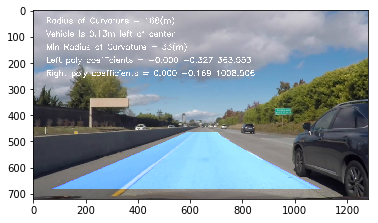

In [27]:
output = 'project_colour_challenge_video.mp4'
clip2 = VideoFileClip("./challenge_video.mp4")
output_clip = clip2.fl_image(image_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

In [28]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))


In [ ]:
output = 'project_output2_colour.mp4'
clip2 = VideoFileClip("./")
output_clip = clip2.fl_image(image_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))